In [1]:
#importing the necessary librry
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
%matplotlib inline
import warnings
from scipy.stats import kurtosis
warnings.filterwarnings("ignore")

In [2]:
#Loading the Dataset
df_train=pd.read_csv("D:/I/Project-Housing_splitted/train.csv")#train dataset
df_test=pd.read_csv("D:/I/Project-Housing_splitted/test.csv")#test dataset

In [3]:
#checking the sahpe
print(df_train.shape,df_test.shape)

(1168, 81) (292, 80)


Here we have 1168 rows and 81 columns in train data
similarly we have 292 rows and 80 columns in test data

In [4]:
#cheking the columns of Train Dataset
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [5]:
#checking the columns of Test data
df_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [6]:
#looking the top 5 ows from trainning data
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [7]:
#looking the top 5 rows from test dataset
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [8]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

# EDA TRAIN DATASET

In [8]:
#checking the data types of the trainning data set
df_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

On trainning Data set we have 3 types of data i.e →Object,int andfloat

In [9]:
#dropping the unneccery columns
df_train.drop("Id",axis=1,inplace=True)

In [10]:
#checking the shape if trainning data
print(df_train.shape)
#looking the first 5 rows of trainning data
df_train.head()

(1168, 80)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


After dropping the Id column we have 80 columns now

In [11]:
#lets define a function to see all kind of statistic data,nan values and IQR also
def stats(df):
    for i in df.columns:
        if df[i].dtypes!='object':
            k=df[i]
            cvar=k.mean()/k.std()#Coefficient of variation (CV)
            standard=k.std()#standard deviation
            krts=kurtosis(k)#Kurtosis
            m=k.mean()#mean
            mad=k.mad()#Median Absolute Deviation (MAD)
            skew=k.skew()#skewness
            variance=k.var()#variance
            Range=k.max()-k.min()#Range
            #Iqr
            Q1 = k.quantile(0.25)
            Q3 = k.quantile(0.75)
            IQR = Q3 - Q1
            des=df[i].describe()
            st=pd.DataFrame({"standard deviation":[standard],"Coefficient of variation":[cvar],
                             "Kurtosis":[krts],"mean":[m],"Median Absolute Deviation":[mad],
                             "skewness":[skew],"Variance":[variance],"Range":[Range],"IQR":[IQR]})
            print("column Name→→",i)
            print("Dtype=",df[i].dtype)
            print("\n")
            if df[i].skew()>0.55:
                print("This column Have Positive skewd Data")
            if df[i].skew()<-0.55:
                    print("This column Have Negetive skewd Data")
            print("\n")
            print(st)
            sns.set_style("whitegrid")
            sns.distplot(df[i], kde=True)
            plt.plot(skew,color='red',label=skew)
            plt.legend()
            st.plot(kind='bar')
            plt.show()
            print("column Describe")
            print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
            print(des)
            des.plot(kind='bar',color='red')
            plt.xticks(rotation=75)
            plt.show()
            print("\n")
            print("\n")
            print("\n")
        else:
            v=df[i].value_counts()
            print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
            print("Value Counts of column")
            print("\n")
            print(v)
            sns.countplot(x=df[i],data=df)
            print("columns Name→→",i)
            print("Dtype =",df[i].dtype)
            plt.xticks(rotation=75)
            plt.show()
            print("\n")
            print("\n")
            print("\n")
        nan=df[i].isnull().sum()    
        Nan=nan/len(df[i])
        if Nan ==0.0:
            print("No Nan Values Are Present")
            print("\n")
            print("\n")
        else:
            print("NaN Value % → →",Nan)
            print(nan,"    Nan values are present")
            print("\n")
            print("\n")
        print("►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►")

In [12]:
#value counts of objectives data
def val(df):
    c=df_train.columns
    for i in c:
        if df[i].dtypes=='object':
            sns.set_style("whitegrid")
            d=df[i].value_counts()
            print(d)
            sns.countplot(x=df[i],data=df)
            plt.plot(d,color='red',label=d)
            plt.legend()
            plt.show()
            #print("comment→",input())
            print("♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣")

column Name→→ MSSubClass
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis       mean  \
0            41.94065                  1.353531  1.685489  56.767979   

   Median Absolute Deviation  skewness   Variance  Range   IQR  
0                  30.927047  1.422019  1759.0181    170  50.0  


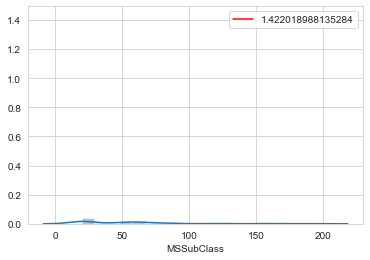

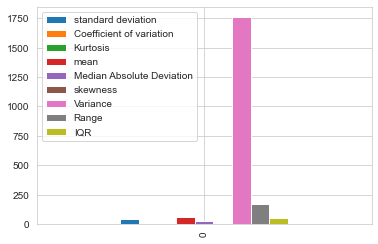

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean       56.767979
std        41.940650
min        20.000000
25%        20.000000
50%        50.000000
75%        70.000000
max       190.000000
Name: MSSubClass, dtype: float64


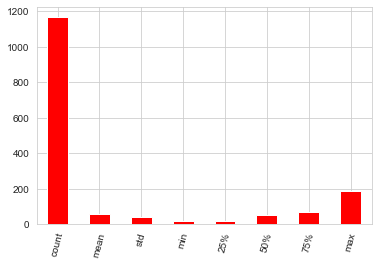







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
columns Name→→ MSZoning
Dtype = object


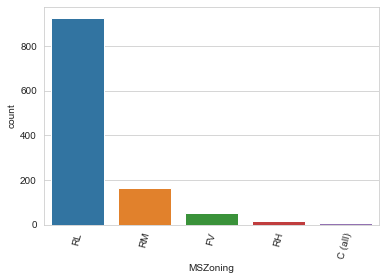







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ LotFrontage
Dtype= float64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis      mean  \
0            24.82875                  2.859124       NaN  70.98847   

   Median Absolute Deviation  skewness    Variance  Range   IQR  
0                  16.798848  2.450241  616.466813  292.0  20.0  


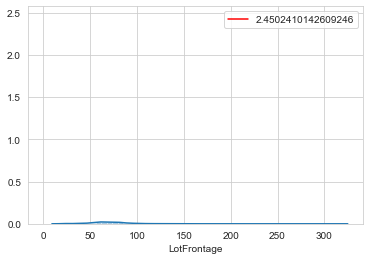

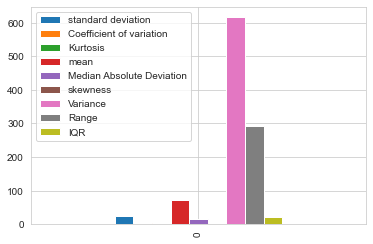

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    954.00000
mean      70.98847
std       24.82875
min       21.00000
25%       60.00000
50%       70.00000
75%       80.00000
max      313.00000
Name: LotFrontage, dtype: float64


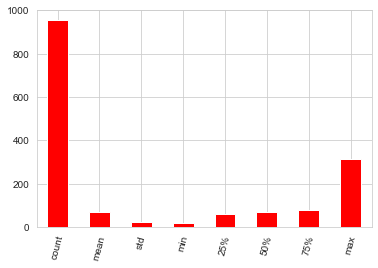







NaN Value % → → 0.1832191780821918
214     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ LotArea
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation    Kurtosis          mean  \
0         8957.442311                  1.170507  158.314819  10484.749144   

   Median Absolute Deviation   skewness      Variance   Range     IQR  
0                3629.266886  10.659285  8.023577e+07  163360  3894.0  


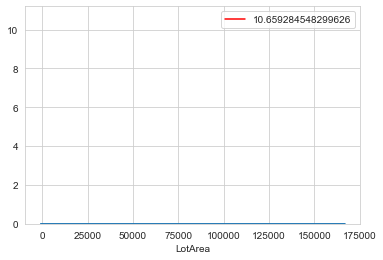

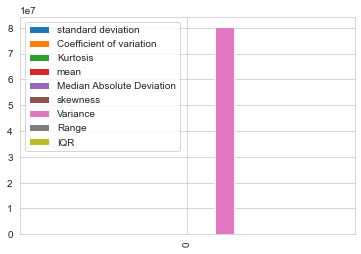

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count      1168.000000
mean      10484.749144
std        8957.442311
min        1300.000000
25%        7621.500000
50%        9522.500000
75%       11515.500000
max      164660.000000
Name: LotArea, dtype: float64


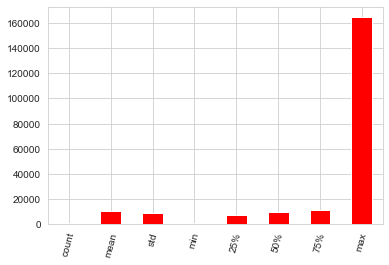







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Pave    1164
Grvl       4
Name: Street, dtype: int64
columns Name→→ Street
Dtype = object


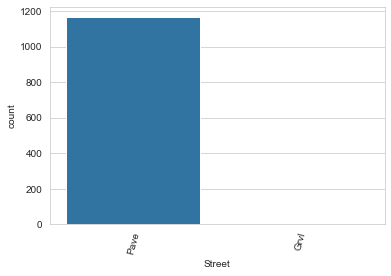







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Grvl    41
Pave    36
Name: Alley, dtype: int64
columns Name→→ Alley
Dtype = object


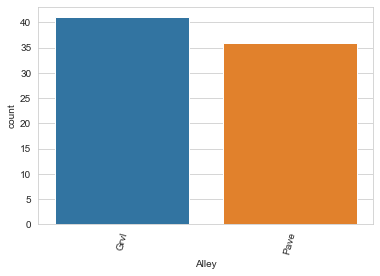







NaN Value % → → 0.9340753424657534
1091     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64
columns Name→→ LotShape
Dtype = object


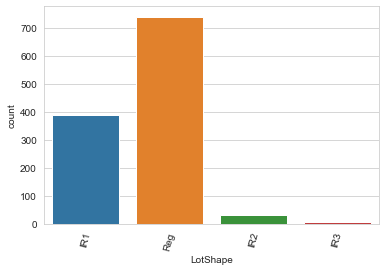







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64
columns Name→→ LandContour
Dtype = object


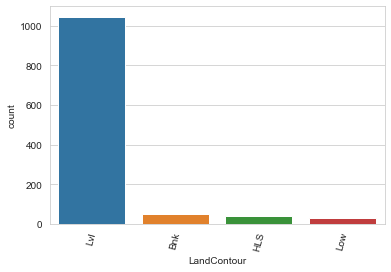







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


AllPub    1168
Name: Utilities, dtype: int64
columns Name→→ Utilities
Dtype = object


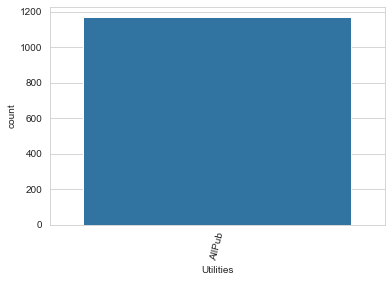







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64
columns Name→→ LotConfig
Dtype = object


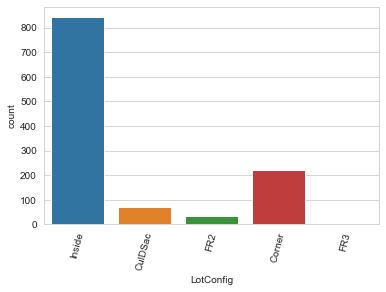







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64
columns Name→→ LandSlope
Dtype = object


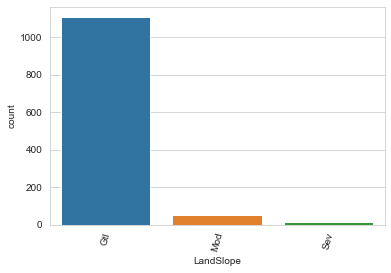







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
ClearCr     24
Timber      24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
Veenker      9
MeadowV      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64
columns Name→→ Neighborhood
Dtype = object


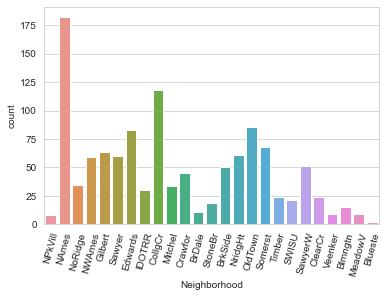







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64
columns Name→→ Condition1
Dtype = object


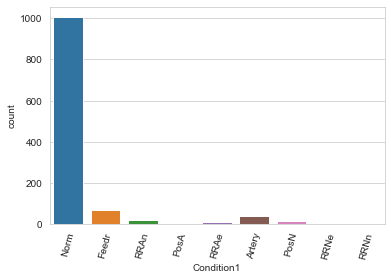







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Norm      1154
Feedr        6
PosN         2
Artery       2
PosA         1
RRAe         1
RRNn         1
RRAn         1
Name: Condition2, dtype: int64
columns Name→→ Condition2
Dtype = object


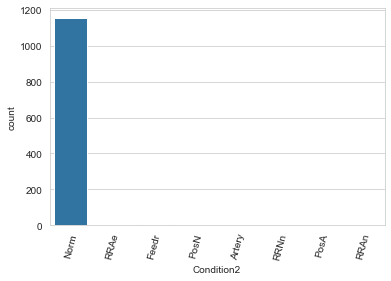







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64
columns Name→→ BldgType
Dtype = object


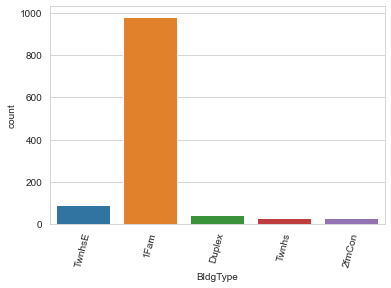







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64
columns Name→→ HouseStyle
Dtype = object


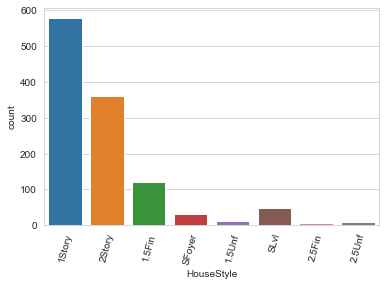







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ OverallQual
Dtype= int64




   standard deviation  Coefficient of variation  Kurtosis      mean  \
0            1.390153                  4.391209  0.132148  6.104452   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                    1.10534  0.175082  1.932525      9  2.0  


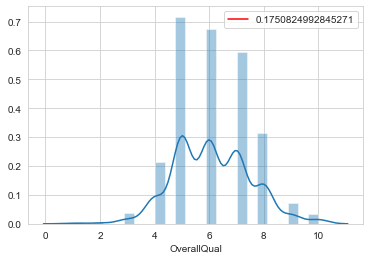

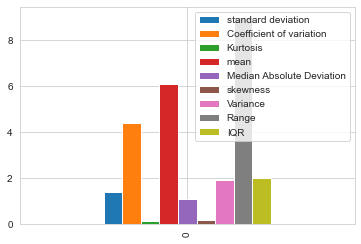

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        6.104452
std         1.390153
min         1.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: OverallQual, dtype: float64


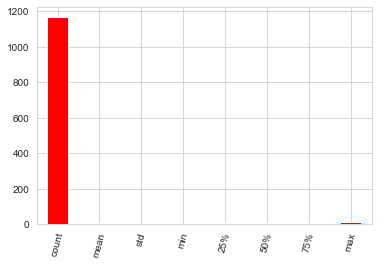







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ OverallCond
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis     mean  \
0            1.124343                  4.977031  1.001227  5.59589   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   0.902538  0.580714  1.264148      8  1.0  


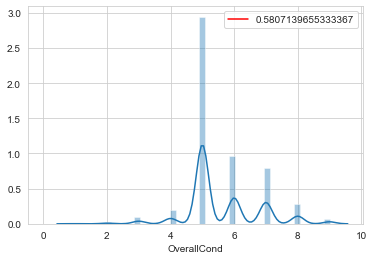

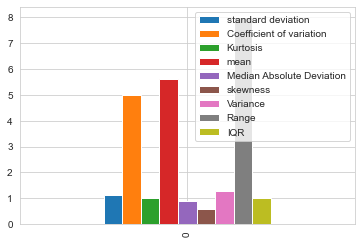

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        5.595890
std         1.124343
min         1.000000
25%         5.000000
50%         5.000000
75%         6.000000
max         9.000000
Name: OverallCond, dtype: float64


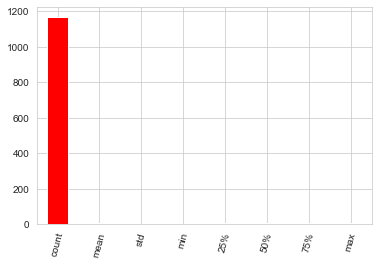







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ YearBuilt
Dtype= int64


This column Have Negetive skewd Data


   standard deviation  Coefficient of variation  Kurtosis         mean  \
0           30.145255                 65.381124 -0.506712  1970.930651   

   Median Absolute Deviation  skewness    Variance  Range   IQR  
0                  25.034884 -0.579204  908.736403    135  46.0  


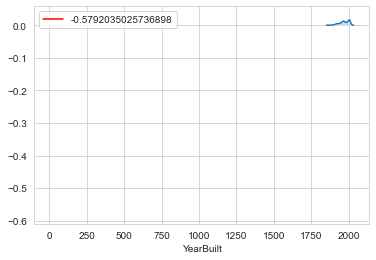

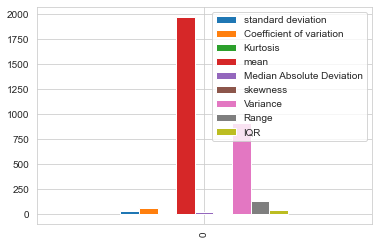

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean     1970.930651
std        30.145255
min      1875.000000
25%      1954.000000
50%      1972.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64


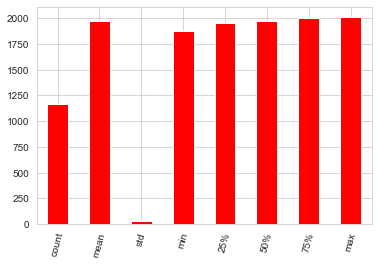







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ YearRemodAdd
Dtype= int64




   standard deviation  Coefficient of variation  Kurtosis         mean  \
0           20.785185                 95.489097 -1.291811  1984.758562   

   Median Absolute Deviation  skewness   Variance  Range   IQR  
0                  18.776107 -0.495864  432.02392     60  38.0  


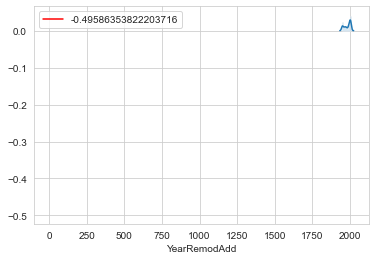

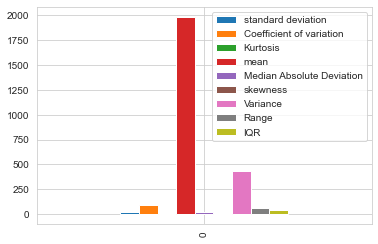

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean     1984.758562
std        20.785185
min      1950.000000
25%      1966.000000
50%      1993.000000
75%      2004.000000
max      2010.000000
Name: YearRemodAdd, dtype: float64


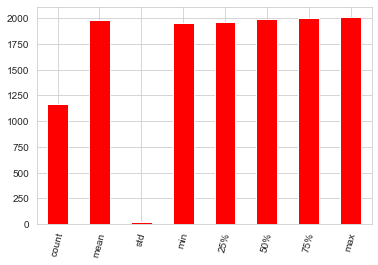







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64
columns Name→→ RoofStyle
Dtype = object


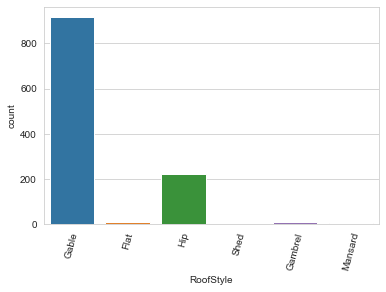







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Metal         1
Roll          1
Membran       1
ClyTile       1
Name: RoofMatl, dtype: int64
columns Name→→ RoofMatl
Dtype = object


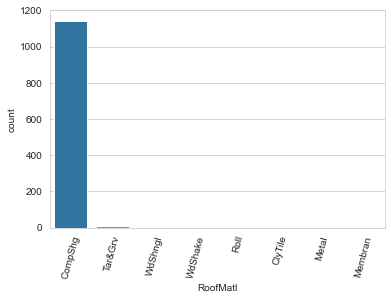







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
ImStucc      1
BrkComm      1
Name: Exterior1st, dtype: int64
columns Name→→ Exterior1st
Dtype = object


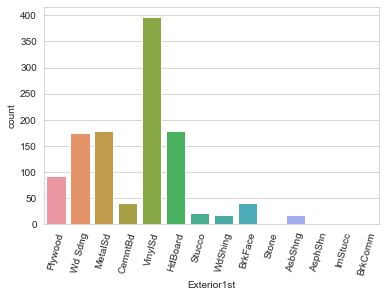







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64
columns Name→→ Exterior2nd
Dtype = object


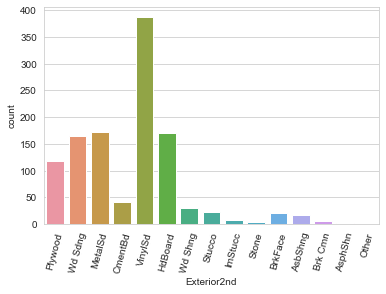







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


None       696
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64
columns Name→→ MasVnrType
Dtype = object


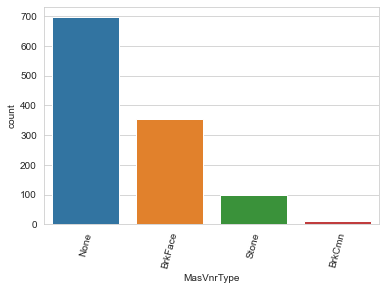







NaN Value % → → 0.0059931506849315065
7     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ MasVnrArea
Dtype= float64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis        mean  \
0          182.595606                   0.56031       NaN  102.310078   

   Median Absolute Deviation  skewness      Variance   Range    IQR  
0                 128.522431  2.826173  33341.155493  1600.0  160.0  


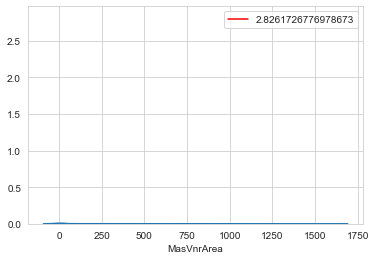

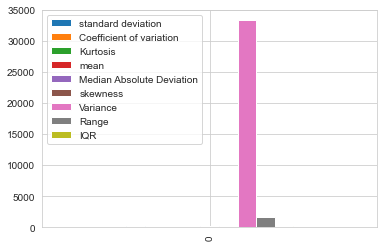

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1161.000000
mean      102.310078
std       182.595606
min         0.000000
25%         0.000000
50%         0.000000
75%       160.000000
max      1600.000000
Name: MasVnrArea, dtype: float64


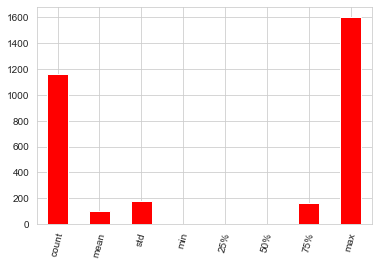







NaN Value % → → 0.0059931506849315065
7     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64
columns Name→→ ExterQual
Dtype = object


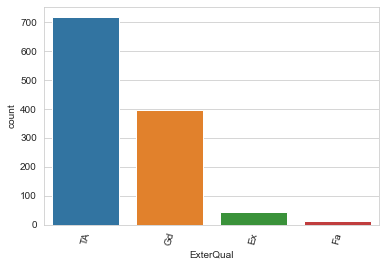







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64
columns Name→→ ExterCond
Dtype = object


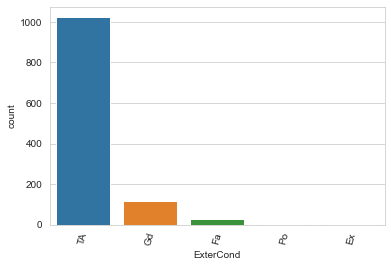







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64
columns Name→→ Foundation
Dtype = object


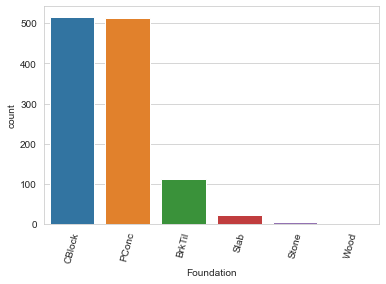







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64
columns Name→→ BsmtQual
Dtype = object


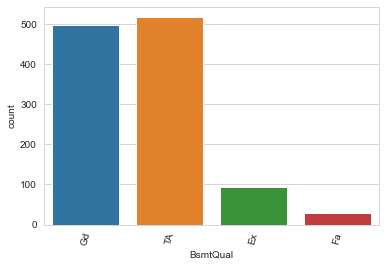







NaN Value % → → 0.025684931506849314
30     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64
columns Name→→ BsmtCond
Dtype = object


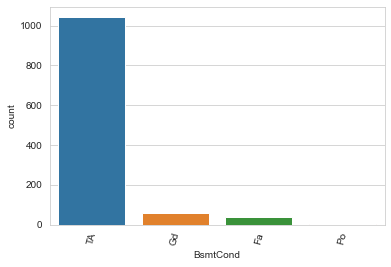







NaN Value % → → 0.025684931506849314
30     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


No    756
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64
columns Name→→ BsmtExposure
Dtype = object


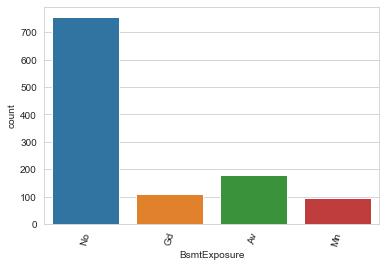







NaN Value % → → 0.026541095890410957
31     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64
columns Name→→ BsmtFinType1
Dtype = object


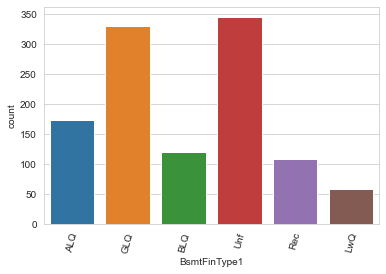







NaN Value % → → 0.025684931506849314
30     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ BsmtFinSF1
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation   Kurtosis        mean  \
0          462.664785                  0.961227  13.118816  444.726027   

   Median Absolute Deviation  skewness       Variance  Range    IQR  
0                 369.302355  1.871606  214058.702938   5644  714.5  


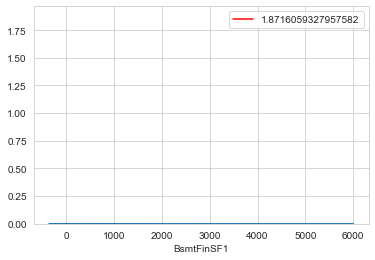

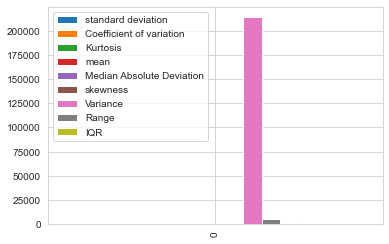

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean      444.726027
std       462.664785
min         0.000000
25%         0.000000
50%       385.500000
75%       714.500000
max      5644.000000
Name: BsmtFinSF1, dtype: float64


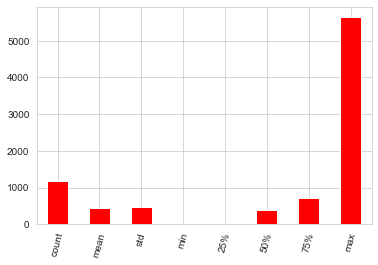







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64
columns Name→→ BsmtFinType2
Dtype = object


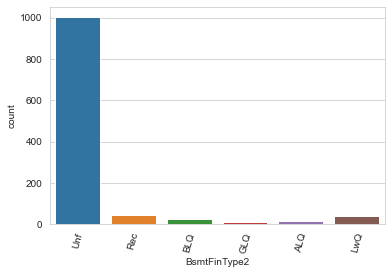







NaN Value % → → 0.026541095890410957
31     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ BsmtFinSF2
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation   Kurtosis      mean  \
0          163.520016                  0.285269  21.053012  46.64726   

   Median Absolute Deviation  skewness      Variance  Range  IQR  
0                  82.539137  4.365829  26738.795777   1474  0.0  


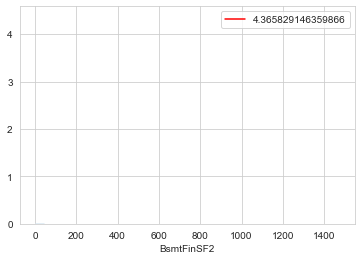

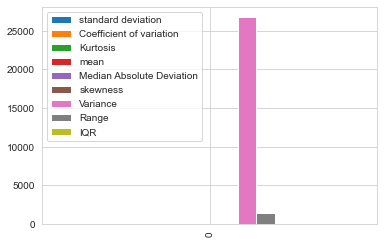

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean       46.647260
std       163.520016
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1474.000000
Name: BsmtFinSF2, dtype: float64


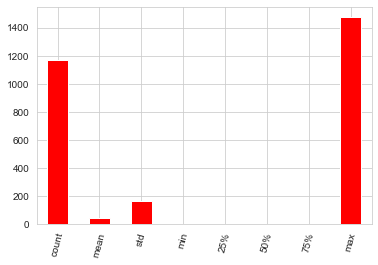







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ BsmtUnfSF
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis        mean  \
0          449.375525                  1.267808  0.413238  569.721747   

   Median Absolute Deviation  skewness       Variance  Range    IQR  
0                 360.344023  0.909057  201938.362097   2336  600.0  


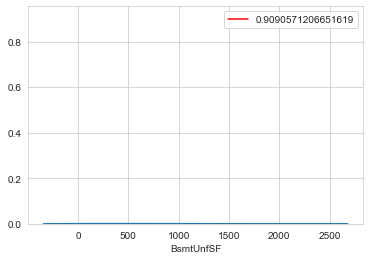

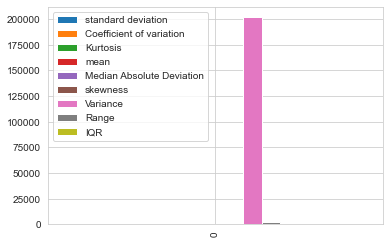

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean      569.721747
std       449.375525
min         0.000000
25%       216.000000
50%       474.000000
75%       816.000000
max      2336.000000
Name: BsmtUnfSF, dtype: float64


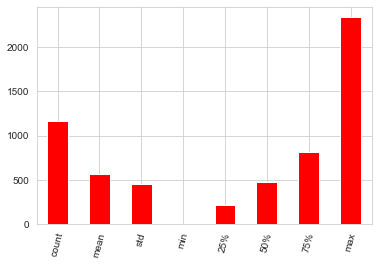







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ TotalBsmtSF
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation   Kurtosis         mean  \
0          442.272249                   2.39919  15.624413  1061.095034   

   Median Absolute Deviation  skewness      Variance  Range    IQR  
0                 318.615475  1.744591  195604.74246   6110  492.5  


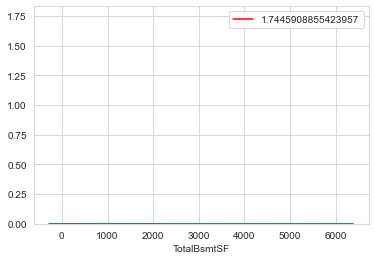

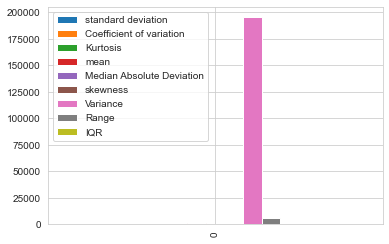

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean     1061.095034
std       442.272249
min         0.000000
25%       799.000000
50%      1005.500000
75%      1291.500000
max      6110.000000
Name: TotalBsmtSF, dtype: float64


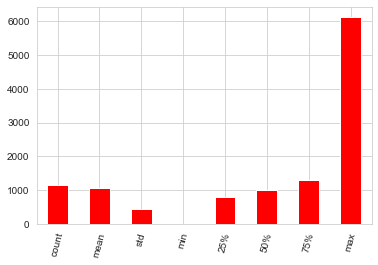







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


GasA     1143
GasW       14
Grav        5
Wall        4
OthW        1
Floor       1
Name: Heating, dtype: int64
columns Name→→ Heating
Dtype = object


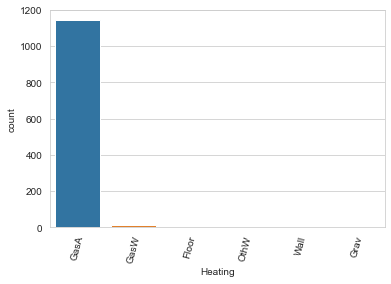







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64
columns Name→→ HeatingQC
Dtype = object


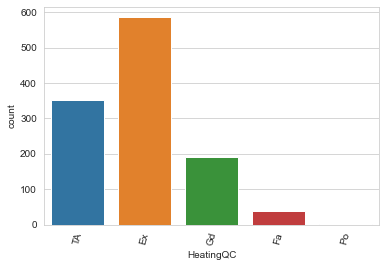







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Y    1090
N      78
Name: CentralAir, dtype: int64
columns Name→→ CentralAir
Dtype = object


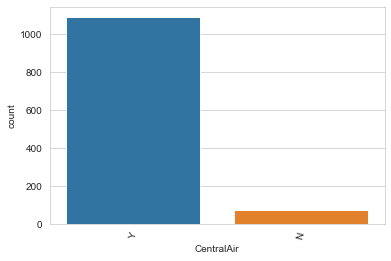







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64
columns Name→→ Electrical
Dtype = object


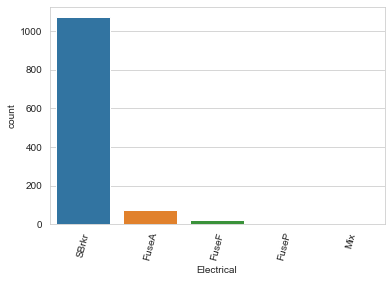







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ 1stFlrSF
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis         mean  \
0          391.161983                  2.990731  6.766983  1169.860445   

   Median Absolute Deviation  skewness       Variance  Range    IQR  
0                 299.996273  1.513707  153007.696875   4358  500.0  


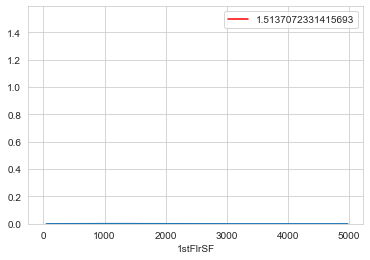

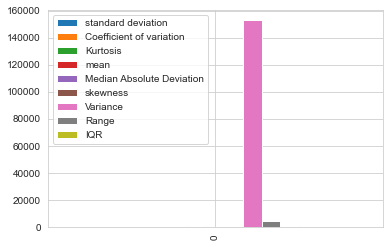

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean     1169.860445
std       391.161983
min       334.000000
25%       892.000000
50%      1096.500000
75%      1392.000000
max      4692.000000
Name: 1stFlrSF, dtype: float64


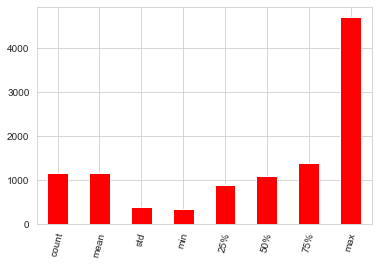







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ 2ndFlrSF
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis        mean  \
0           439.69637                  0.793334 -0.522786  348.826199   

   Median Absolute Deviation  skewness       Variance  Range    IQR  
0                 398.533632  0.823479  193332.897788   2065  729.0  


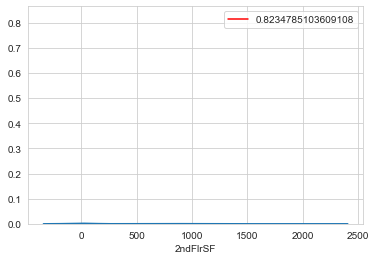

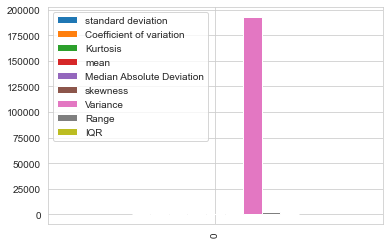

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean      348.826199
std       439.696370
min         0.000000
25%         0.000000
50%         0.000000
75%       729.000000
max      2065.000000
Name: 2ndFlrSF, dtype: float64


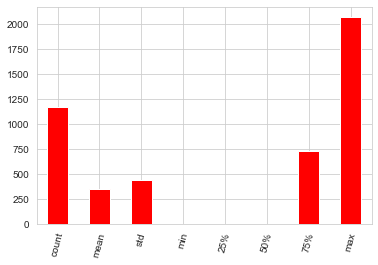







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ LowQualFinSF
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation   Kurtosis      mean  \
0           50.892844                  0.125364  76.575476  6.380137   

   Median Absolute Deviation  skewness     Variance  Range  IQR  
0                  12.509001  8.666142  2590.081593    572  0.0  


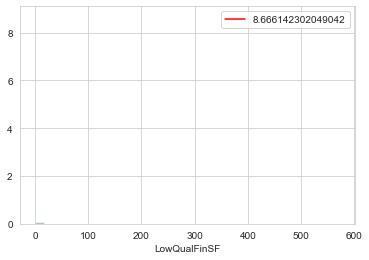

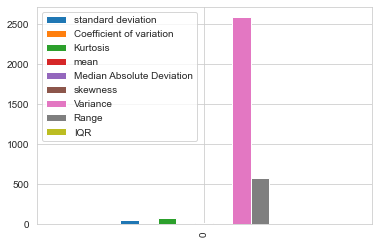

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        6.380137
std        50.892844
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       572.000000
Name: LowQualFinSF, dtype: float64


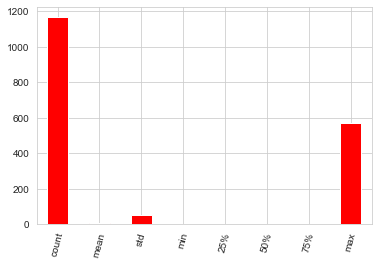







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ GrLivArea
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis         mean  \
0          528.042957                  2.888149   5.60424  1525.066781   

   Median Absolute Deviation  skewness      Variance  Range     IQR  
0                 399.367022  1.449952  278829.36486   5308  651.75  


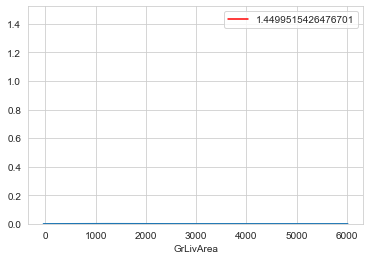

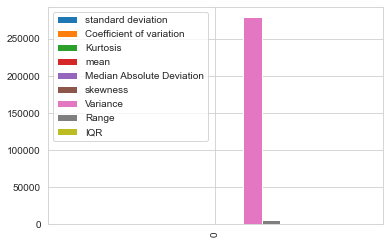

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean     1525.066781
std       528.042957
min       334.000000
25%      1143.250000
50%      1468.500000
75%      1795.000000
max      5642.000000
Name: GrLivArea, dtype: float64


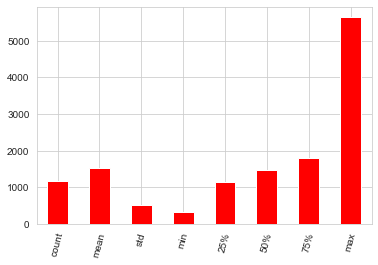







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ BsmtFullBath
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis      mean  \
0            0.521615                  0.815762 -0.714406  0.425514   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   0.499833  0.627106  0.272082      3  1.0  


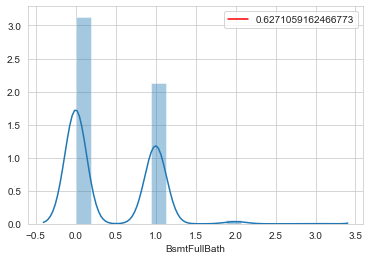

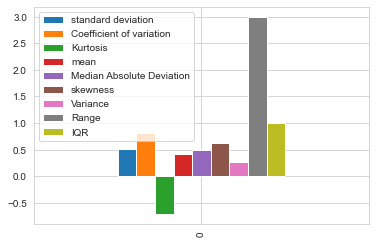

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        0.425514
std         0.521615
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         3.000000
Name: BsmtFullBath, dtype: float64


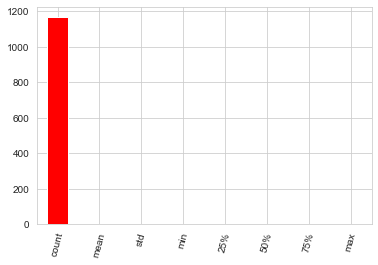







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ BsmtHalfBath
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation   Kurtosis      mean  \
0            0.236699                  0.235112  18.067708  0.055651   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   0.105298  4.264403  0.056026      2  0.0  


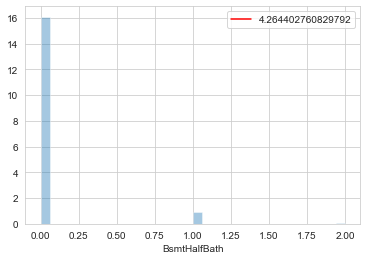

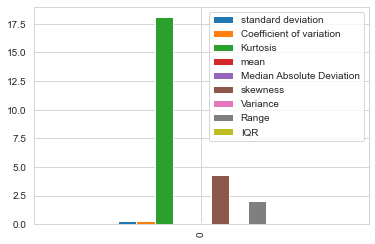

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        0.055651
std         0.236699
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: BsmtHalfBath, dtype: float64


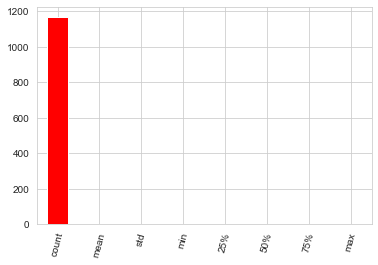







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ FullBath
Dtype= int64




   standard deviation  Coefficient of variation  Kurtosis    mean  \
0            0.551882                  2.831221 -0.856763  1.5625   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   0.523438  0.057809  0.304574      3  1.0  


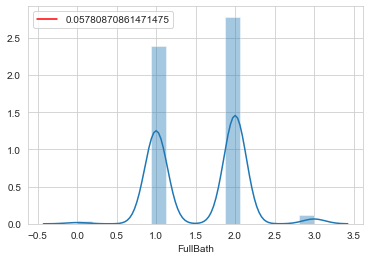

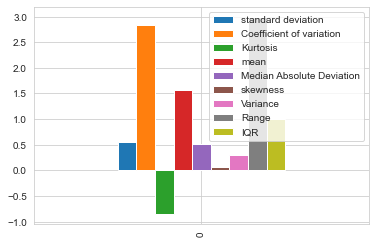

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        1.562500
std         0.551882
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: FullBath, dtype: float64


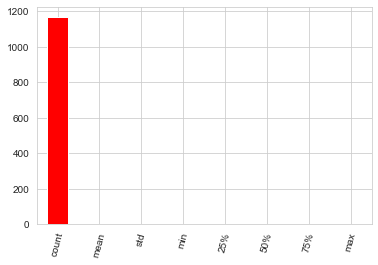







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ HalfBath
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis      mean  \
0            0.504929                  0.769808 -1.092934  0.388699   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                    0.48188  0.656492  0.254954      2  1.0  


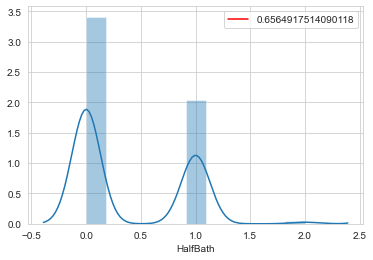

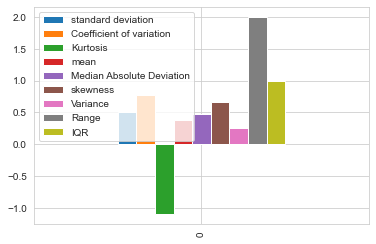

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        0.388699
std         0.504929
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         2.000000
Name: HalfBath, dtype: float64


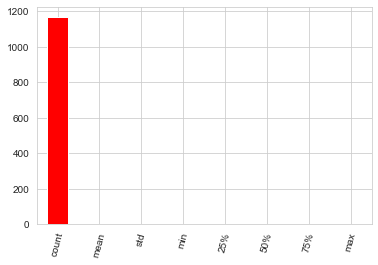







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ BedroomAbvGr
Dtype= int64




   standard deviation  Coefficient of variation  Kurtosis      mean  \
0            0.817229                   3.52951  2.260694  2.884418   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                    0.57115  0.243855  0.667863      8  1.0  


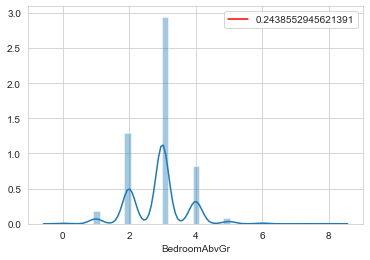

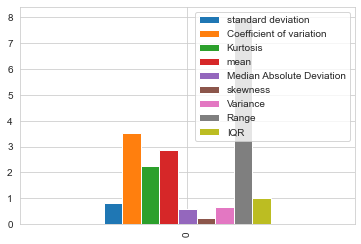

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        2.884418
std         0.817229
min         0.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         8.000000
Name: BedroomAbvGr, dtype: float64


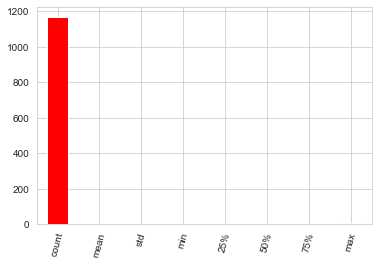







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ KitchenAbvGr
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation   Kurtosis      mean  \
0            0.216292                  4.833166  20.112372  1.045377   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   0.088348  4.365259  0.046782      3  0.0  


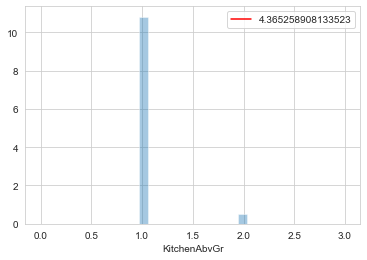

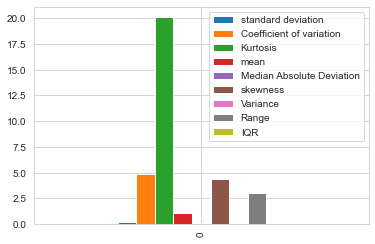

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        1.045377
std         0.216292
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: KitchenAbvGr, dtype: float64


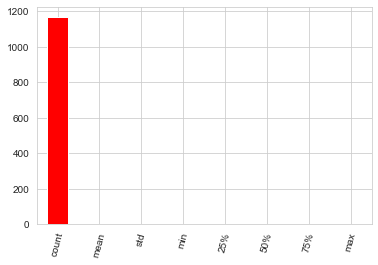







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64
columns Name→→ KitchenQual
Dtype = object


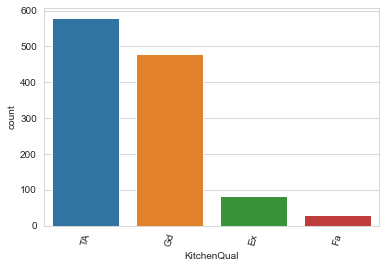







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ TotRmsAbvGrd
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis      mean  \
0            1.598484                  4.093135  0.793324  6.542808   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   1.263353  0.644657   2.55515     12  2.0  


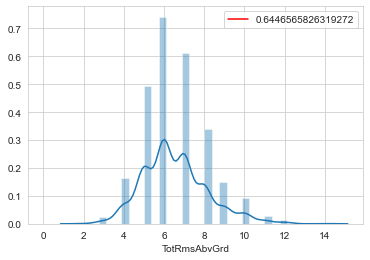

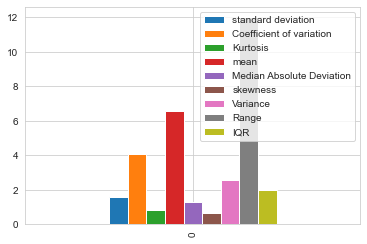

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        6.542808
std         1.598484
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        14.000000
Name: TotRmsAbvGrd, dtype: float64


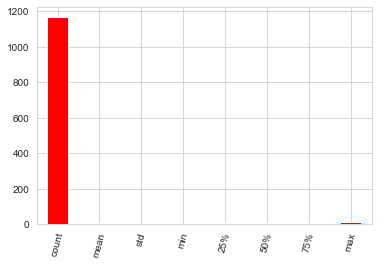







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64
columns Name→→ Functional
Dtype = object


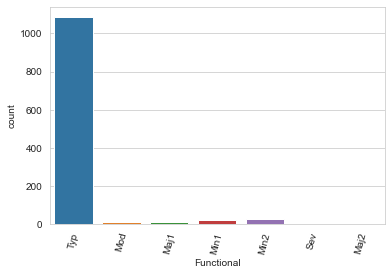







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ Fireplaces
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis      mean  \
0            0.650575                  0.948844 -0.147257  0.617295   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   0.582413  0.671966  0.423248      3  1.0  


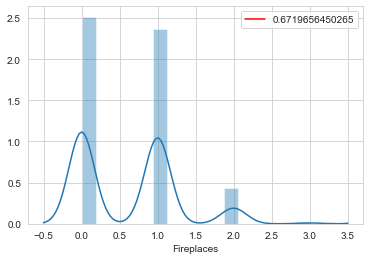

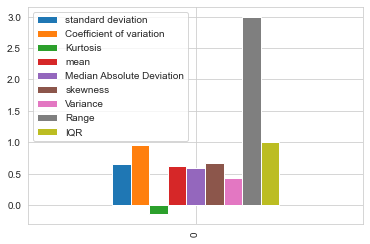

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        0.617295
std         0.650575
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: Fireplaces, dtype: float64


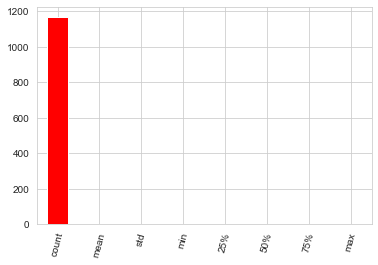







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64
columns Name→→ FireplaceQu
Dtype = object


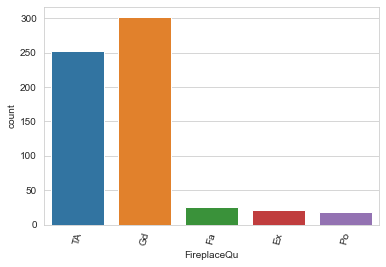







NaN Value % → → 0.4717465753424658
551     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Attchd     691
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64
columns Name→→ GarageType
Dtype = object


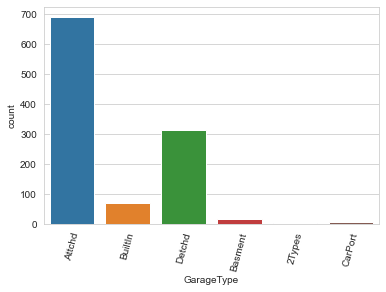







NaN Value % → → 0.0547945205479452
64     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ GarageYrBlt
Dtype= float64


This column Have Negetive skewd Data


   standard deviation  Coefficient of variation  Kurtosis         mean  \
0           24.890704                 79.475206       NaN  1978.193841   

   Median Absolute Deviation  skewness    Variance  Range   IQR  
0                  21.110675 -0.644564  619.547161  110.0  41.0  


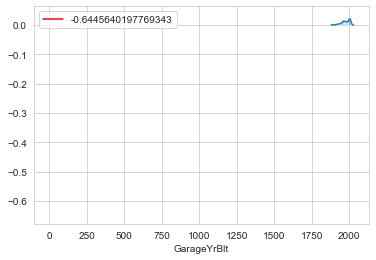

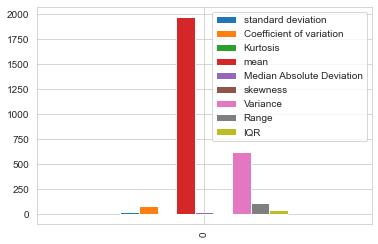

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1104.000000
mean     1978.193841
std        24.890704
min      1900.000000
25%      1961.000000
50%      1980.000000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64


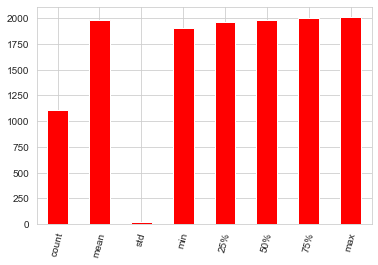







NaN Value % → → 0.0547945205479452
64     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Unf    487
RFn    339
Fin    278
Name: GarageFinish, dtype: int64
columns Name→→ GarageFinish
Dtype = object


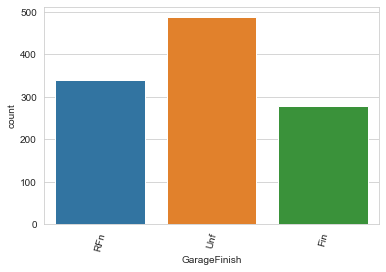







NaN Value % → → 0.0547945205479452
64     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ GarageCars
Dtype= int64




   standard deviation  Coefficient of variation  Kurtosis      mean  \
0            0.745554                  2.382848  0.250472  1.776541   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   0.577641 -0.358556   0.55585      4  1.0  


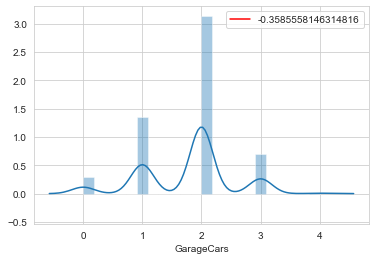

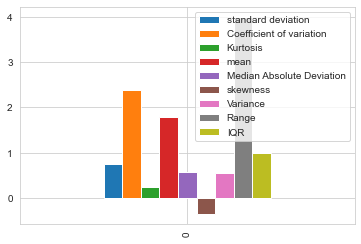

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        1.776541
std         0.745554
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: GarageCars, dtype: float64


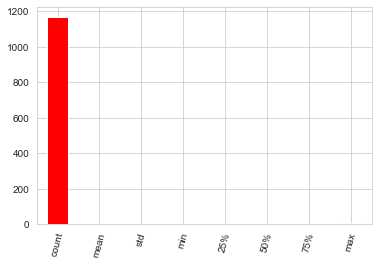







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ GarageArea
Dtype= int64




   standard deviation  Coefficient of variation  Kurtosis        mean  \
0          214.466769                   2.22347  1.039541  476.860445   

   Median Absolute Deviation  skewness      Variance  Range    IQR  
0                 159.802864  0.189665  45995.995075   1418  238.0  


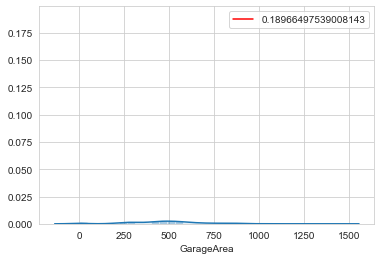

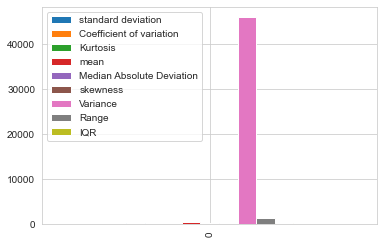

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean      476.860445
std       214.466769
min         0.000000
25%       338.000000
50%       480.000000
75%       576.000000
max      1418.000000
Name: GarageArea, dtype: float64


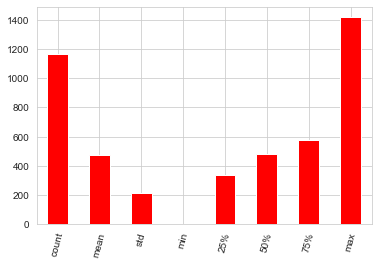







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


TA    1050
Fa      39
Gd      11
Po       2
Ex       2
Name: GarageQual, dtype: int64
columns Name→→ GarageQual
Dtype = object


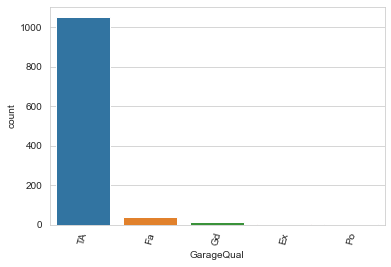







NaN Value % → → 0.0547945205479452
64     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


TA    1061
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64
columns Name→→ GarageCond
Dtype = object


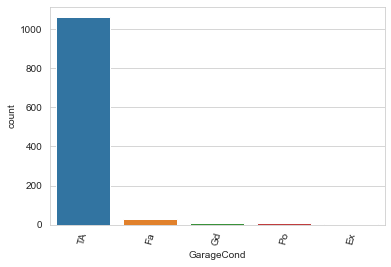







NaN Value % → → 0.0547945205479452
64     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64
columns Name→→ PavedDrive
Dtype = object


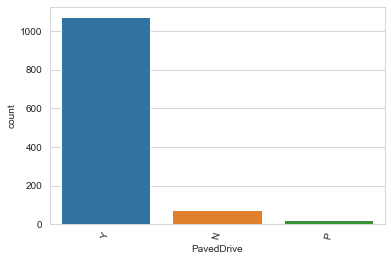







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ WoodDeckSF
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis       mean  \
0          126.158988                   0.76258  2.873623  96.206336   

   Median Absolute Deviation  skewness      Variance  Range    IQR  
0                  103.06065  1.504929  15916.090208    857  171.0  


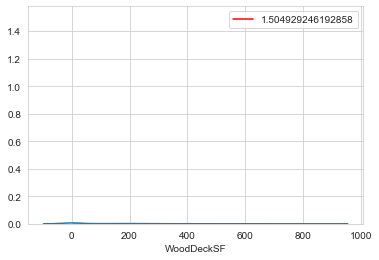

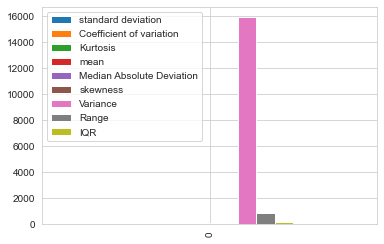

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean       96.206336
std       126.158988
min         0.000000
25%         0.000000
50%         0.000000
75%       171.000000
max       857.000000
Name: WoodDeckSF, dtype: float64


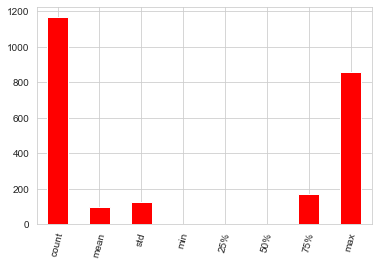







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ OpenPorchSF
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis       mean  \
0           66.381023                  0.701404  9.126708  46.559932   

   Median Absolute Deviation  skewness     Variance  Range   IQR  
0                  47.926282   2.41084  4406.440278    547  70.0  


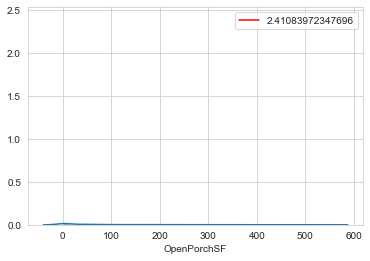

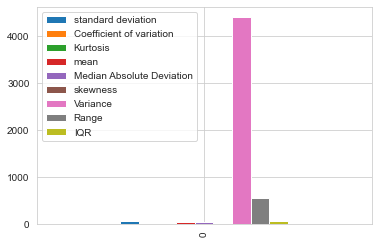

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean       46.559932
std        66.381023
min         0.000000
25%         0.000000
50%        24.000000
75%        70.000000
max       547.000000
Name: OpenPorchSF, dtype: float64


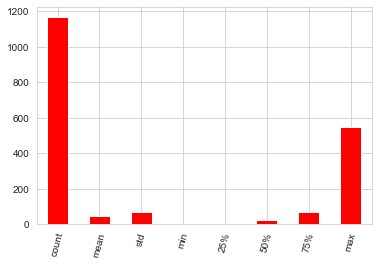







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ EnclosedPorch
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation   Kurtosis       mean  \
0           63.191089                  0.364219  10.104352  23.015411   

   Median Absolute Deviation  skewness    Variance  Range  IQR  
0                   39.37054   3.04361  3993.11373    552  0.0  


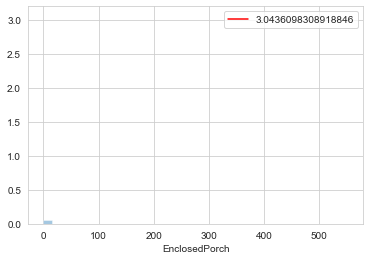

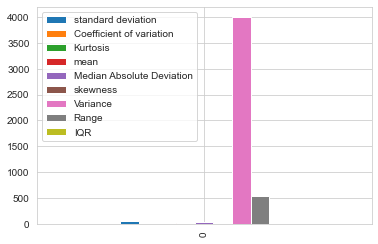

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean       23.015411
std        63.191089
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       552.000000
Name: EnclosedPorch, dtype: float64


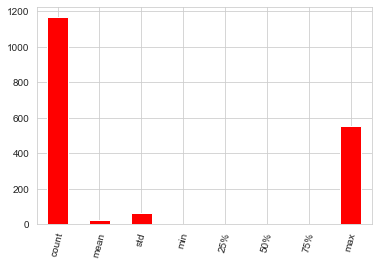







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ 3SsnPorch
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation    Kurtosis      mean  \
0           29.088867                  0.125118  115.743058  3.639555   

   Median Absolute Deviation  skewness   Variance  Range  IQR  
0                   7.142003  9.770611  846.16217    508  0.0  


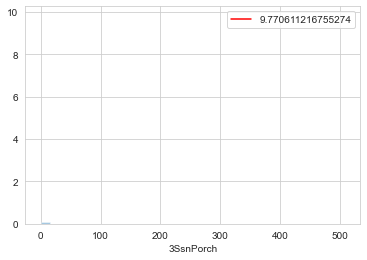

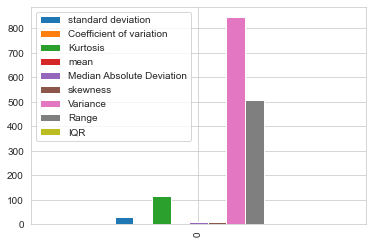

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        3.639555
std        29.088867
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       508.000000
Name: 3SsnPorch, dtype: float64


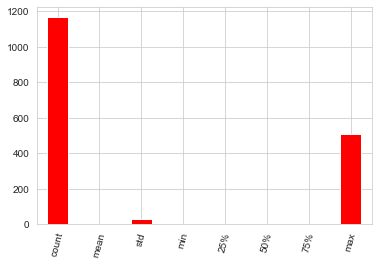







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ ScreenPorch
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation   Kurtosis      mean  \
0           55.080816                   0.27326  18.551207  15.05137   

   Median Absolute Deviation  skewness     Variance  Range  IQR  
0                  27.654315  4.105741  3033.896245    480  0.0  


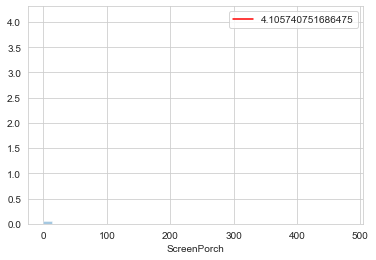

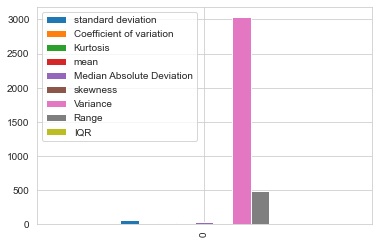

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean       15.051370
std        55.080816
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       480.000000
Name: ScreenPorch, dtype: float64


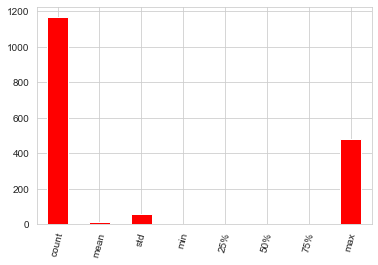







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ PoolArea
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation    Kurtosis     mean  \
0           44.896939                  0.076812  177.012229  3.44863   

   Median Absolute Deviation   skewness     Variance  Range  IQR  
0                   6.855924  13.243711  2015.735148    738  0.0  


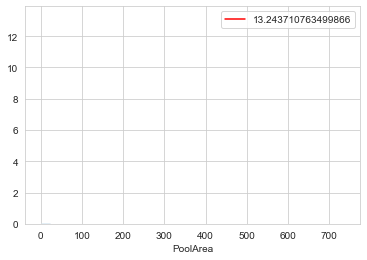

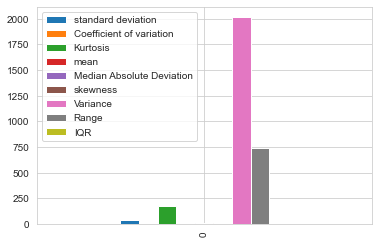

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        3.448630
std        44.896939
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       738.000000
Name: PoolArea, dtype: float64


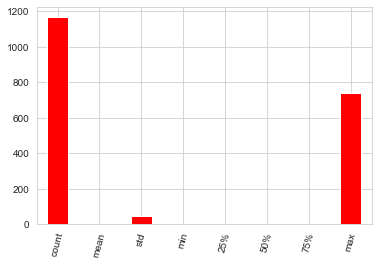







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Gd    3
Ex    2
Fa    2
Name: PoolQC, dtype: int64
columns Name→→ PoolQC
Dtype = object


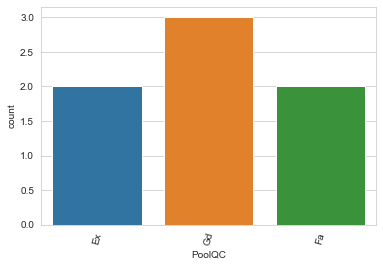







NaN Value % → → 0.9940068493150684
1161     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


MnPrv    129
GdPrv     51
GdWo      47
MnWw      10
Name: Fence, dtype: int64
columns Name→→ Fence
Dtype = object


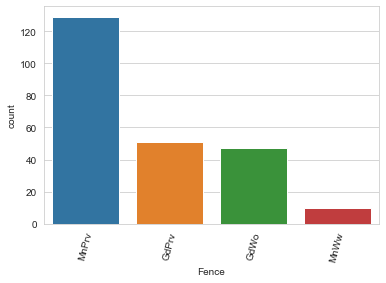







NaN Value % → → 0.7970890410958904
931     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Shed    40
Gar2     2
TenC     1
Othr     1
Name: MiscFeature, dtype: int64
columns Name→→ MiscFeature
Dtype = object


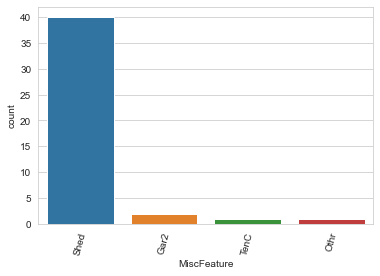







NaN Value % → → 0.9623287671232876
1124     Nan values are present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ MiscVal
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation    Kurtosis       mean  \
0          543.264432                  0.087094  605.123508  47.315068   

   Median Absolute Deviation   skewness       Variance  Range  IQR  
0                  91.227341  23.065943  295136.243406  15500  0.0  


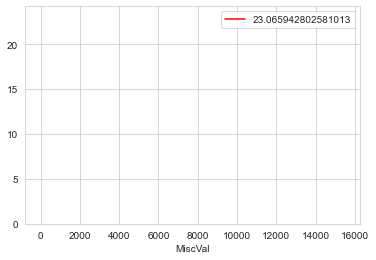

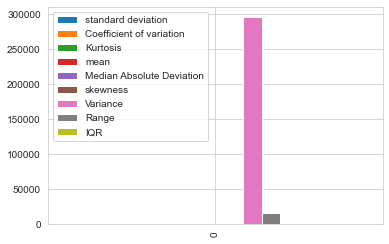

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count     1168.000000
mean        47.315068
std        543.264432
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      15500.000000
Name: MiscVal, dtype: float64


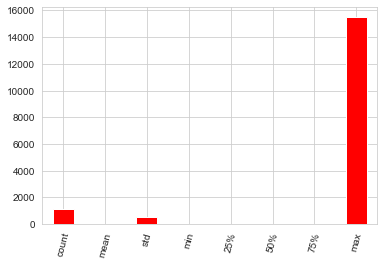







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ MoSold
Dtype= int64




   standard deviation  Coefficient of variation  Kurtosis      mean  \
0            2.686352                  2.361633 -0.400786  6.344178   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   2.131363  0.220979  7.216487     11  3.0  


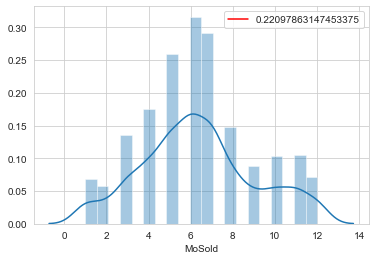

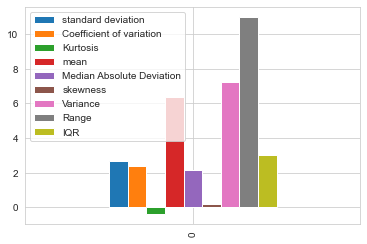

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean        6.344178
std         2.686352
min         1.000000
25%         5.000000
50%         6.000000
75%         8.000000
max        12.000000
Name: MoSold, dtype: float64


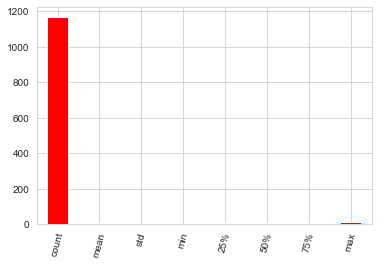







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ YrSold
Dtype= int64




   standard deviation  Coefficient of variation  Kurtosis         mean  \
0            1.329738               1509.925081 -1.180213  2007.804795   

   Median Absolute Deviation  skewness  Variance  Range  IQR  
0                   1.148773  0.115765  1.768203      4  2.0  


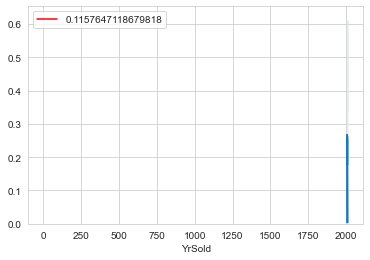

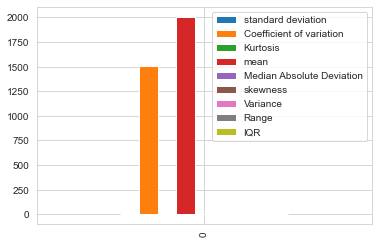

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count    1168.000000
mean     2007.804795
std         1.329738
min      2006.000000
25%      2007.000000
50%      2008.000000
75%      2009.000000
max      2010.000000
Name: YrSold, dtype: float64


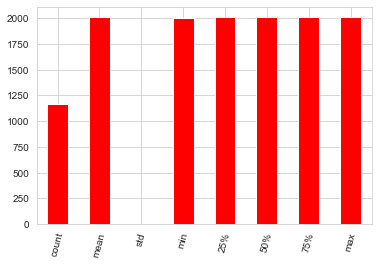







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
CWD        3
Oth        3
Con        2
Name: SaleType, dtype: int64
columns Name→→ SaleType
Dtype = object


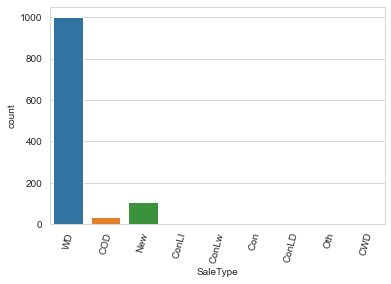







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Value Counts of column


Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64
columns Name→→ SaleCondition
Dtype = object


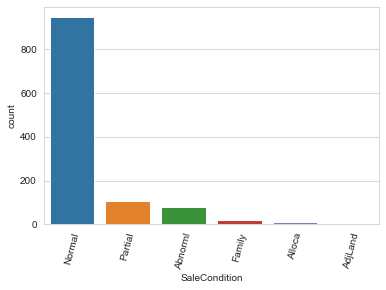







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
column Name→→ SalePrice
Dtype= int64


This column Have Positive skewd Data


   standard deviation  Coefficient of variation  Kurtosis           mean  \
0        79105.586863                  2.294111  7.353924  181477.005993   

   Median Absolute Deviation  skewness      Variance   Range      IQR  
0               57195.587868  1.953878  6.257694e+09  720100  84625.0  


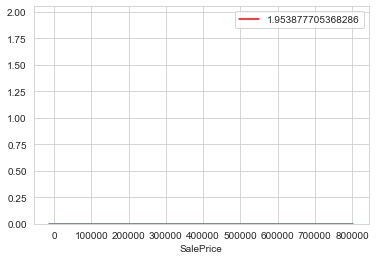

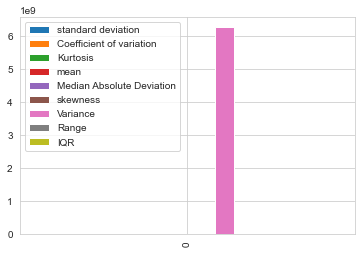

column Describe
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
count      1168.000000
mean     181477.005993
std       79105.586863
min       34900.000000
25%      130375.000000
50%      163995.000000
75%      215000.000000
max      755000.000000
Name: SalePrice, dtype: float64


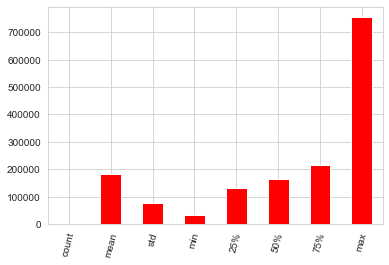







No Nan Values Are Present




►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [13]:
#lets call the stats function
stats(df_train)

From all above chart we got to know that Null values Percentage,min,max,mean(),median(),skewed data .Kurtosis and etc.

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


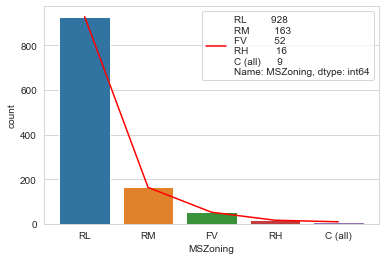

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Pave    1164
Grvl       4
Name: Street, dtype: int64


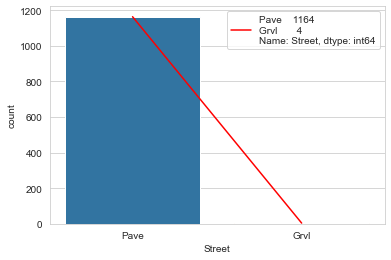

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Grvl    41
Pave    36
Name: Alley, dtype: int64


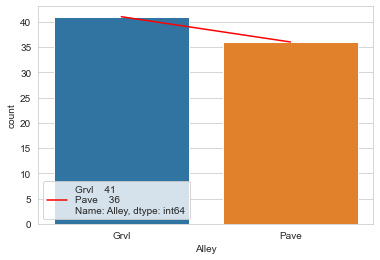

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


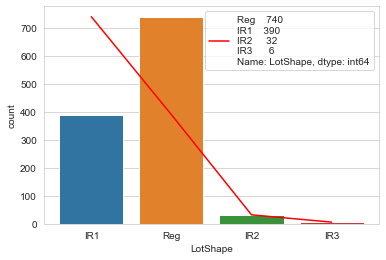

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


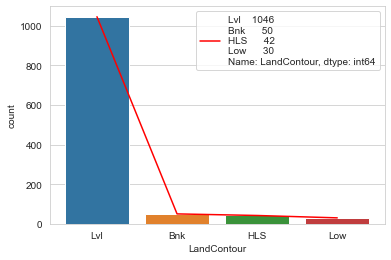

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
AllPub    1168
Name: Utilities, dtype: int64


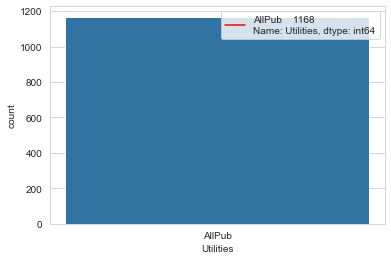

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


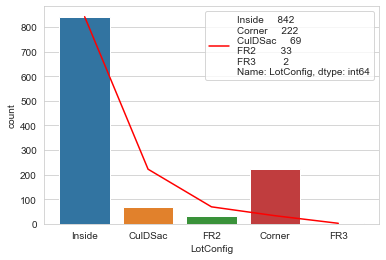

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


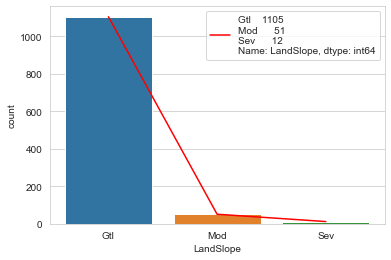

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
ClearCr     24
Timber      24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
Veenker      9
MeadowV      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


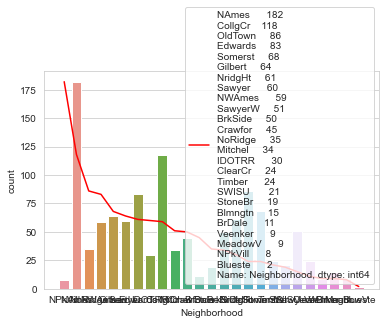

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


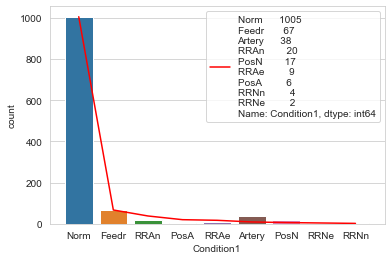

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Norm      1154
Feedr        6
PosN         2
Artery       2
PosA         1
RRAe         1
RRNn         1
RRAn         1
Name: Condition2, dtype: int64


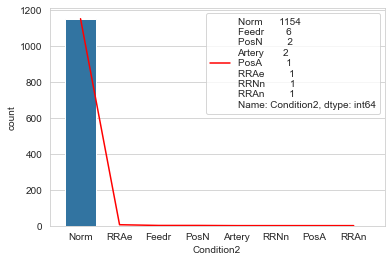

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


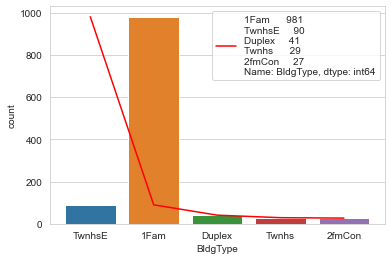

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


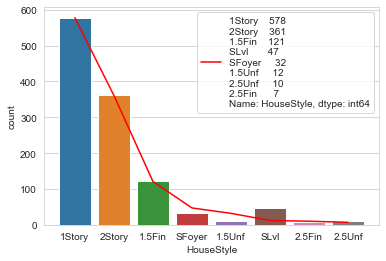

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


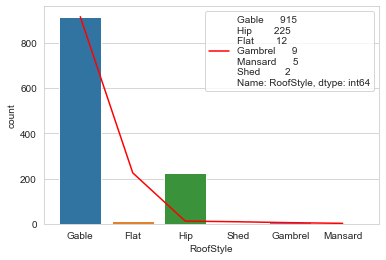

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Metal         1
Roll          1
Membran       1
ClyTile       1
Name: RoofMatl, dtype: int64


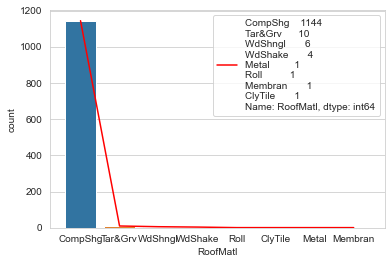

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
WdShing     19
AsbShng     19
Stone        2
AsphShn      1
ImStucc      1
BrkComm      1
Name: Exterior1st, dtype: int64


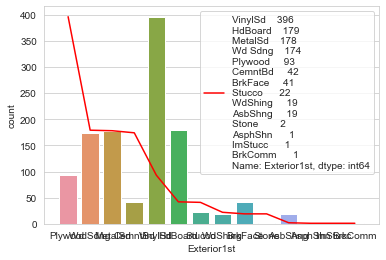

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


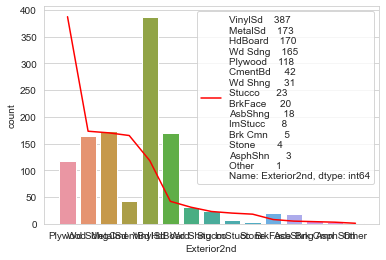

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
None       696
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


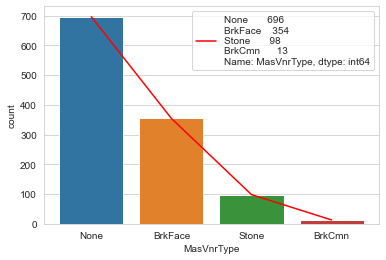

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


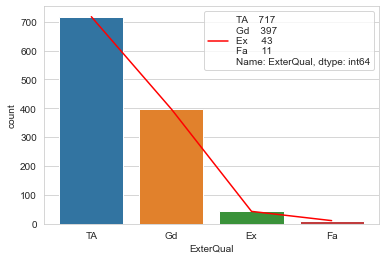

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


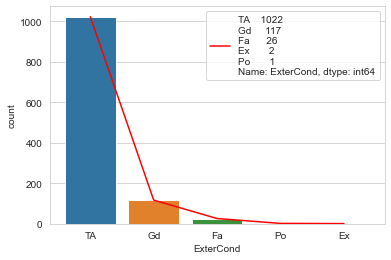

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


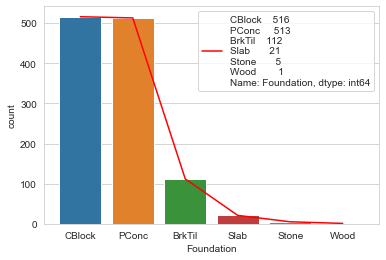

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64


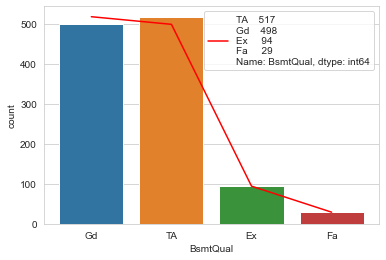

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64


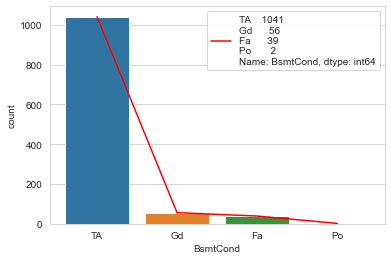

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
No    756
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64


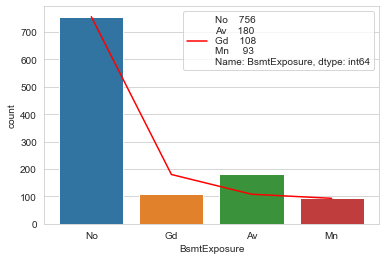

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


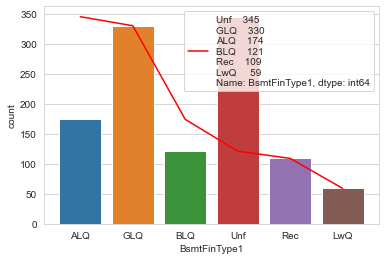

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


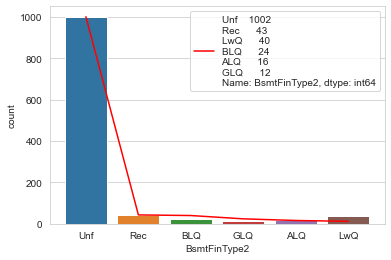

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
GasA     1143
GasW       14
Grav        5
Wall        4
OthW        1
Floor       1
Name: Heating, dtype: int64


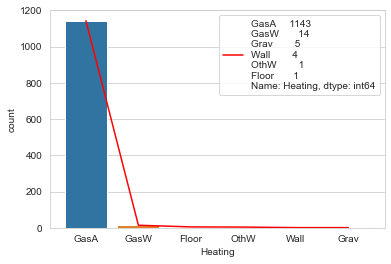

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


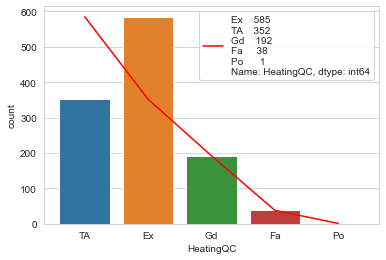

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Y    1090
N      78
Name: CentralAir, dtype: int64


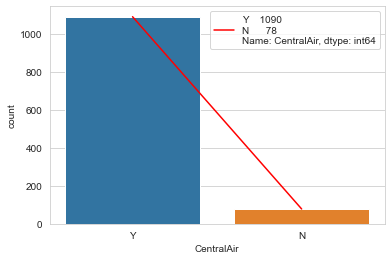

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


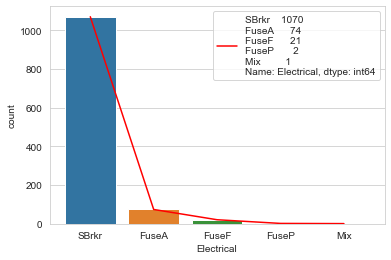

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


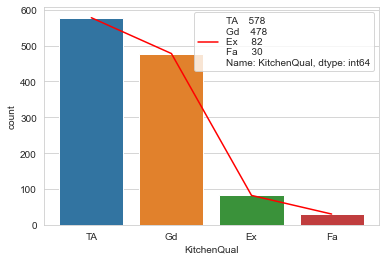

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


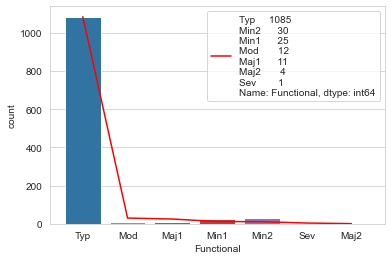

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64


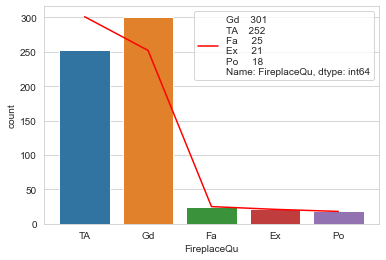

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Attchd     691
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


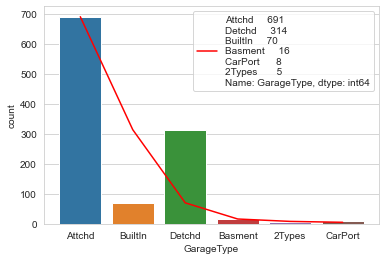

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Unf    487
RFn    339
Fin    278
Name: GarageFinish, dtype: int64


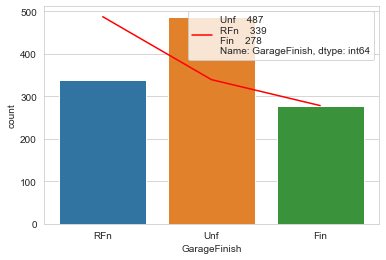

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
TA    1050
Fa      39
Gd      11
Po       2
Ex       2
Name: GarageQual, dtype: int64


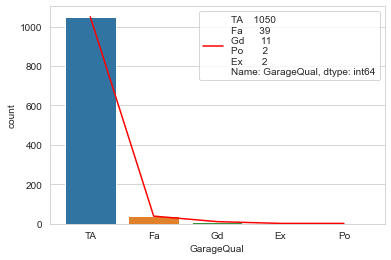

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
TA    1061
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


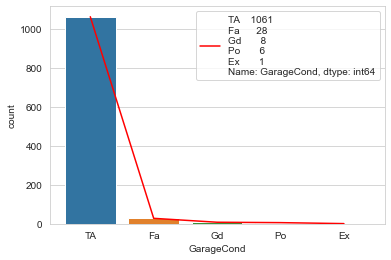

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


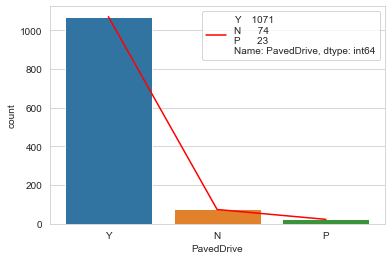

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Gd    3
Ex    2
Fa    2
Name: PoolQC, dtype: int64


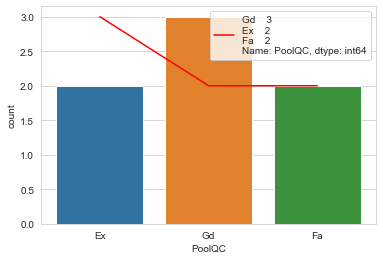

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
MnPrv    129
GdPrv     51
GdWo      47
MnWw      10
Name: Fence, dtype: int64


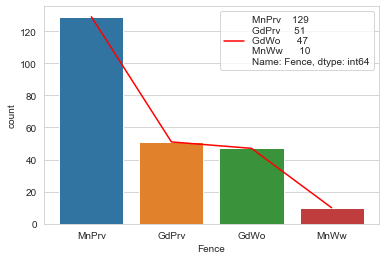

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Shed    40
Gar2     2
TenC     1
Othr     1
Name: MiscFeature, dtype: int64


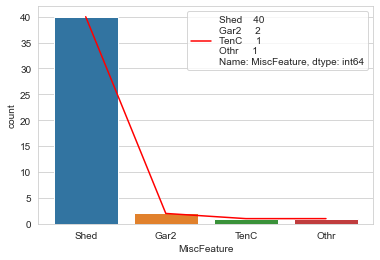

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
CWD        3
Oth        3
Con        2
Name: SaleType, dtype: int64


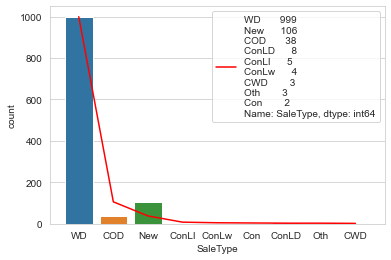

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣
Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


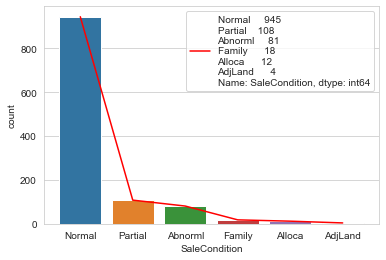

♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣♣


In [14]:
#lets call the val function
val(df_train)

# Missing Values TRAIN DATASET

In [15]:
#checking the null values
df_train.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
Street             0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 80, dtype: int64

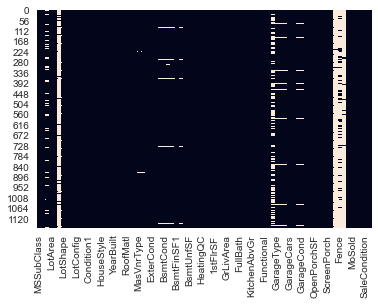

In [16]:
#checking the Null Value with seaborn
sns.heatmap(df_train.isnull(),cbar=False)

In [17]:
#checking null value % of each columns
def Nan_p(df):
    percent_missing = df.isnull().sum() * 100 / len(df)
    missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
    sns.set_style("whitegrid")
    plt.figure(figsize=[22,10])
    sns.countplot(x=missing_value_df['percent_missing'],data=missing_value_df)
    plt.xticks(rotation=70)
    plt.show()
    plt.figure(figsize=[22,10])
    percent_missing.plot(kind='area',color='red')
    return(missing_value_df)

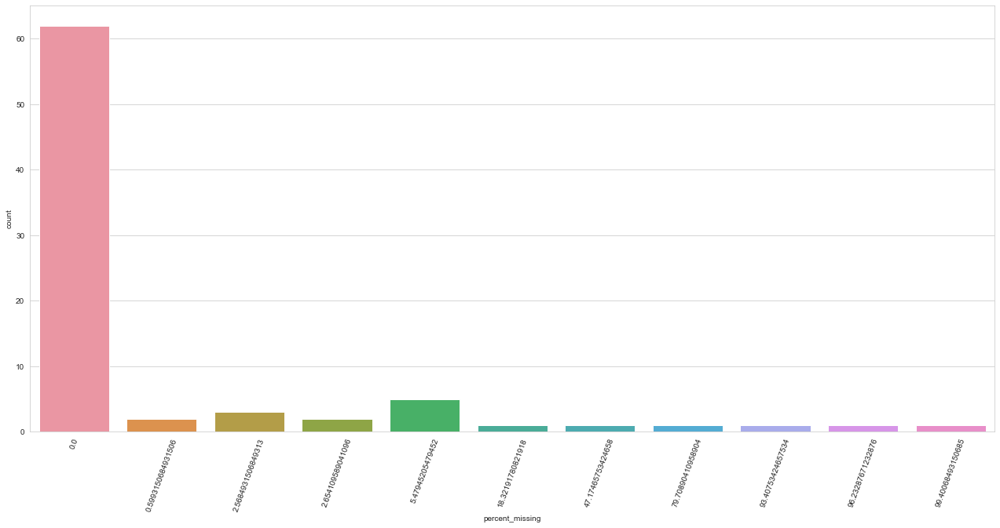

,column_name,percent_missing
MSSubClass,MSSubClass,0.000000
MSZoning,MSZoning,0.000000
LotFrontage,LotFrontage,18.321918
LotArea,LotArea,0.000000
Street,Street,0.000000
...,...,...
MoSold,MoSold,0.000000
YrSold,YrSold,0.000000
SaleType,SaleType,0.000000
SaleCondition,SaleCondition,0.000000


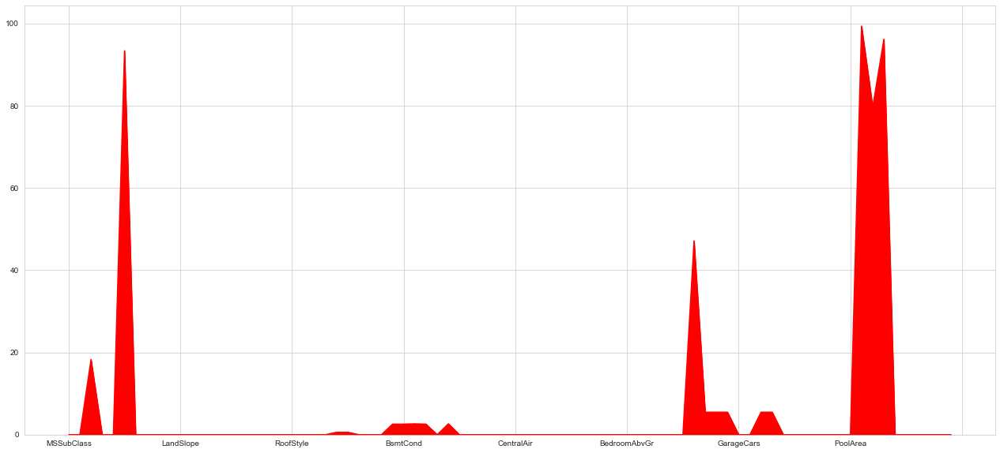

In [18]:
Nan_p(df_train)

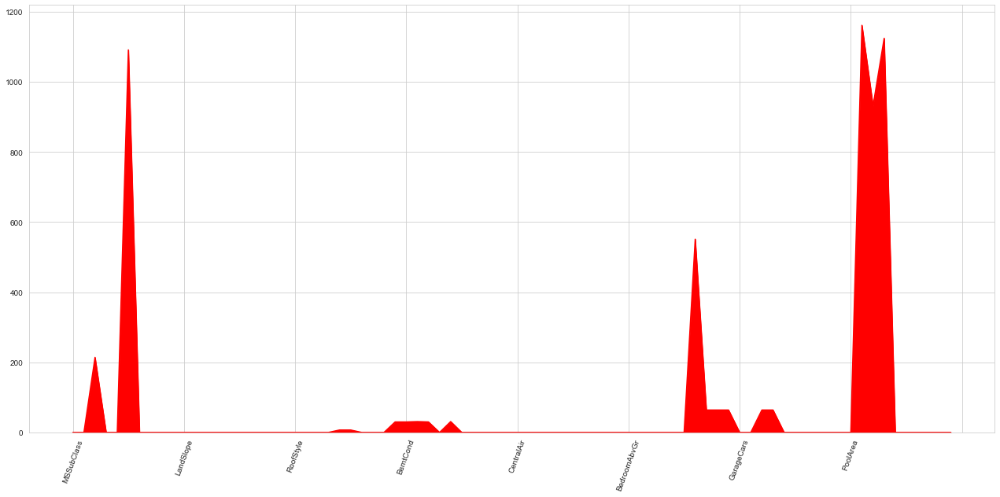

In [19]:
k=df_train.isnull().sum()
plt.figure(figsize=[22,10])
k.plot(kind='area',color='red')
plt.xticks(rotation=70)
plt.show()

In [10]:
#handeling the Nan value
def Handel_Nan(df):
    cn=df.columns
    for i in cn:
        if df[i].dtype!='object':
            df[i].fillna(df[i].mean(),inplace=True)
        else:
            df[i].fillna("missing",inplace=True)
    

In [25]:
Handel_Nan(df_train)

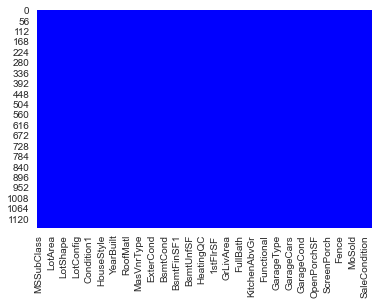

In [22]:
sns.heatmap(df_train.isnull(),cbar=False,cmap='winter')


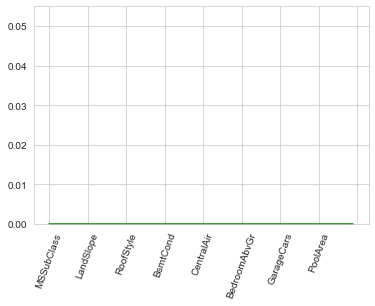

In [23]:
j=df_train.isnull().sum()
j.plot(kind='area',color='green')
plt.xticks(rotation=70)
plt.show()

In [24]:
df_train.isnull().values.any()

False

# Statistic Summary TRAIN DATASET

In [40]:
d=df_train.describe()
d


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,...,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.988470,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,...,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,22.437056,8957.442311,1.390153,1.124343,30.145255,20.785185,182.047152,462.664785,...,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.000000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.988470,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,79.250000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,...,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


# Coeerelation TRAIN DATASET

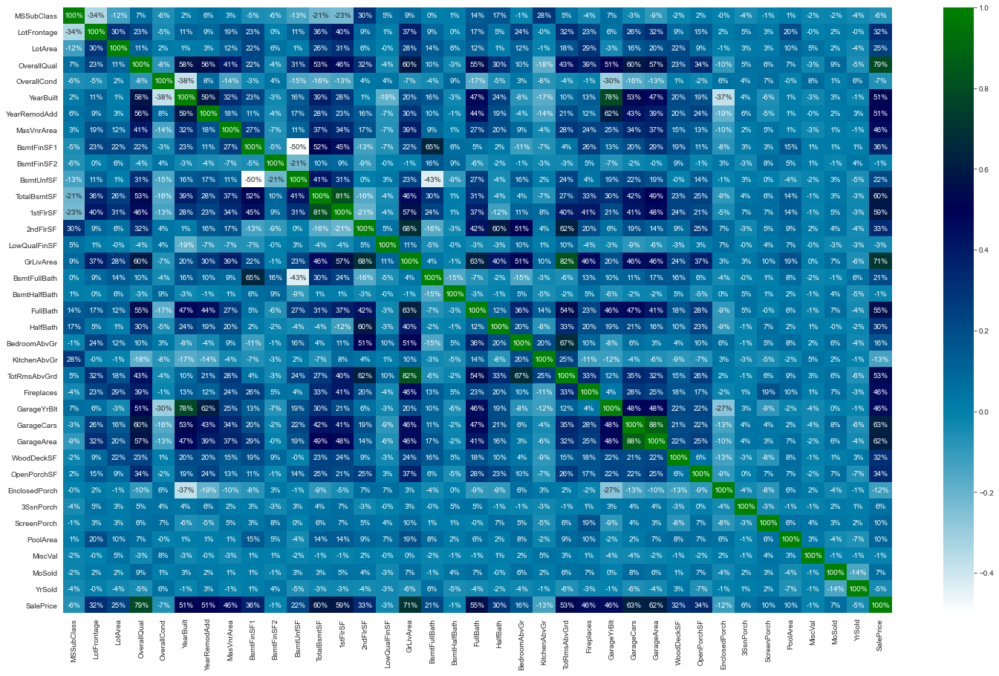

In [26]:
plt.figure(figsize=[25,15])
sns.heatmap(df_train.corr(),annot=True,fmt=".0%",cmap="ocean_r")

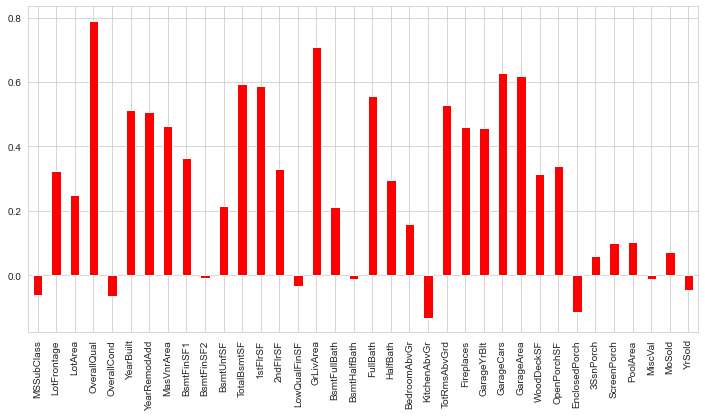

In [27]:
#correlation with target 
plt.figure(figsize=[12,6])
df_train.drop('SalePrice',axis=1).corrwith(df_train['SalePrice']).plot(kind='bar',grid=True,color='red')
plt.xticks(rotation=90)
plt.show()

# OUtliers TRAIN DATASET

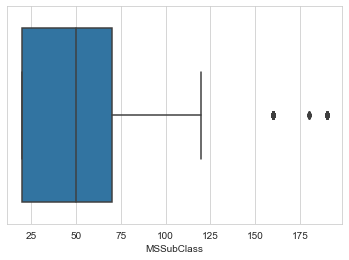

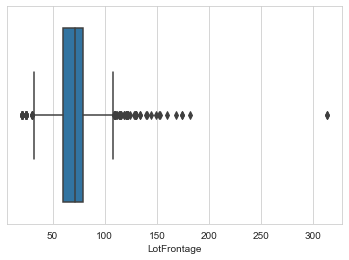

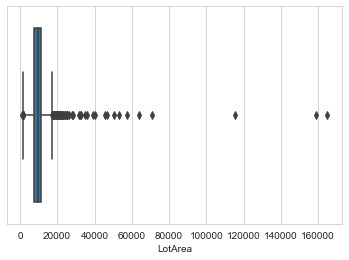

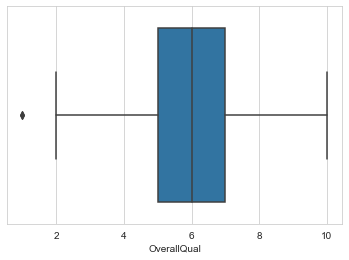

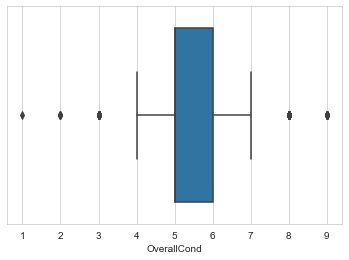

...

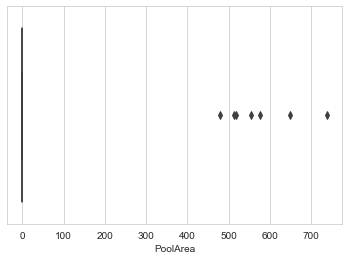

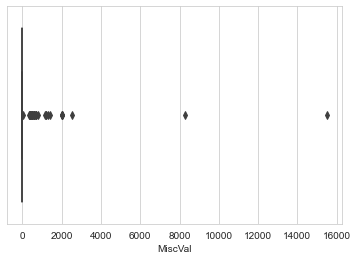

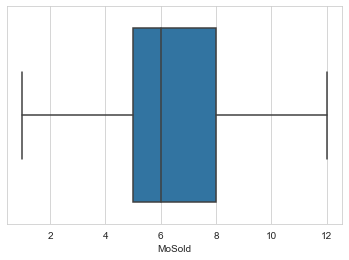

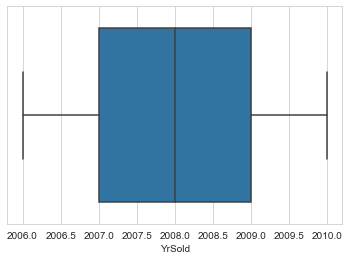

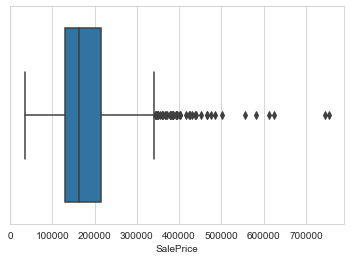

In [28]:
for i in df_train.columns:
    if df_train[i].dtypes!="O":
        sns.boxplot(df_train[i])
        plt.show()

# BaiVariate analysis TRAIN DATASET

In [29]:
def bai_bar(a):
    plt.figure(figsize=[18,4])
    sns.barplot(x=a,y='SalePrice',data=df_train)
    plt.title(input(),{"fontsize":25})
    plt.show()
        
def bai_l(a):
    plt.figure(figsize=[18,4])
    sns.lineplot(x=a,y='SalePrice',data=df_train)
    plt.xticks(rotation=90)
    plt.title(input(),{"fontsize":25})
    plt.show()
    

Identifies the type of dwelling involved in the sale vs salePrice


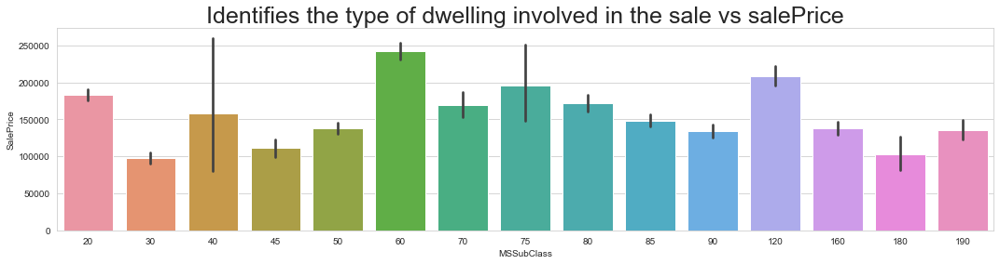

In [30]:
bai_bar('MSSubClass')

Identifies the general zoning classification of the sale vs SalePrice


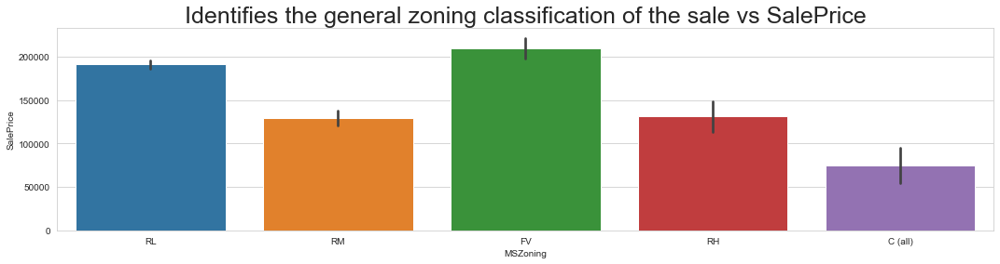

In [31]:
bai_bar('MSZoning')

Linear feet of street connected to property vs SalePrice


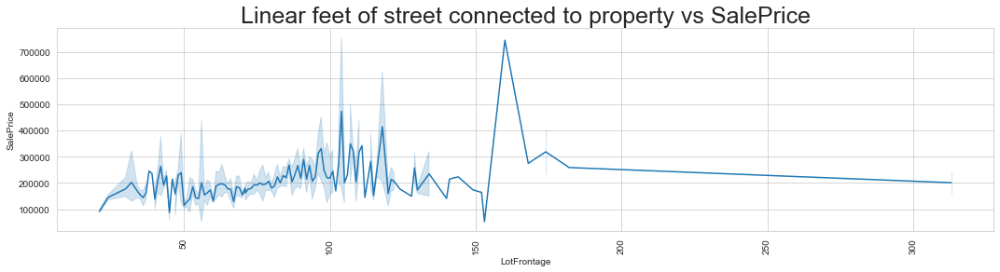

In [32]:
bai_l('LotFrontage')

Lot size in square feet vs SalePrice


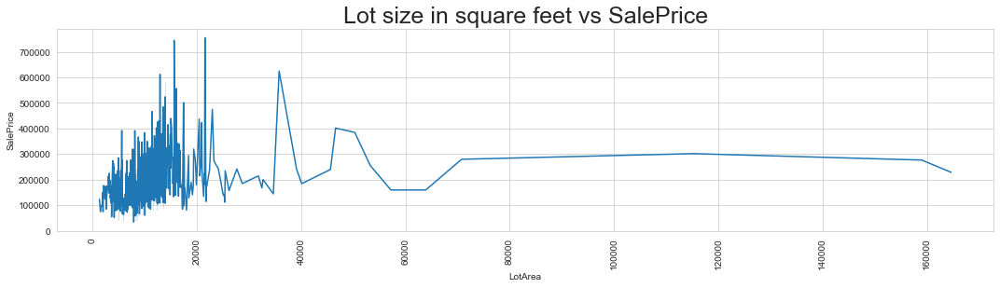

In [33]:
bai_l('LotArea')

Type of road access to property vs SalePrice


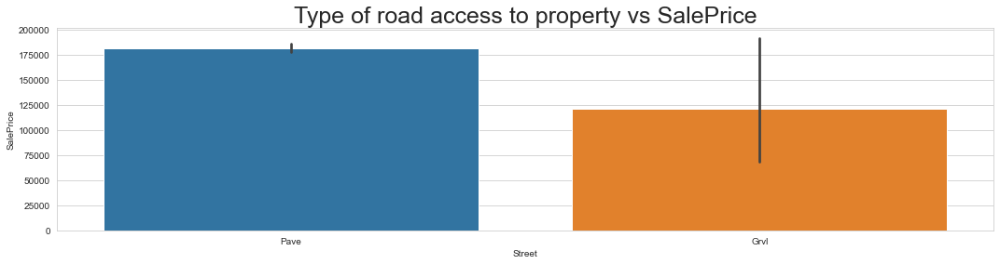

In [34]:
bai_bar('Street')

Type of alley access to property vs SalePrice


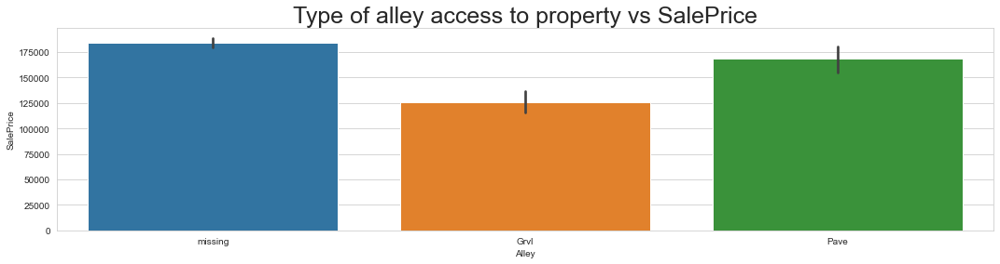

In [35]:
bai_bar('Alley')

General shape of property vs SalePrice


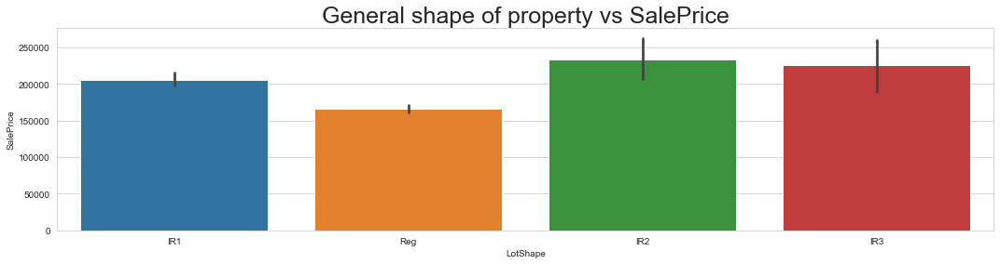

In [36]:
bai_bar('LotShape')

Flatness of the property vs SalePrice


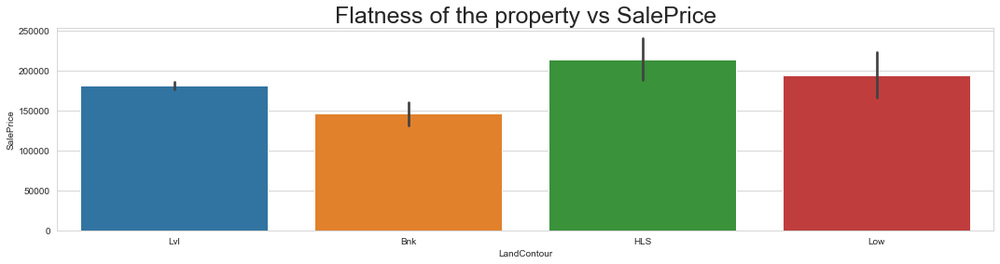

In [37]:
bai_bar('LandContour')

Type of utilities available vs SalePrice


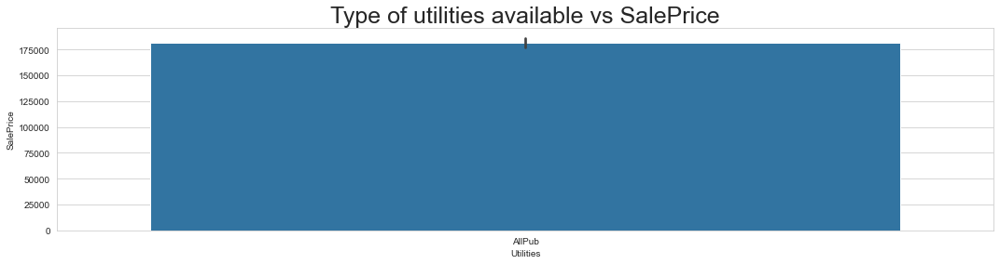

In [38]:
bai_bar('Utilities')

Lot configuration vs Saleprice


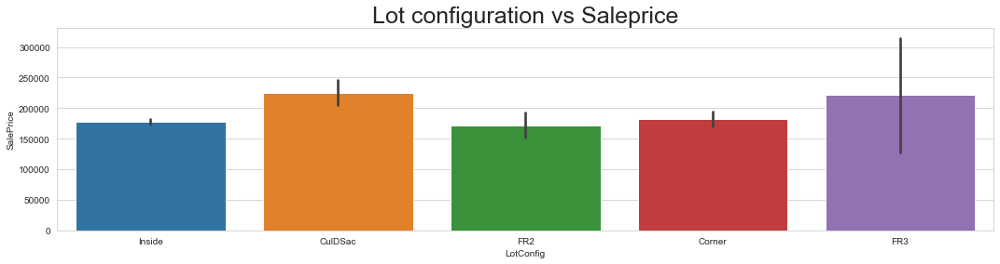

In [39]:
bai_bar('LotConfig')

Slope of property vs SalePrice


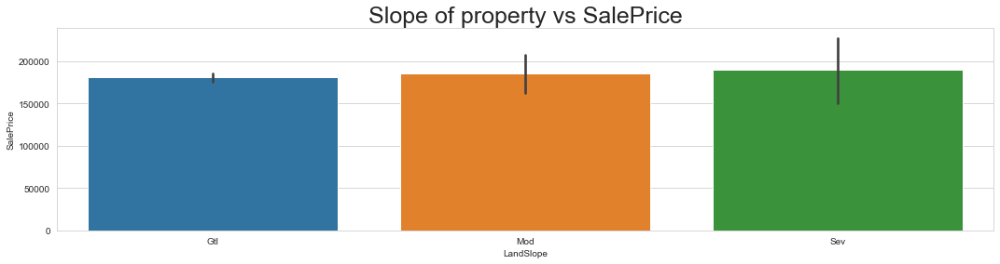

In [40]:
bai_bar('LandSlope')

Physical locations within Ames city limits vs SalePrice


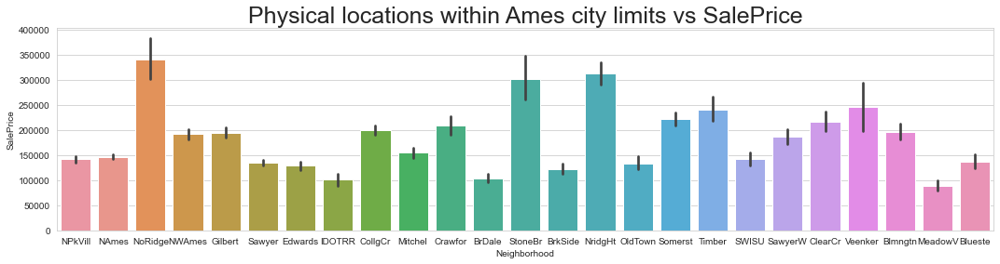

In [41]:
bai_bar('Neighborhood')

Proximity to various conditions vs SalePrice


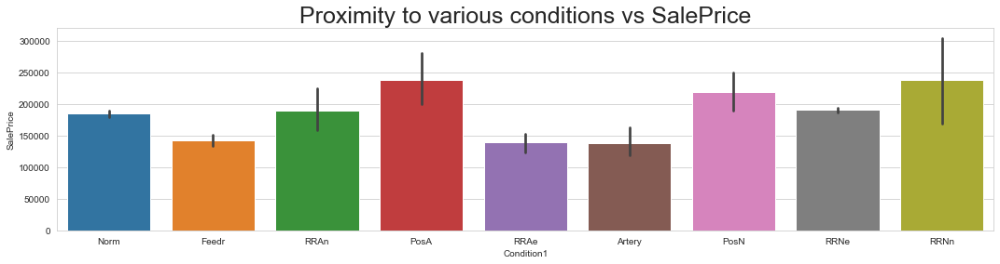

In [42]:
bai_bar('Condition1')

Proximity to various conditions (if more than one is present) vs SalePrice


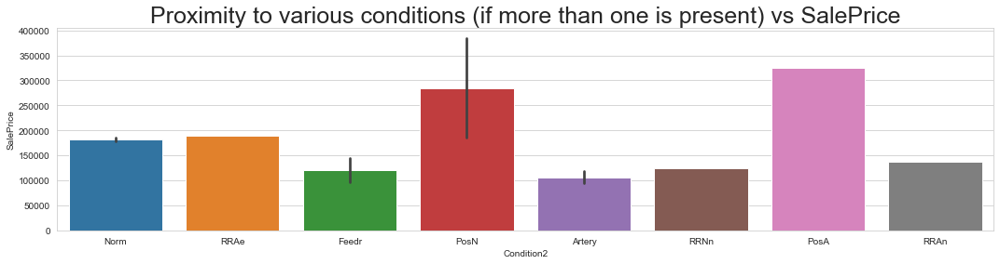

In [43]:
bai_bar('Condition2')

 Type of dwelling vs SalePrice


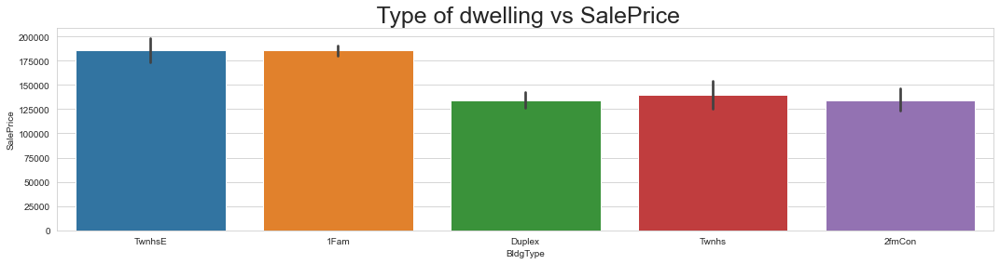

In [44]:
bai_bar('BldgType')

Style of dwelling vs SalePrice


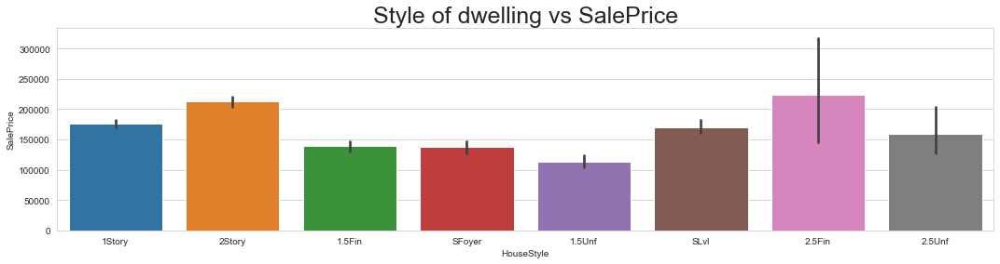

In [45]:
bai_bar('HouseStyle')

Rates the overall material and finish of the house vs SalePrice


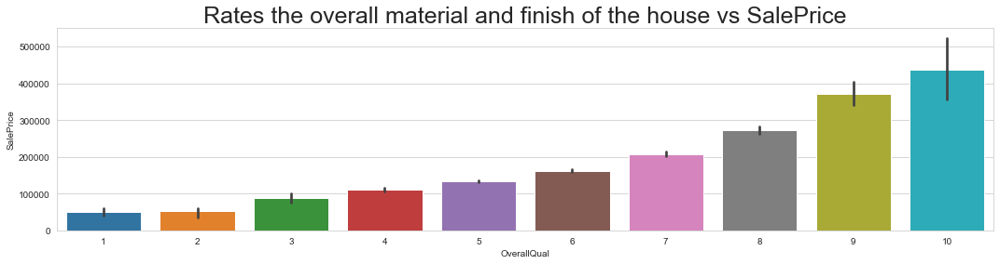

In [46]:
bai_bar('OverallQual')

Rates the overall condition of the house vs SalePrice


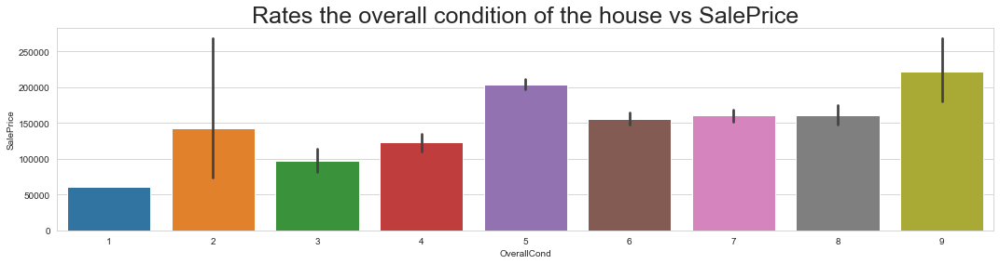

In [47]:
bai_bar('OverallCond')

Original construction date vs SalePrice


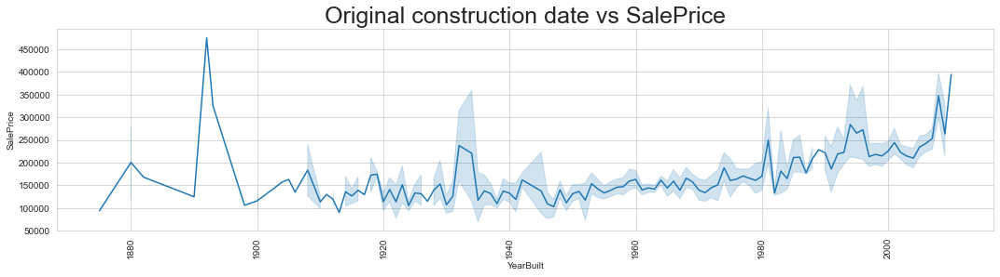

In [48]:
bai_l('YearBuilt')

Remodel date (same as construction date if no remodeling or additions) vs SalePrice


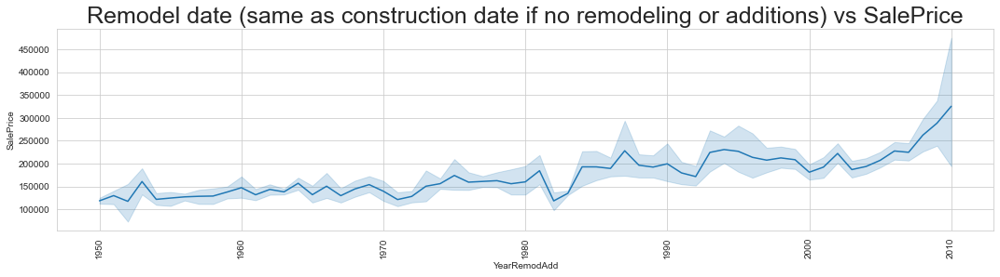

In [49]:
bai_l('YearRemodAdd')

Type of roof vs SalePrice


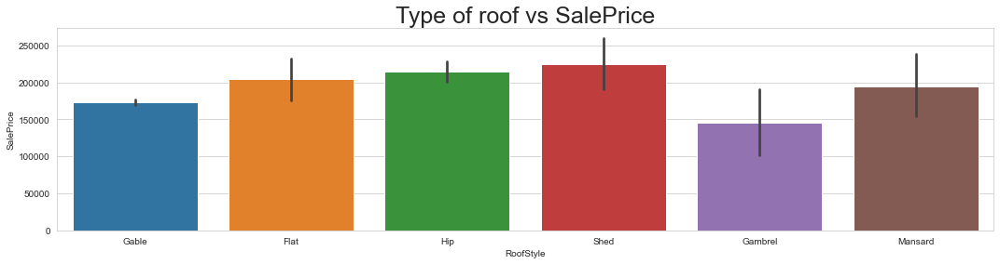

In [50]:
bai_bar('RoofStyle')


Roof material vs SalePrice


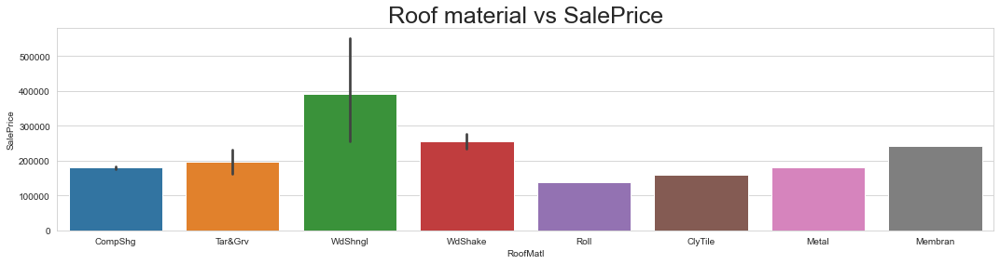

In [51]:
bai_bar('RoofMatl')

Exterior covering on house vs SalePrice


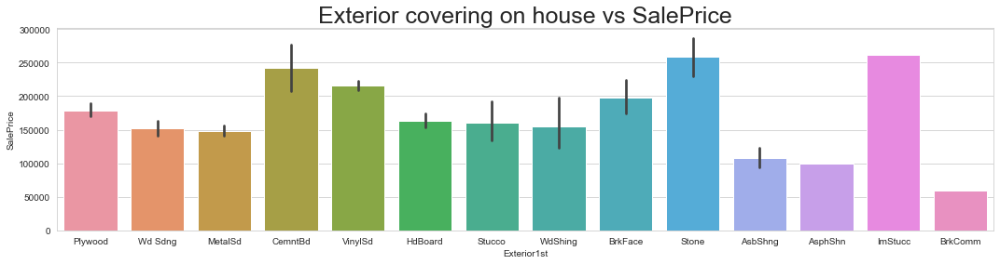

In [52]:
bai_bar('Exterior1st')

Exterior covering on house (if more than one material) SalePrice


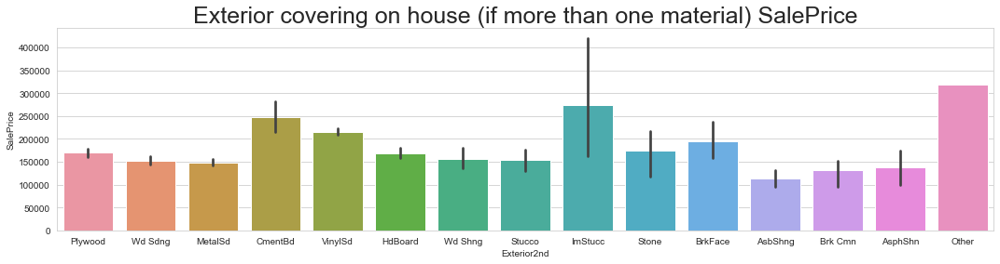

In [53]:
bai_bar('Exterior2nd')

Masonry veneer type vs SalePrice


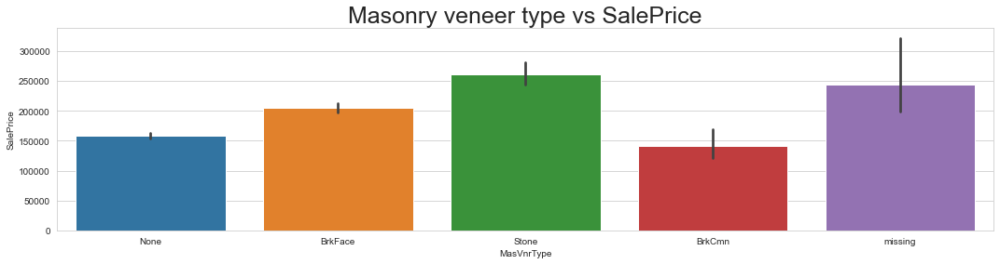

In [54]:
bai_bar('MasVnrType')

Masonry veneer area in square feet vs SalePrice


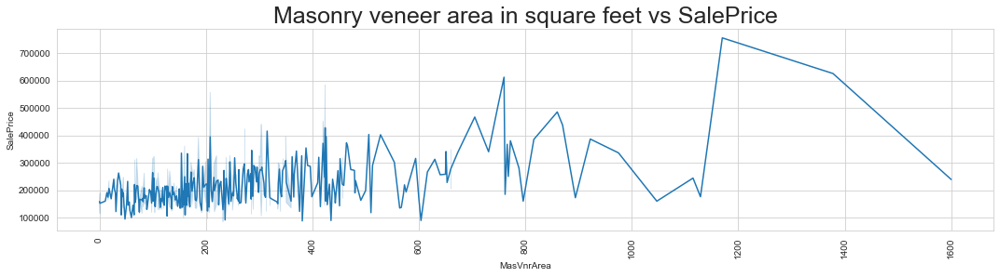

In [55]:
bai_l('MasVnrArea')

Evaluates the quality of the material on the exterior vs SalePrice


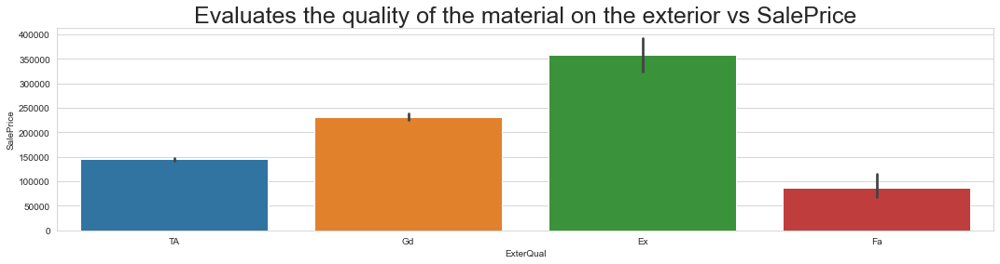

In [56]:
bai_bar('ExterQual')

Evaluates the present condition of the material on the exterior vs salePrice


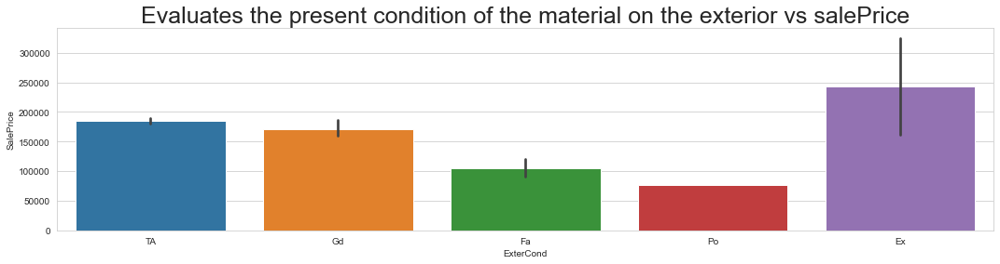

In [57]:
bai_bar('ExterCond')

Type of foundation vs SalePrice


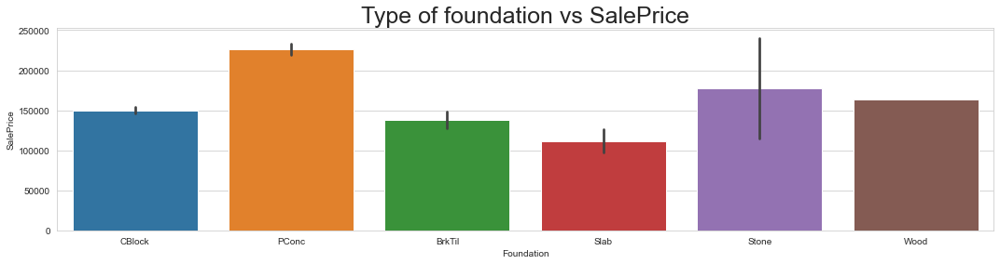

In [58]:
bai_bar('Foundation')

Evaluates the height of the basement vs SalePrice


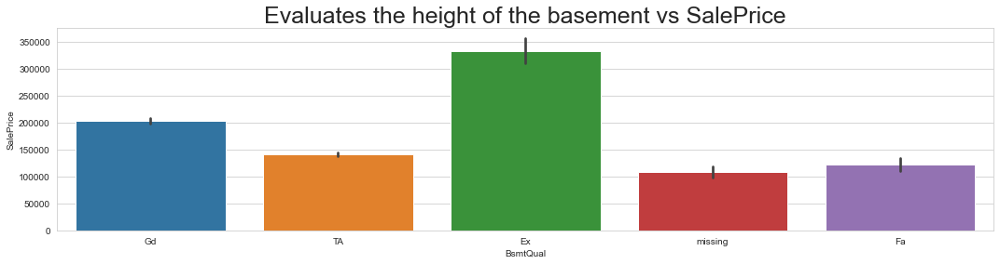

In [59]:
bai_bar('BsmtQual')

Evaluates the general condition of the basement vs SalePrice


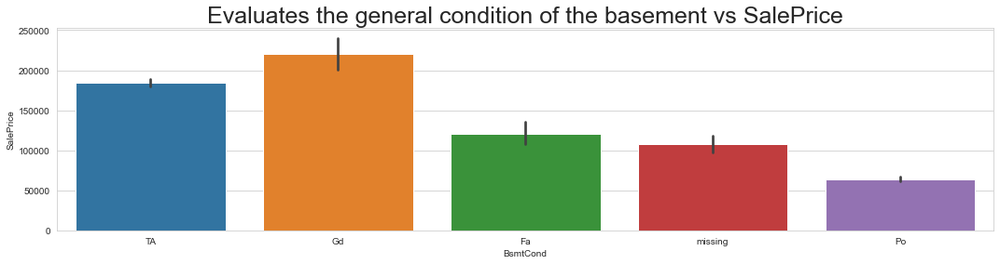

In [60]:
bai_bar('BsmtCond')

 Refers to walkout or garden level walls vs SalePrice


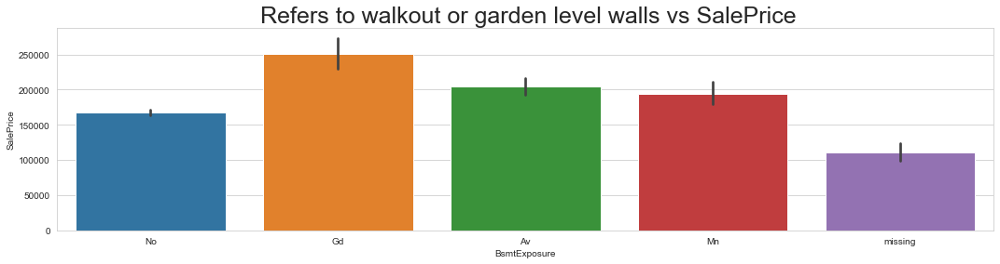

In [61]:
bai_bar('BsmtExposure')

Rating of basement finished area vs SalePrice


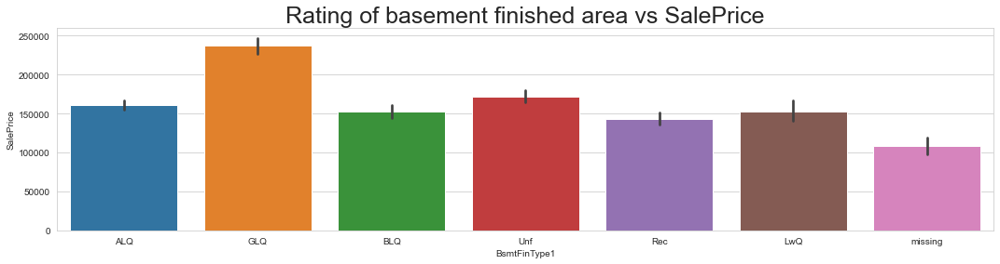

In [62]:
bai_bar('BsmtFinType1')

Type 1 finished square feet vs SalePrice


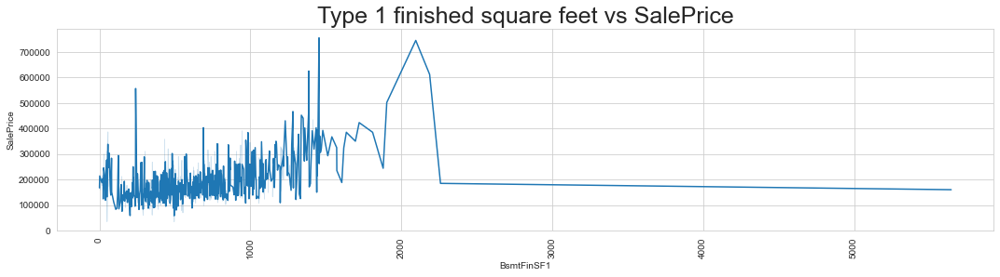

In [63]:
bai_l('BsmtFinSF1')

Rating of basement finished area (if multiple types) vs SalePrice


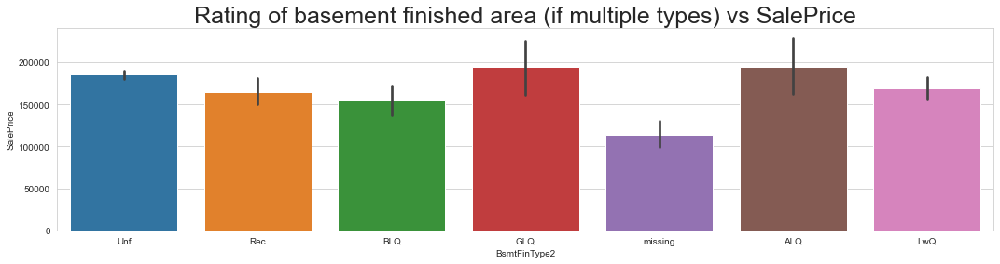

In [64]:
bai_bar('BsmtFinType2')

Type 2 finished square feet vs SalePrice


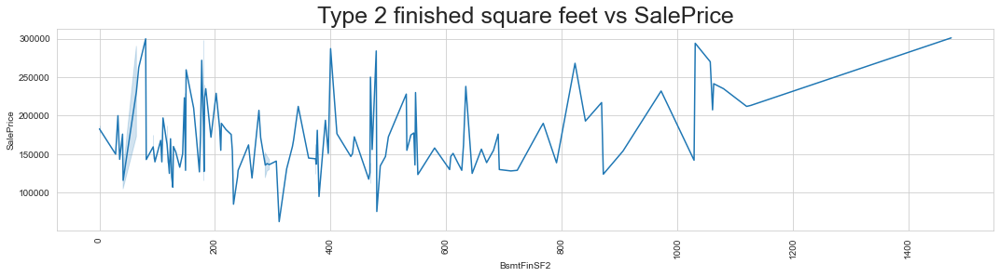

In [65]:
bai_l('BsmtFinSF2')

Unfinished square feet of basement area vs SalePrice


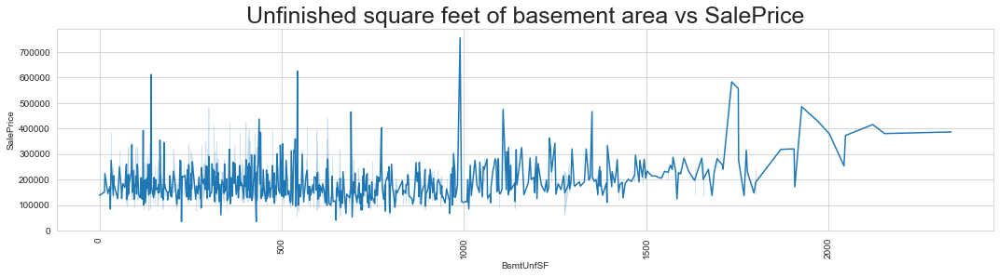

In [66]:
bai_l('BsmtUnfSF')

Total square feet of basement area vs SalePrice


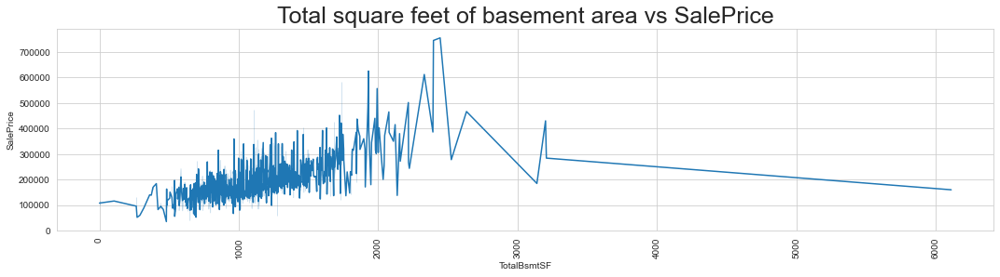

In [67]:
bai_l('TotalBsmtSF')

Type of heating vs SalePrice


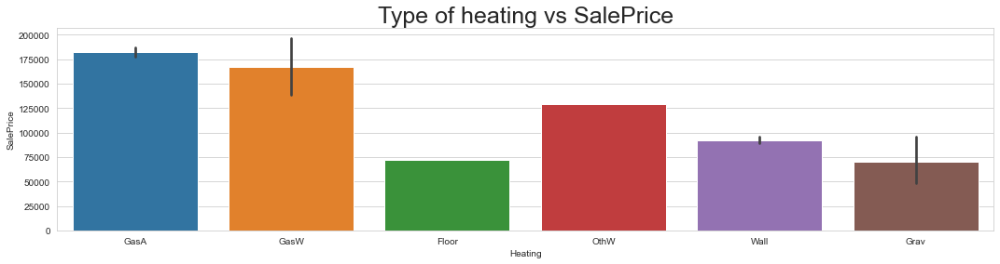

In [68]:
bai_bar('Heating')

Heating quality and condition vs SalePrice


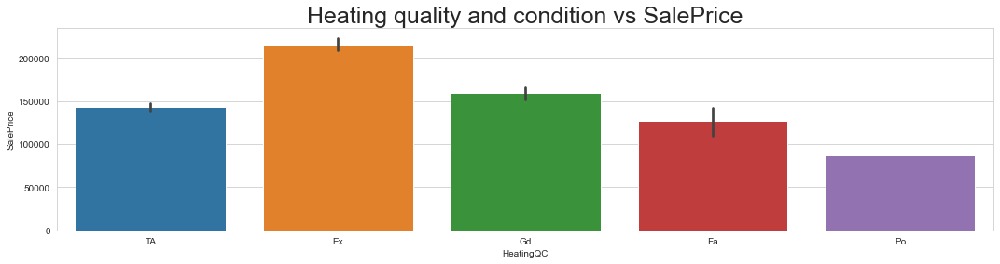

In [69]:
bai_bar('HeatingQC')

Central air conditioning vs SalePrice


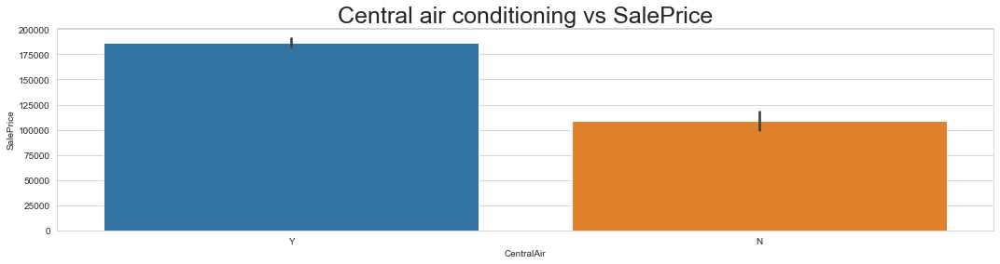

In [70]:
bai_bar('CentralAir')

Electrical system vs SalePrice


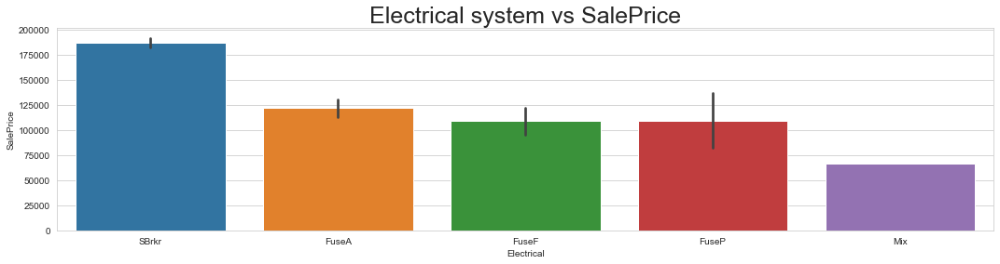

In [71]:
bai_bar('Electrical')

First Floor square feet vs SalePrice


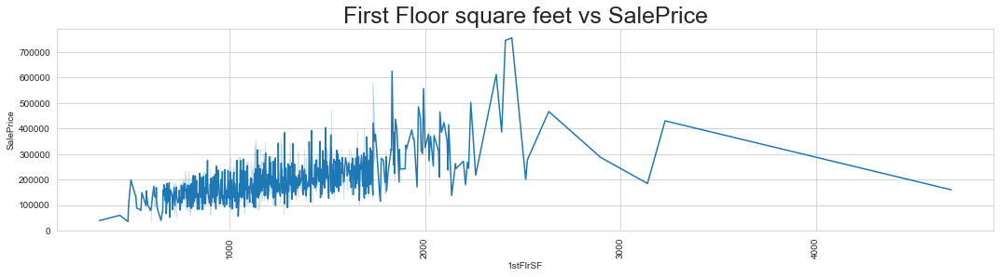

In [72]:
bai_l('1stFlrSF')

Second floor square feet vs SalePrice


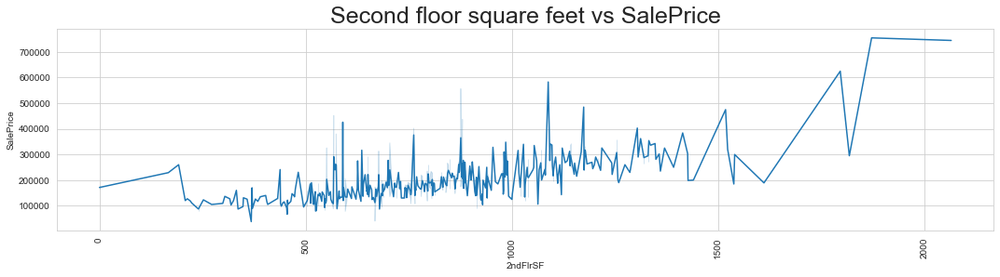

In [73]:
bai_l('2ndFlrSF')

Low quality finished square feet (all floors) vs SalePrice


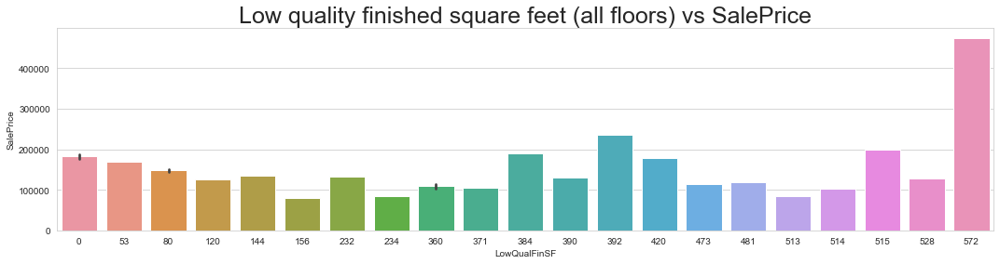

In [74]:
bai_bar('LowQualFinSF')

Above grade (ground) living area square feet vs SalePrice


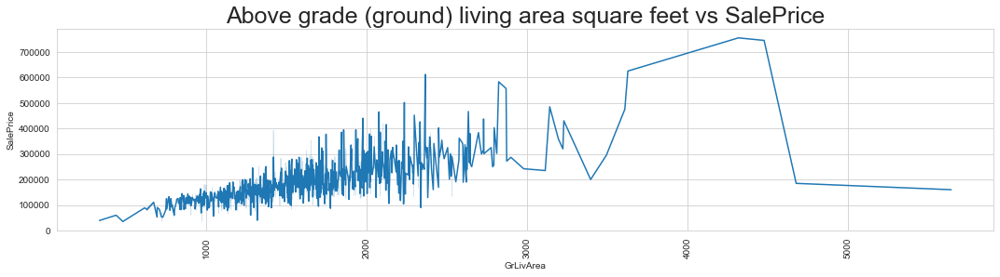

In [75]:
bai_l('GrLivArea')

Basement full bathrooms vs SalePrice


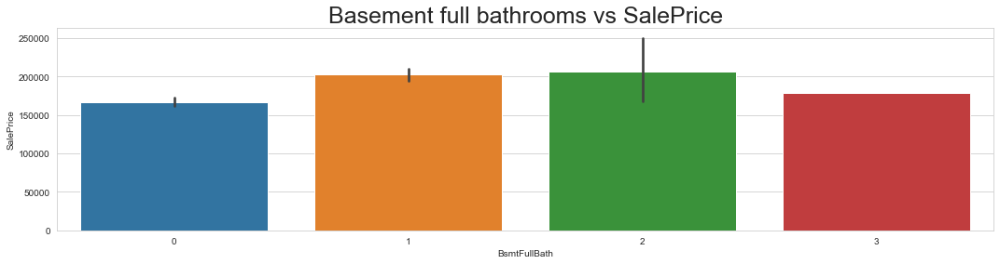

In [76]:
bai_bar('BsmtFullBath')

Basement half bathrooms vs SalePrice


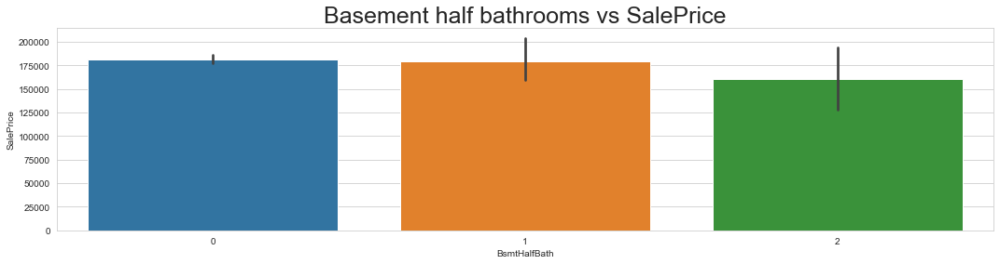

In [77]:
bai_bar('BsmtHalfBath')

Full bathrooms above grade vs SalePrice


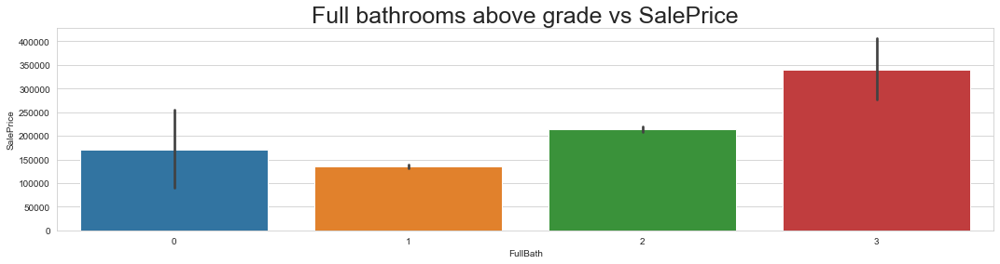

In [78]:
bai_bar('FullBath')

Half baths above grade vs SalePrice


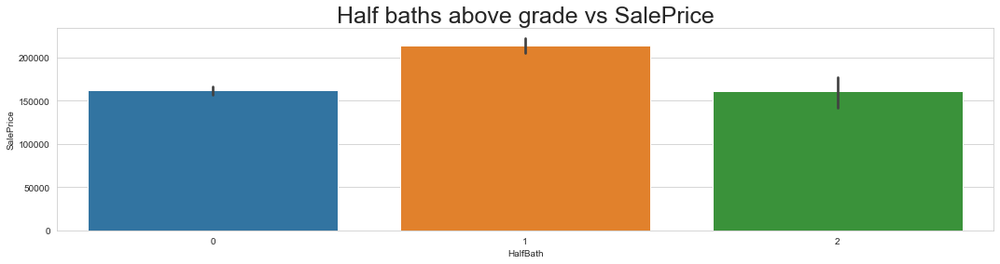

In [79]:
bai_bar('HalfBath')

Bedrooms above grade (does NOT include basement bedrooms) vs SalePrice


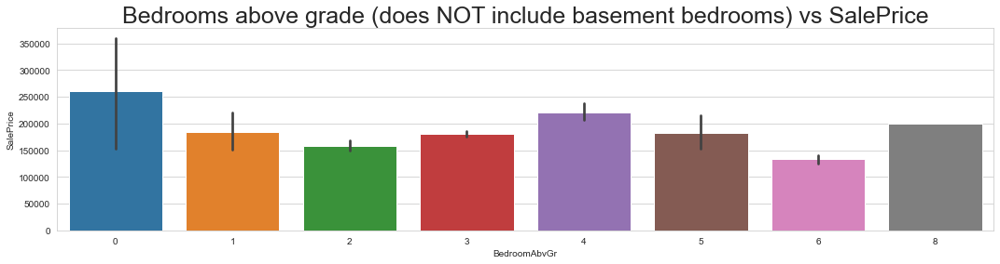

In [80]:
bai_bar('BedroomAbvGr')

Kitchens above grade vs SalePrice


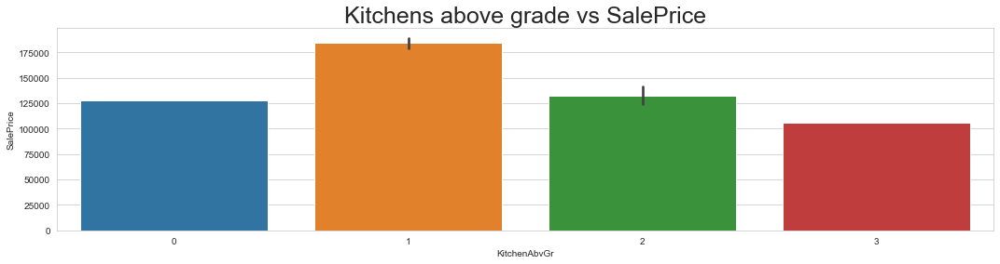

In [81]:
bai_bar('KitchenAbvGr')

Kitchen quality vs SalePrice


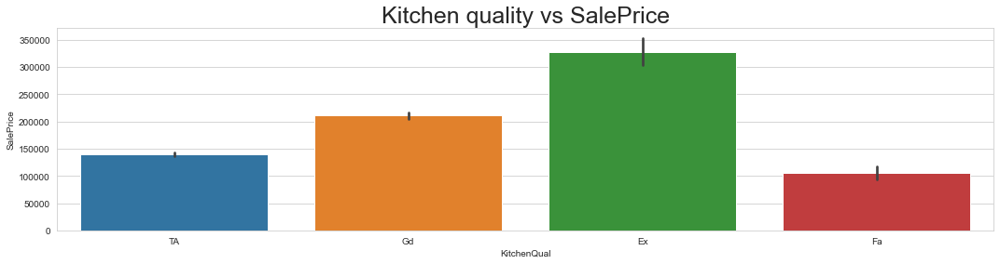

In [82]:
bai_bar('KitchenQual')

Total rooms above grade (does not include bathrooms) vs SalePrice


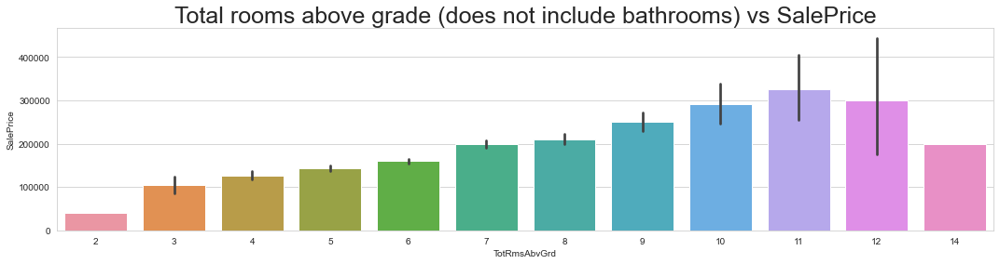

In [83]:
bai_bar('TotRmsAbvGrd')

 Home functionality (Assume typical unless deductions are warranted) vs SalePrice


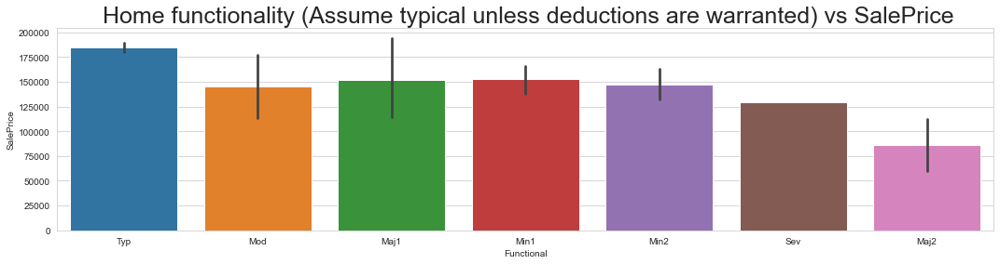

In [84]:
bai_bar('Functional')

Number of fireplaces vs SalePrice


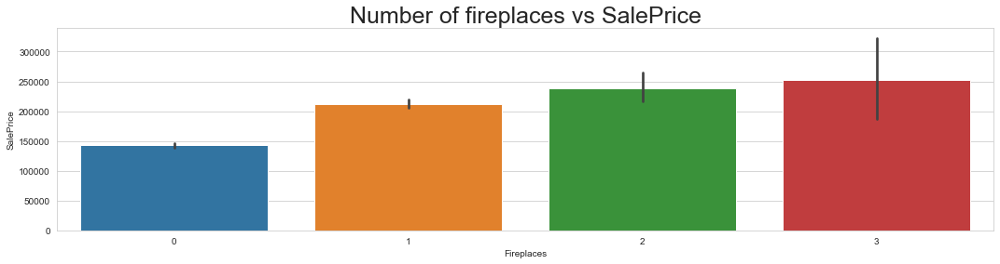

In [85]:
bai_bar('Fireplaces')

Fireplace quality vs SalePrice


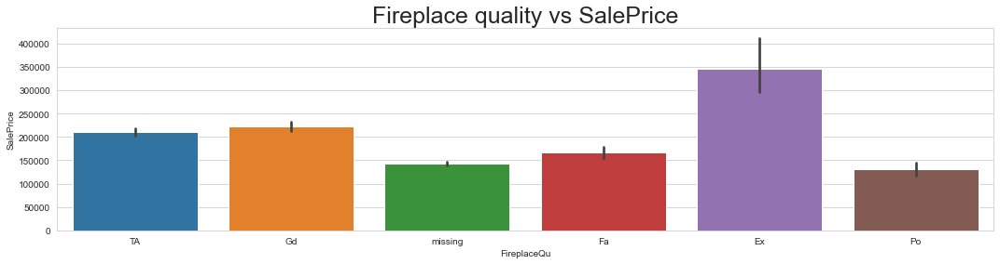

In [86]:
bai_bar('FireplaceQu')

Garage location vs SalePrice


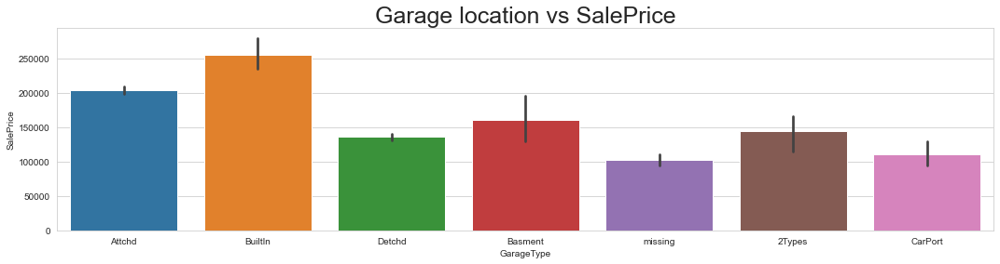

In [87]:
bai_bar('GarageType')

 Year garage was built vs SalePrice


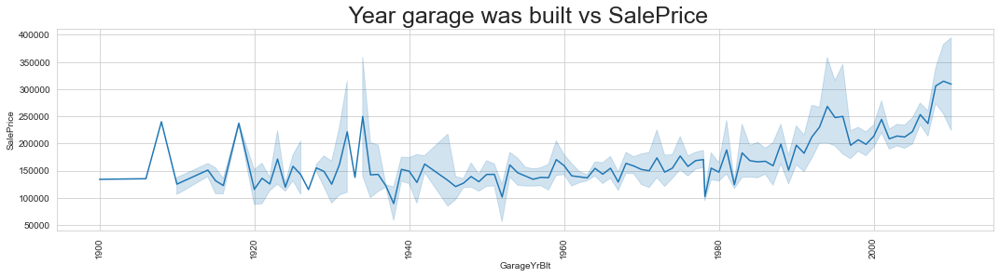

In [88]:
bai_l('GarageYrBlt')

Interior finish of the garage vs SalePrice


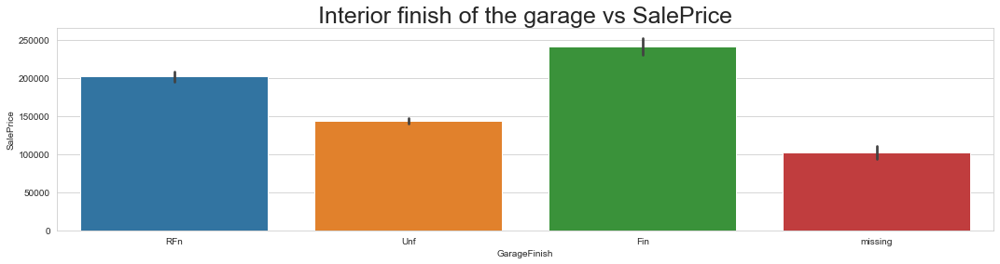

In [89]:
bai_bar('GarageFinish')

 Size of garage in car capacity vs SalePrice


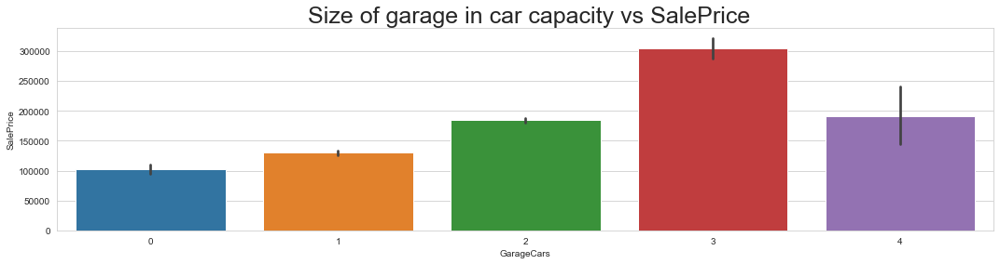

In [90]:
bai_bar( 'GarageCars')

Size of garage in square feet vs SalePrice


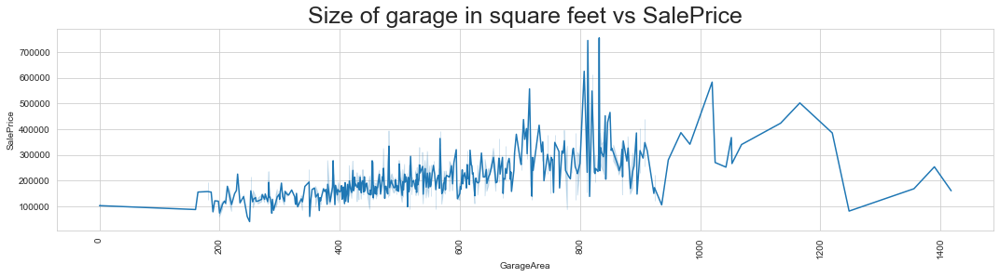

In [91]:
bai_l('GarageArea')

Garage quality vs SalePrice


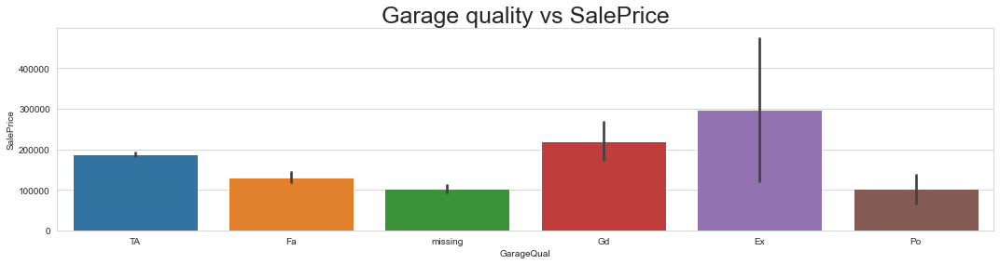

In [92]:
bai_bar('GarageQual')

Garage condition vs SalePrice


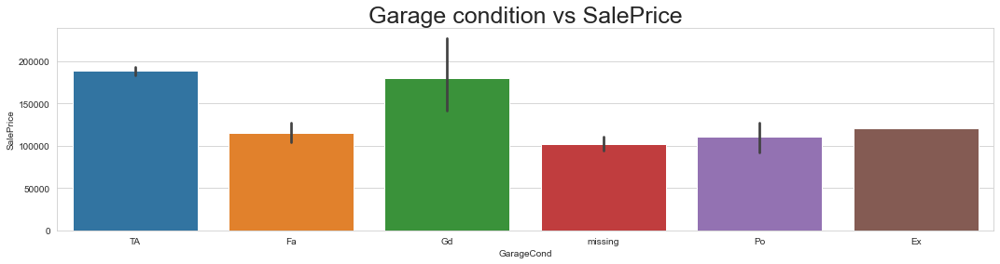

In [93]:
bai_bar('GarageCond')

Paved driveway vs SalePrice


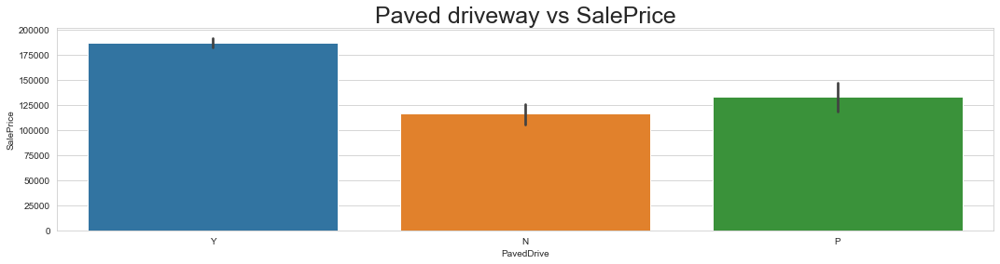

In [94]:
bai_bar('PavedDrive')

 Wood deck area in square feet vs SalePrice


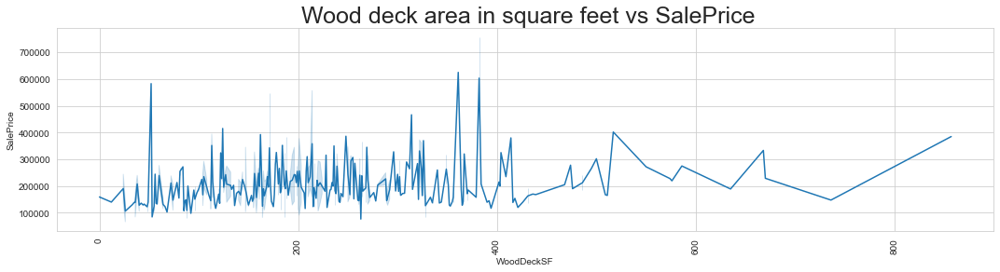

In [95]:
bai_l('WoodDeckSF')

 Open porch area in square feet vs SalePrice


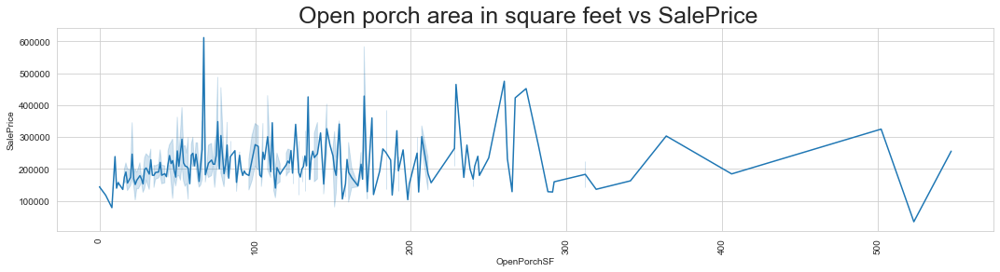

In [96]:
bai_l('OpenPorchSF')

Enclosed porch area in square feet vs SalePrice


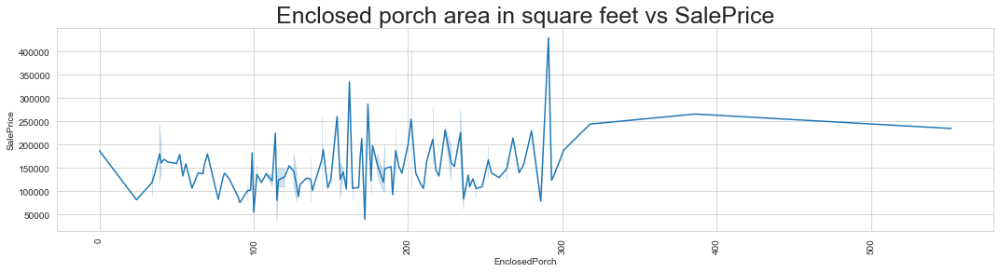

In [97]:
bai_l('EnclosedPorch')

Three season porch area in square feet vs SalePrice


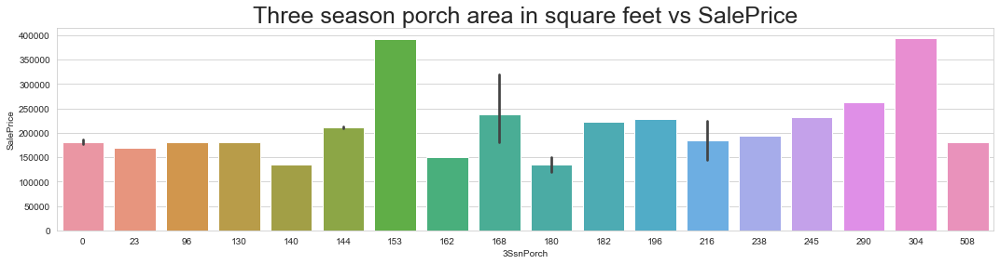

In [98]:
bai_bar('3SsnPorch')

Screen porch area in square feet vs SalePrice


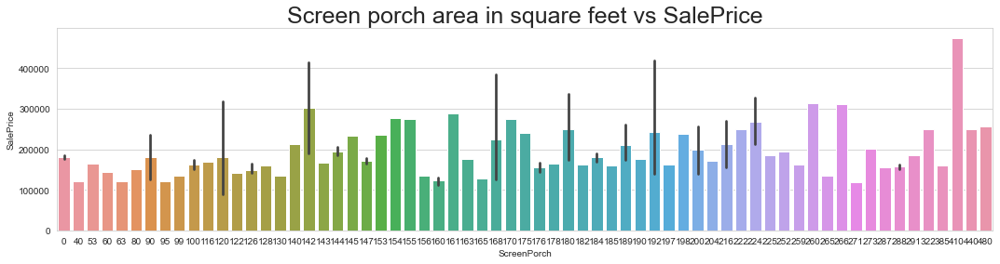

In [99]:
bai_bar('ScreenPorch')

Pool area in square feet vs SalePrice


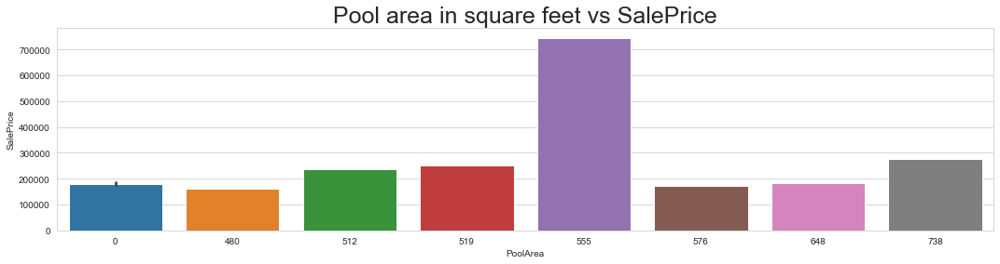

In [100]:
bai_bar('PoolArea')

Pool quality vs SalePrice


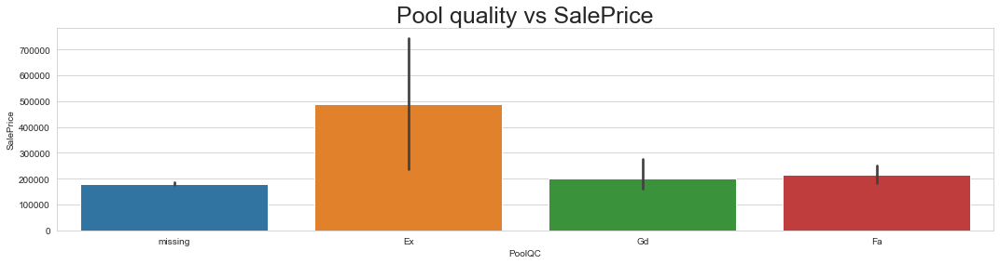

In [101]:
bai_bar('PoolQC')

Fence quality vs SalePrice


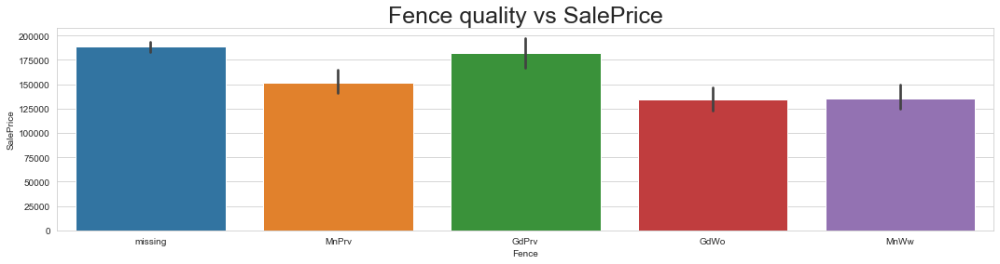

In [102]:
bai_bar('Fence')

Miscellaneous feature not covered in other categories vs SalePrice


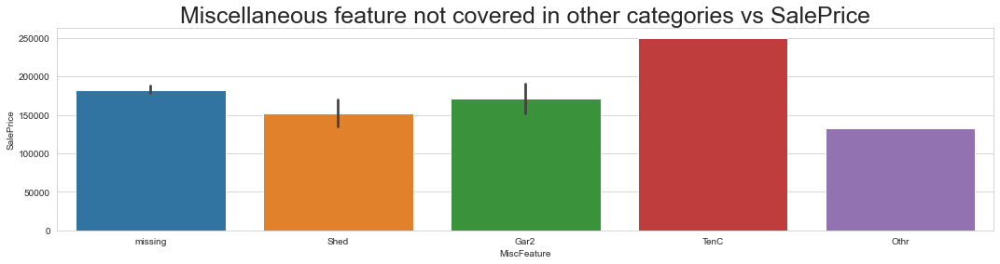

In [103]:
bai_bar('MiscFeature')

$Value of miscellaneous feature vs SalePrice


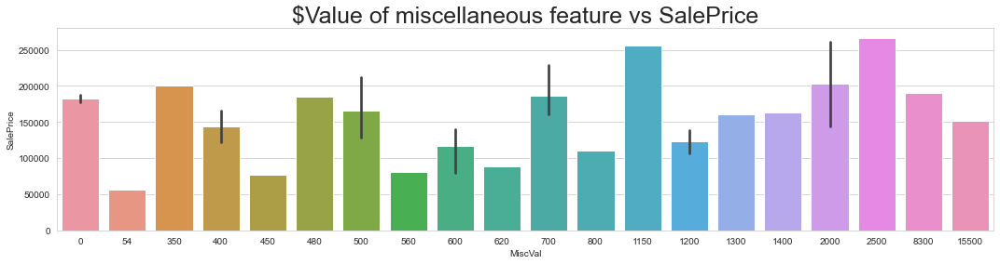

In [104]:
bai_bar('MiscVal')

Month Sold (MM) vs SalePrice


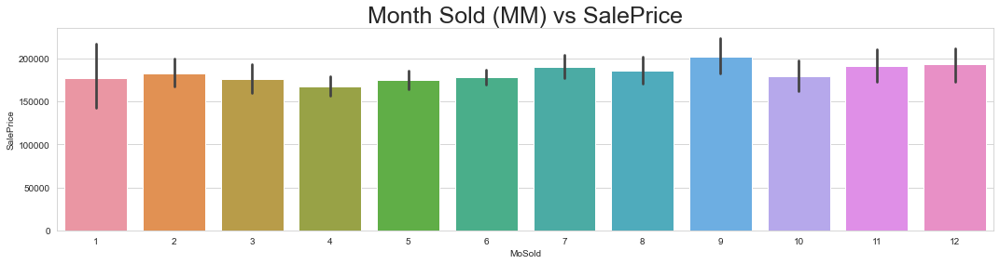

In [105]:
bai_bar('MoSold')

Year Sold (YYYY) vs SalePrice


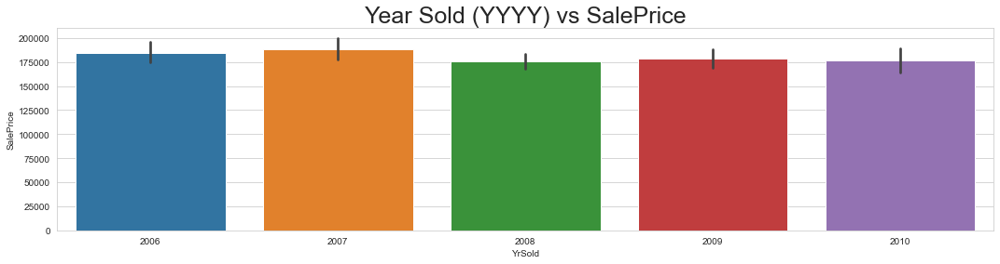

In [106]:
bai_bar('YrSold')

Type of sale vs SalePrice


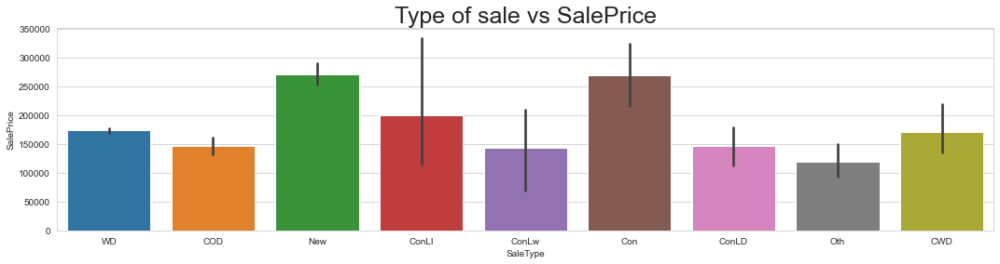

In [107]:
bai_bar('SaleType')

Condition of sale vs SalePrice


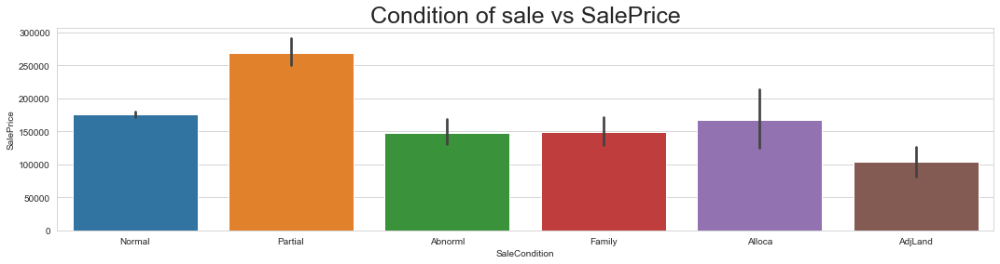

In [108]:
bai_bar('SaleCondition')

# MULTI VARIANT ANALYSIS TRAIN DATASET

In [109]:

def multi(a):
    plt.figure(figsize=(18,15))
    sns.set_style('whitegrid')
    sns.pointplot(x='SalePrice',y=a,data=df_train, hue='OverallQual',join=False)
    plt.xticks(rotation=90)
    plt.show()
    

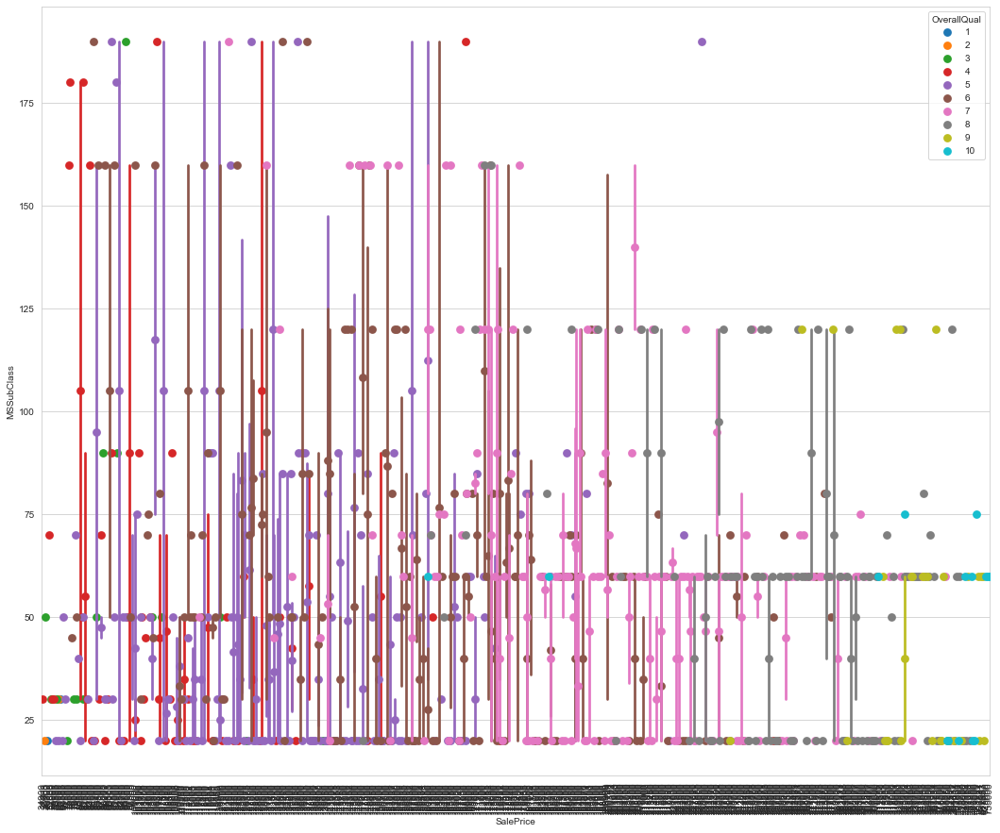

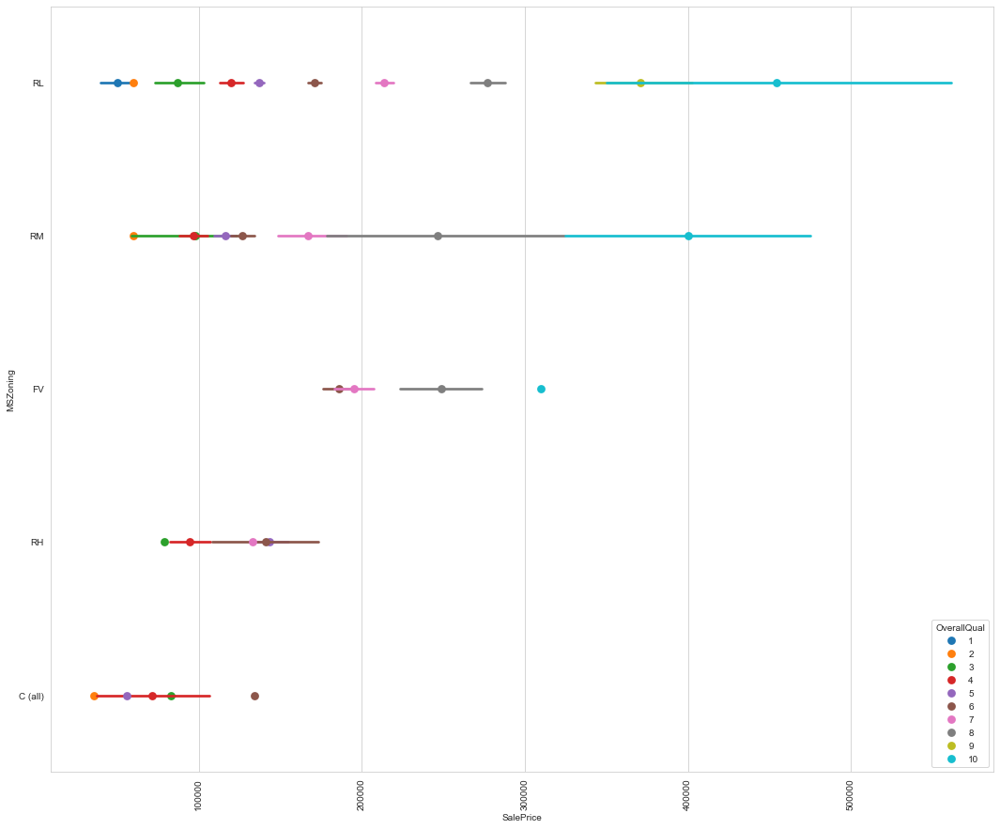

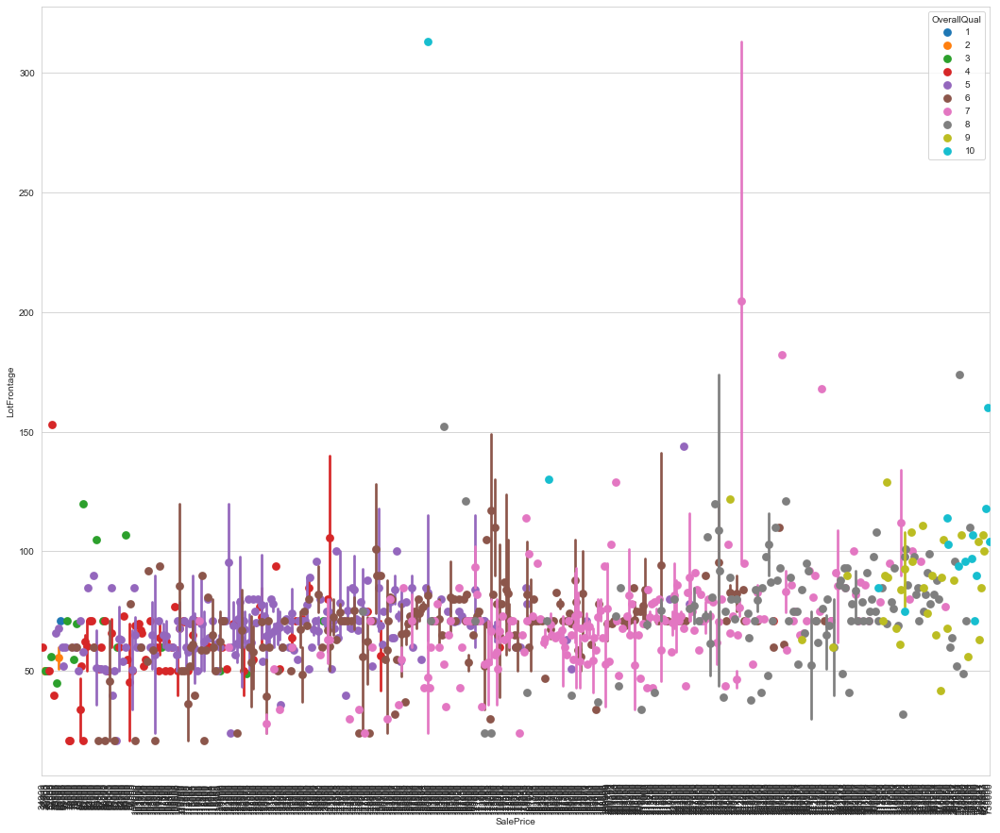

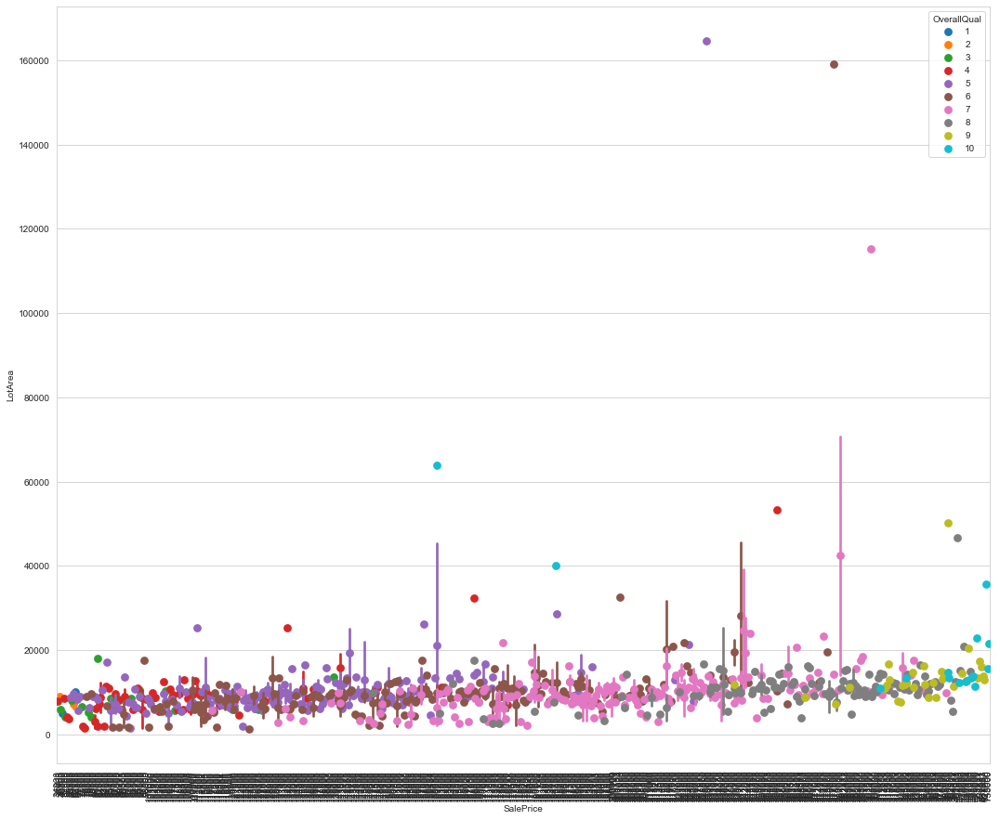

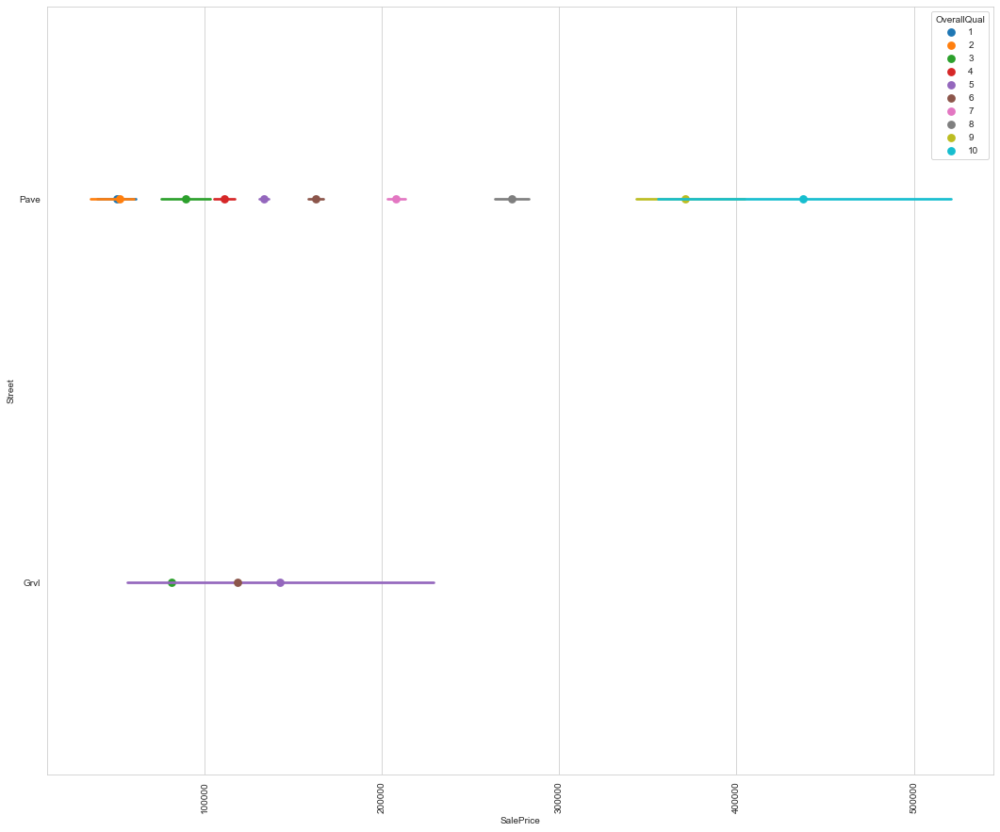

...

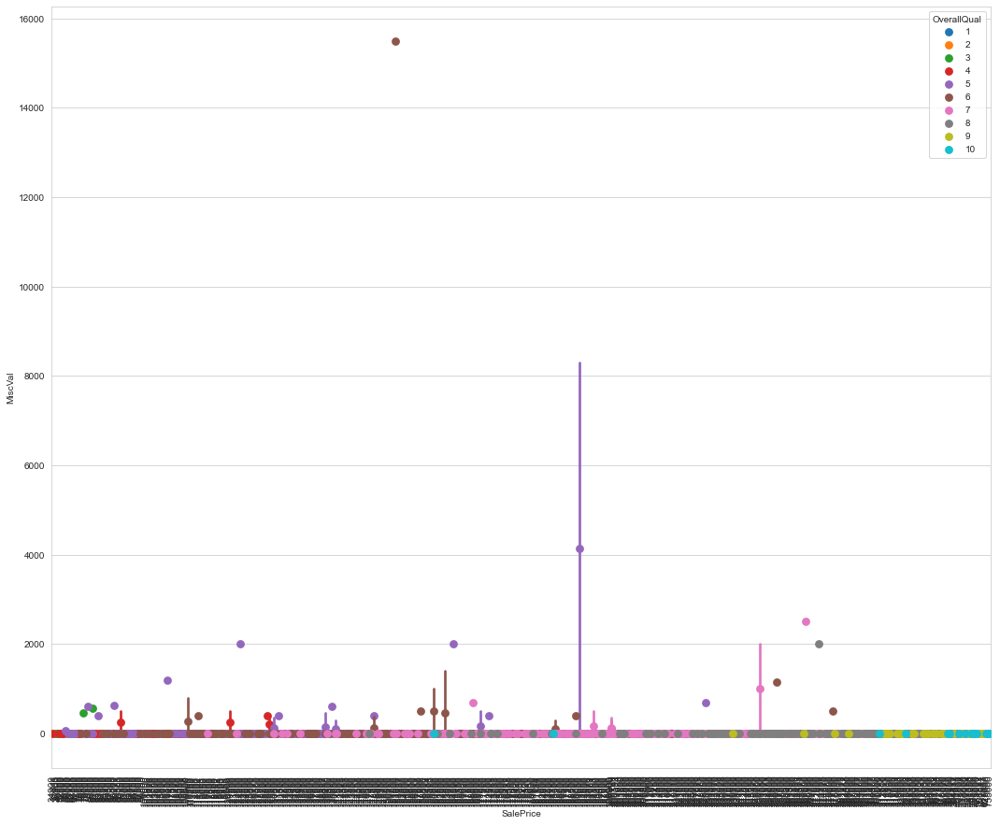

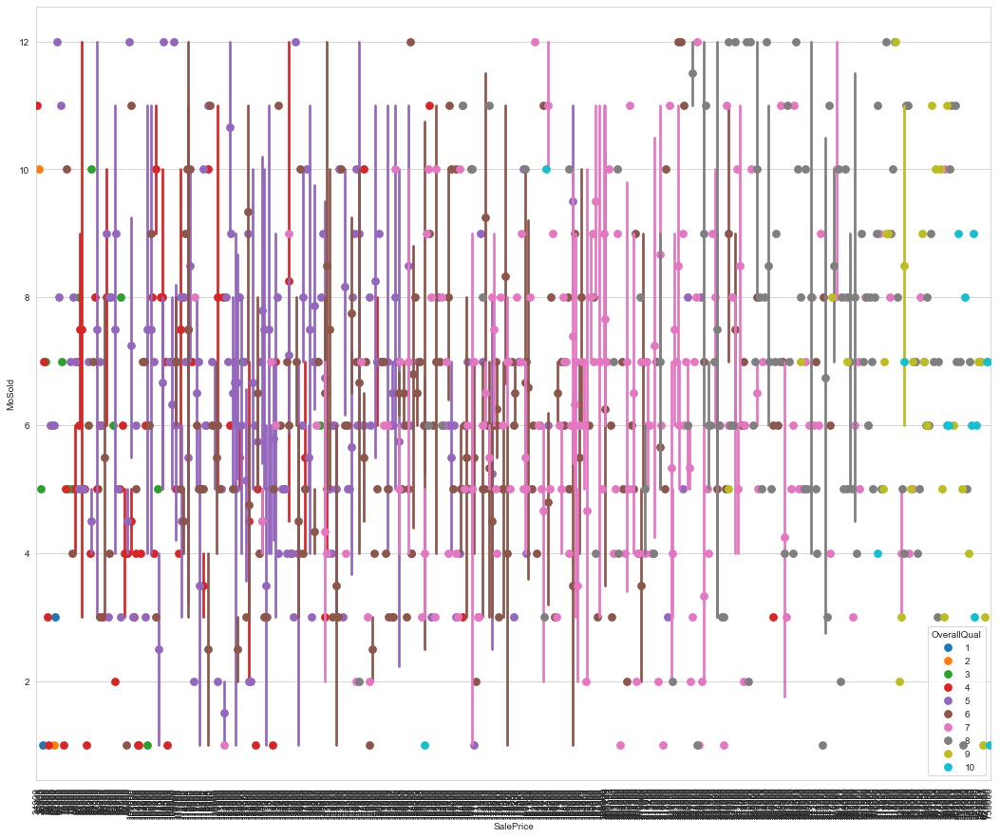

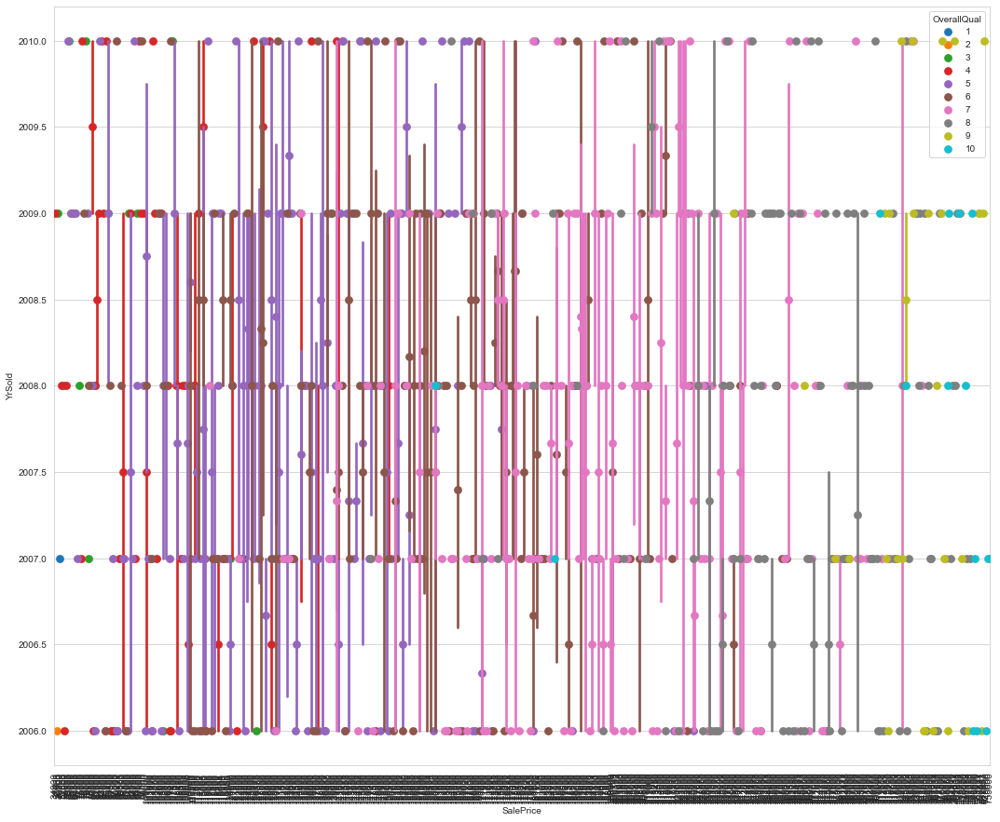

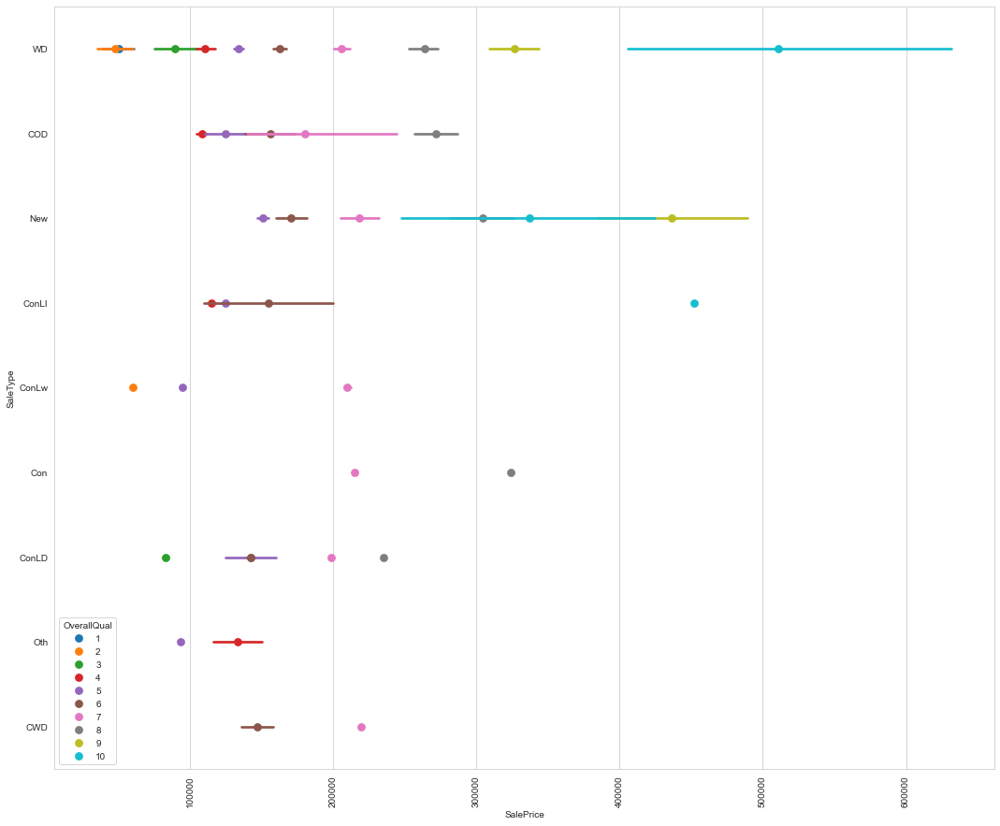

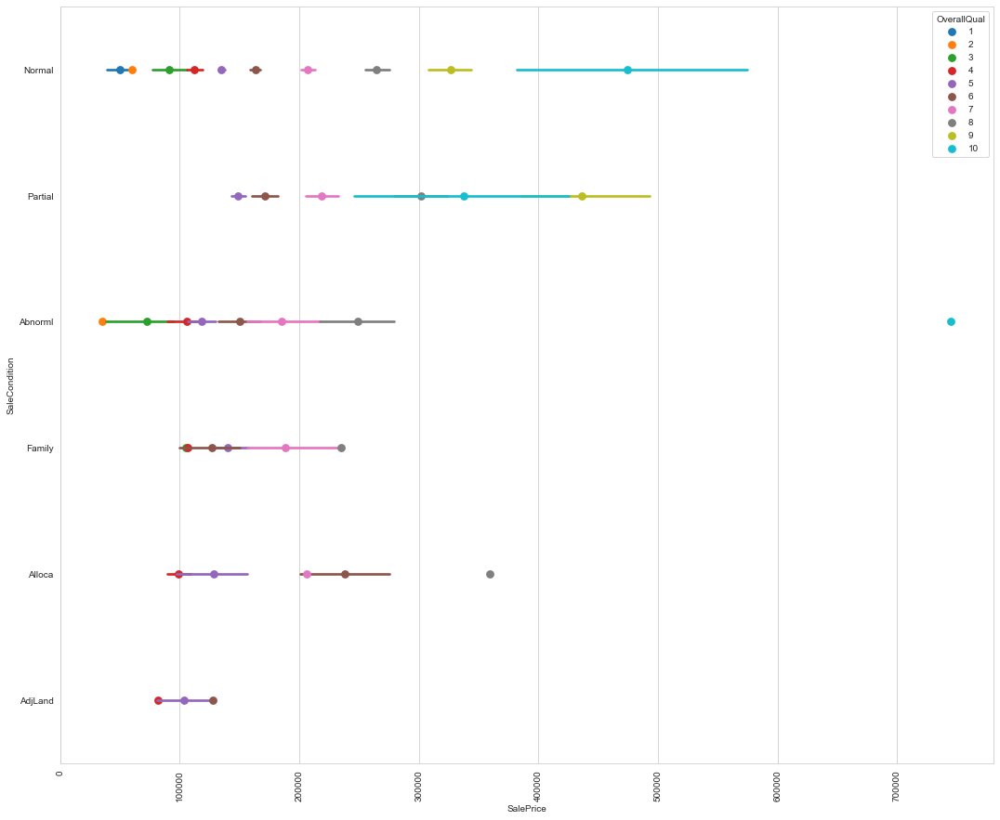

In [110]:
dg=df_train.drop(columns=["SalePrice","OverallQual"],axis=1)
dgc=dg.columns
for t in dgc:
    multi(t)

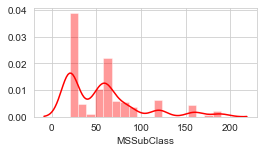

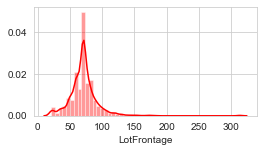

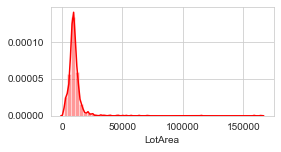

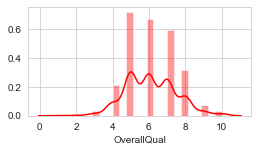

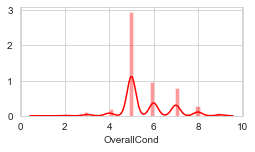

...

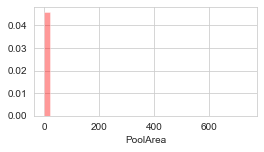

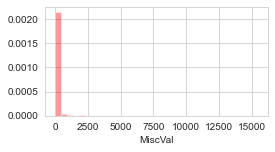

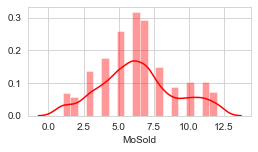

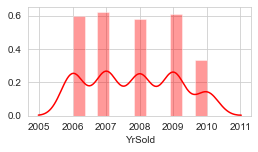

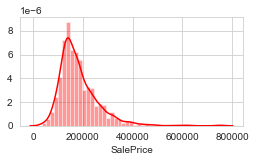

In [111]:
#lets plot the distplot for looking the skewness
for i in df_train.describe().columns:
    if df_train[i].dtypes!="object":
        plt.figure(figsize=[4,2])
        sns.distplot(df_train[i],color='red')
        plt.show()

# OUTLIER REMOVING TRAIN DATASET

In [26]:
#Making function to remove the outliers with IQR hypertuning
df=df_train.copy()
Q1=df.quantile(0.010)
Q3=df.quantile(0.99)
IQR=Q3-Q1
df_new=df[~((df<(Q1-1.5*IQR))|(df>(Q3+1.5*IQR))).any(axis=1)]
loss_=((len(df)-len(df_new))/len(df))*100
print(df_new.shape,df.shape)
print("Data Loss % is →→",loss_)


(1154, 81) (1168, 81)
Data Loss % is →→ 1.1986301369863013


In [113]:
df_new.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,120,RL,70.98847,4928,Pave,missing,IR1,Lvl,AllPub,Inside,...,0,missing,missing,missing,0,2,2007,WD,Normal,128000
1,20,RL,95.00000,15865,Pave,missing,IR1,Lvl,AllPub,Inside,...,0,missing,missing,missing,0,10,2007,WD,Normal,268000
2,60,RL,92.00000,9920,Pave,missing,IR1,Lvl,AllPub,CulDSac,...,0,missing,missing,missing,0,6,2007,WD,Normal,269790
3,20,RL,105.00000,11751,Pave,missing,IR1,Lvl,AllPub,Inside,...,0,missing,MnPrv,missing,0,1,2010,COD,Normal,190000
4,20,RL,70.98847,16635,Pave,missing,IR1,Lvl,AllPub,FR2,...,0,missing,missing,missing,0,6,2009,WD,Normal,215000


# DATA PREPROCESSING TRAIN DATA

In [27]:
#label encoder
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
d=df_new.columns
for i in d:
    if df_new[i].dtypes=='object':
        df_new[i]=l.fit_transform(df_new[i])

In [28]:
#lets split the data
df_x1=df_new.drop(columns='SalePrice',axis=1)
y=df_new[['SalePrice']]

In [29]:
f=df_x1.columns
for i in f:
    if df_x1[i].dtypes!='object':
        if df_x1[i].skew()>0.55:
            df_x1[i]=np.sqrt(df_x1[i])


# DATA SCALLING TRAIN DATASET

In [30]:
#sacalling the data
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x1=sc.fit_transform(df_x1)
df_x=pd.DataFrame(x1,columns=df_x1.columns)
df_x.shape

(1154, 80)

# PCA TRAIN DATASET

In [31]:
#pca
from sklearn.decomposition import PCA
cover_matrix=PCA(n_components=len(df_x.columns))
cover_matrix.fit(df_x)


PCA(n_components=80)

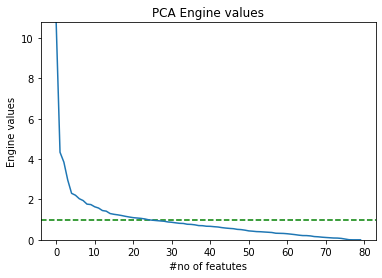

In [32]:
plt.ylabel("Engine values")
plt.xlabel("#no of featutes")
plt.title("PCA Engine values")
plt.ylim(0,max(cover_matrix.explained_variance_))
plt.axhline(y=1,color='g',linestyle='--')
plt.plot(cover_matrix.explained_variance_)
plt.show()

In [33]:
pc=PCA(n_components=20)
x1=pc.fit_transform(df_x)
df_x=pd.DataFrame(x1)

#   

# 

# lets do the all Necessary step for test dataset

In [11]:
#Handeling the Nanvalues in test data set
Handel_Nan(df_test)

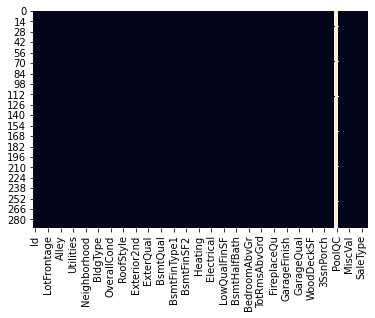

In [12]:
sns.heatmap(df_test.isnull(),cbar=False)

In [13]:
df_test.drop(columns='PoolQC',axis=1,inplace=True)

In [14]:
df_test.drop(columns='Id',axis=1,inplace=True)

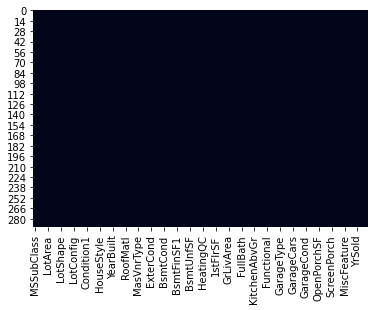

In [15]:
sns.heatmap(df_test.isnull(),cbar=False)

In [16]:
df_test.isnull().values.any()

False

In [17]:
#removing the Outliers from Test dataset
#Making function to remove the outliers with IQR hypertuning
df5=df_test.copy()
Q1=df5.quantile(0.010)
Q3=df5.quantile(0.99)
IQR=Q3-Q1
df5_test=df5[~((df5<(Q1-1.5*IQR))|(df5>(Q3+1.5*IQR))).any(axis=1)]
loss_=((len(df5)-len(df5_test))/len(df5))*100
print(df5_test.shape,df5.shape)
print("Data Loss % is →→",loss_)

(285, 78) (292, 78)
Data Loss % is →→ 2.3972602739726026


In [18]:
#encoding the objective data of test dataset
#label encoder
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
d=df5_test.columns
for i in d:
    if df5_test[i].dtypes=='object':
        df5_test[i]=l.fit_transform(df5_test[i])

In [19]:
#Removing Skewness
s=df5_test.columns
for i in s:
    if df5_test[i].dtypes!='object':
        if df5_test[i].skew()>0.55:
            df5_test[i]=np.sqrt(df5_test[i])

In [20]:
#sacalling the data of test Dataset
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x6=sc.fit_transform(df5_test)
df5_test_new_x=pd.DataFrame(x6,columns=df5_test.columns)
df5_test_new_x.shape

(285, 78)

In [35]:
pc=PCA(n_components=20)
x7=pc.fit_transform(df5_test_new_x)
df_x_test2=pd.DataFrame(x7)

# model creation

In [22]:
#In this data set we know that out target variable Saleprice is continuous so we are going to take Linear regresson
#lets make a function for getting the best random_satae for a model toget better accuracy(r2_score)
import math
final_random_state=[]
regressor=[]
Highest_acc=[]
MSE=[]
MAE=[]
RMSE=[]
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split
def max_r2score(rgr,x,y):
    max_acc=0
    for rd in range(42,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=rd,test_size=0.20)
        rgr.fit(x_train,y_train)
        prd=rgr.predict(x_test)
        acc=r2_score(y_test,prd)
        if acc>max_acc:
            max_acc=acc
            final_rd=rd
    mse=mean_squared_error(y_test,prd)#mean_squared_error
    mae=mean_absolute_error(y_test,prd)#mean_absolute_error
    rmse=math.sqrt(mse)#Root Mean Square Error
    print("max ccuracy score coresponding to ",final_rd,"♫is♫",max_acc*100)
    print("Mean_Squared_Error is: ",mse)
    print("Mean_Absolute_Error is: ",mae)
    print("Root Mean_Squared_Error is: ",rmse)
    final_random_state.append(final_rd)
    regressor.append(rgr)
    Highest_acc.append(max_acc*100)
    MSE.append(mse)
    MAE.append(mae)
    RMSE.append(rmse)
    return final_rd 

In [133]:
from sklearn.linear_model import LinearRegression
lnr=LinearRegression()

In [134]:
max_r2score(lnr,df_x,y)

max ccuracy score coresponding to  66 ♫is♫ 86.25230246661002
Mean_Squared_Error is:  1356301968.8387637
Mean_Absolute_Error is:  23375.378104087064
Root Mean_Squared_Error is:  36828.00522481178


66

In [135]:
from sklearn.model_selection import learning_curve
def lnc(model,g):
    x_train,x_test,y_train,y_test=train_test_split(df_x,y,random_state=g,test_size=0.20)
    lc=learning_curve(model,x_train,y_train,cv=10)
    size=lc[0]
    train_score=[lc[1][i].mean() for i in range (0,5)]
    test_score=[lc[2][i].mean() for i in range (0,5)]
    fig=plt.figure(figsize=(12,8))
    plt.plot(size,train_score,color="red")
    plt.plot(size,test_score,color="green")

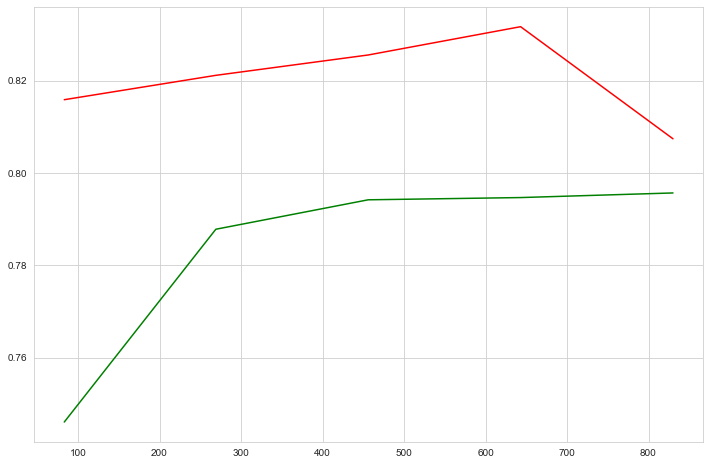

In [136]:
lnc(lnr,66)

In [137]:
#lets make a function for cross_val_score
cvs=[]
from sklearn.model_selection import cross_val_score   
def k(model,x,y):
    c=cross_val_score(model,x,y,cv=5,scoring="r2")
    print("mean accuracy score for ",model,c.mean())
    print("Standard deviation  in accuracy score for ",model,c.std())
    print()
    print("******************************************************")
    print("After seen the cross validation score of",model,"the accuracy score mean is",c.mean())
    cvs.append(c.mean())

In [138]:
k(lnr,df_x,y)

mean accuracy score for  LinearRegression() 0.8098825952400496
Standard deviation  in accuracy score for  LinearRegression() 0.028373110948810697

******************************************************
After seen the cross validation score of LinearRegression() the accuracy score mean is 0.8098825952400496


In [139]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
kn=KNeighborsRegressor()
parameters={"n_neighbors":range(1,100,2)}
def grid(algoritrhm,params):
    greg=GridSearchCV(algoritrhm,params,cv=5,scoring="r2")
    greg.fit(df_x,y)
    print(greg.best_params_)
    print("►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►")
grid(kn,parameters)

{'n_neighbors': 5}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [151]:
kn=KNeighborsRegressor(n_neighbors=5)
max_r2score(kn,df_x,y)

max ccuracy score coresponding to  97 ♫is♫ 85.44724315830479
Mean_Squared_Error is:  1751755874.5845888
Mean_Absolute_Error is:  23525.982683982686
Root Mean_Squared_Error is:  41853.98278043069


97

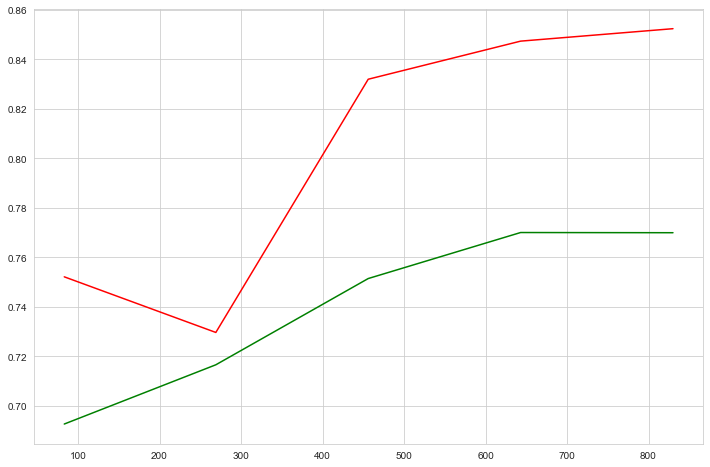

In [152]:
lnc(kn,97)

In [153]:
k(kn,df_x,y)

mean accuracy score for  KNeighborsRegressor() 0.7832559698763444
Standard deviation  in accuracy score for  KNeighborsRegressor() 0.019141308996445165

******************************************************
After seen the cross validation score of KNeighborsRegressor() the accuracy score mean is 0.7832559698763444


In [140]:
from sklearn.svm import SVR
svr=SVR()
parameters={"kernel":["linear","poly","rbf"],"C":[0.0001,0.001,0.01,0.1,1.0]}
grid(svr,parameters)

{'C': 1.0, 'kernel': 'linear'}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [154]:
sv=SVR(kernel="linear",C=1.0)
max_r2score(sv,df_x,y)

max ccuracy score coresponding to  71 ♫is♫ 19.452248632674383
Mean_Squared_Error is:  5351609022.850148
Mean_Absolute_Error is:  51270.68564984902
Root Mean_Squared_Error is:  73154.69241853285


71

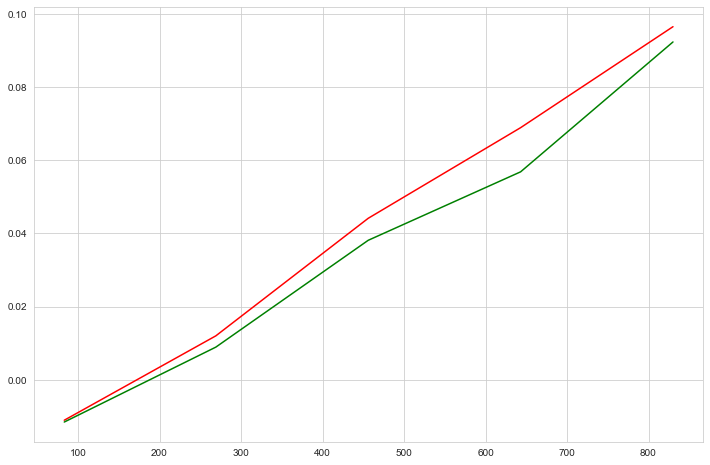

In [155]:
lnc(sv,71)

In [156]:
k(sv,df_x,y)

mean accuracy score for  SVR(kernel='linear') 0.1037303223757027
Standard deviation  in accuracy score for  SVR(kernel='linear') 0.049331758955839675

******************************************************
After seen the cross validation score of SVR(kernel='linear') the accuracy score mean is 0.1037303223757027


In [141]:
from sklearn.linear_model import Lasso,Ridge,ElasticNet
la=Lasso()
rd=Ridge()
el=ElasticNet()
reg=[la,rd,el]
parameters={"alpha":[0.00001,0.0001,0.001,0.01,0.1,1.0]}
for i in reg:
    print(i)
    grid(i,parameters)

Lasso()
{'alpha': 1.0}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
Ridge()
{'alpha': 1.0}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►
ElasticNet()
{'alpha': 0.1}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [157]:
la=Lasso(alpha=1.0)
max_r2score(la,df_x,y)

max ccuracy score coresponding to  66 ♫is♫ 86.25231124378632
Mean_Squared_Error is:  1356282225.9961534
Mean_Absolute_Error is:  23375.458981314772
Root Mean_Squared_Error is:  36827.7371826746


66

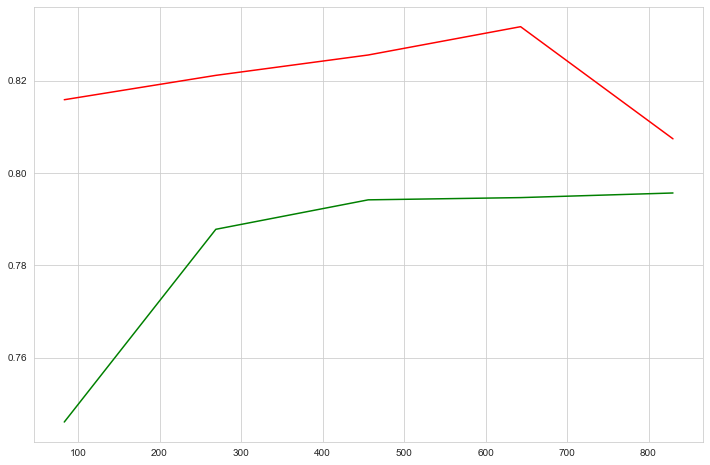

In [158]:
lnc(la,66)

In [159]:
k(la,df_x,y)

mean accuracy score for  Lasso() 0.8098852596788287
Standard deviation  in accuracy score for  Lasso() 0.02837080295710422

******************************************************
After seen the cross validation score of Lasso() the accuracy score mean is 0.8098852596788287


In [160]:
rd=Ridge(alpha=1.0)
max_r2score(la,df_x,y)

max ccuracy score coresponding to  66 ♫is♫ 86.25231124378632
Mean_Squared_Error is:  1356282225.9961534
Mean_Absolute_Error is:  23375.458981314772
Root Mean_Squared_Error is:  36827.7371826746


66

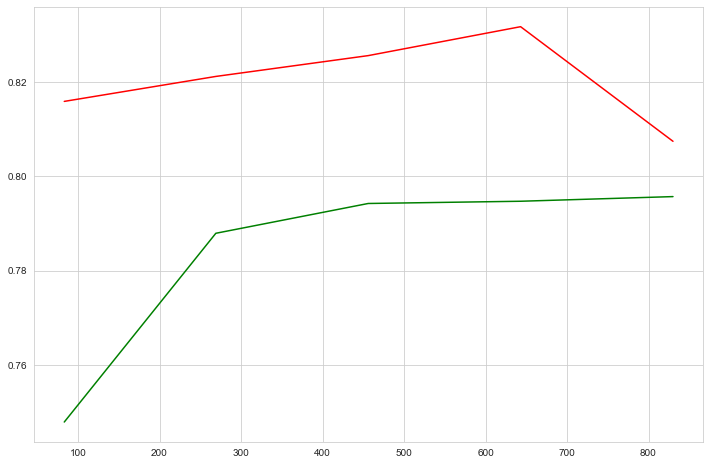

In [161]:
lnc(rd,66)

In [162]:
k(rd,df_x,y)

mean accuracy score for  Ridge() 0.8098908872627495
Standard deviation  in accuracy score for  Ridge() 0.028369108695910784

******************************************************
After seen the cross validation score of Ridge() the accuracy score mean is 0.8098908872627495


In [163]:
el=ElasticNet(alpha=0.1)
max_r2score(el,df_x,y)

max ccuracy score coresponding to  66 ♫is♫ 86.17971846255583
Mean_Squared_Error is:  1348316959.2249513
Mean_Absolute_Error is:  23313.48652085021
Root Mean_Squared_Error is:  36719.43571495825


66

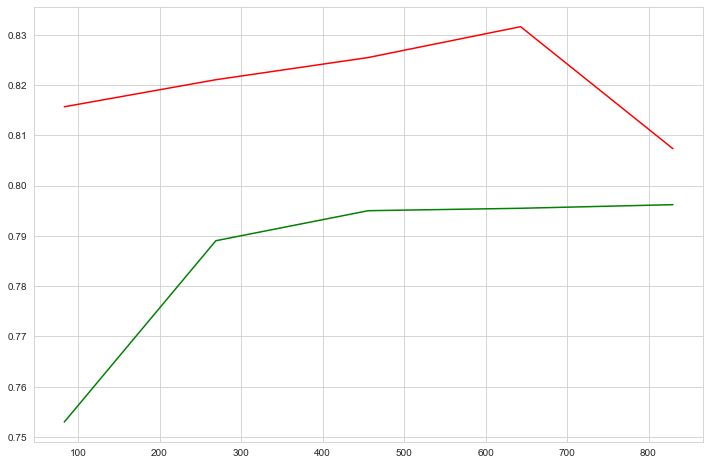

In [164]:
lnc(el,66)

In [165]:
k(el,df_x,y)

mean accuracy score for  ElasticNet(alpha=0.1) 0.8101964695911104
Standard deviation  in accuracy score for  ElasticNet(alpha=0.1) 0.02820193465689792

******************************************************
After seen the cross validation score of ElasticNet(alpha=0.1) the accuracy score mean is 0.8101964695911104


In [142]:
from sklearn.tree import DecisionTreeRegressor
dct=DecisionTreeRegressor()
parameters={"criterion":["mse","mae","friedman_mse","poisson"],"max_depth":range(1,250,5)}
grid(dct,parameters)

{'criterion': 'friedman_mse', 'max_depth': 6}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [166]:
dct=DecisionTreeRegressor(criterion='friedman_mse',max_depth=6)
max_r2score(dct,df_x,y)

max ccuracy score coresponding to  80 ♫is♫ 84.73363462851323
Mean_Squared_Error is:  3209590073.479606
Mean_Absolute_Error is:  27510.37830883667
Root Mean_Squared_Error is:  56653.24415670833


80

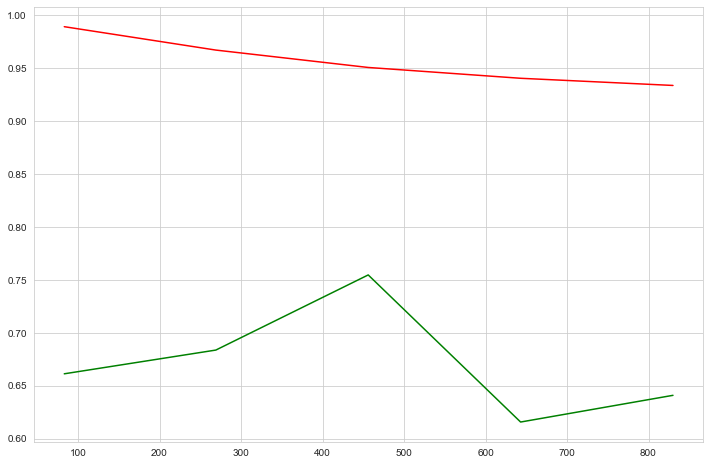

In [167]:
lnc(dct,80)

In [168]:
k(dct,df_x,y)

mean accuracy score for  DecisionTreeRegressor(criterion='friedman_mse', max_depth=6) 0.6857720446864536
Standard deviation  in accuracy score for  DecisionTreeRegressor(criterion='friedman_mse', max_depth=6) 0.1322537483757649

******************************************************
After seen the cross validation score of DecisionTreeRegressor(criterion='friedman_mse', max_depth=6) the accuracy score mean is 0.6857720446864536


In [143]:
from sklearn.ensemble import RandomForestRegressor
rnd=RandomForestRegressor()
param={"n_estimators":range(1,1000,50)}
grid(rnd,param)

{'n_estimators': 151}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [169]:
rnd=RandomForestRegressor(n_estimators=151)
max_r2score(rnd,df_x,y)

max ccuracy score coresponding to  68 ♫is♫ 90.90998405343846
Mean_Squared_Error is:  1693316423.1968484
Mean_Absolute_Error is:  21608.134084458587
Root Mean_Squared_Error is:  41149.926162714415


68

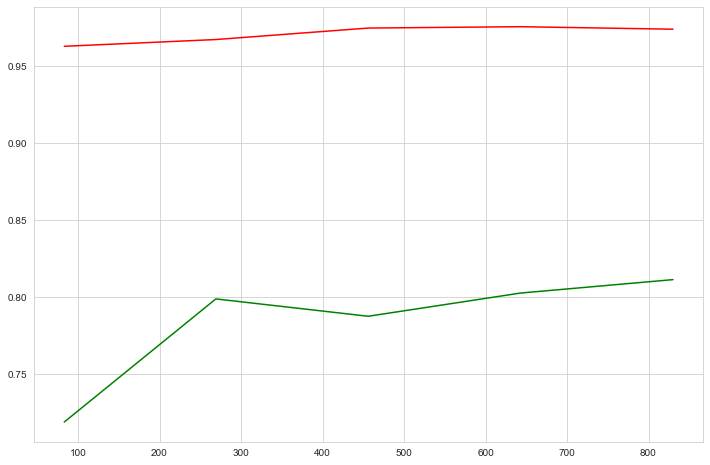

In [170]:
lnc(rnd,68)

In [171]:
k(rnd,df_x,y)

mean accuracy score for  RandomForestRegressor(n_estimators=151) 0.841444470083896
Standard deviation  in accuracy score for  RandomForestRegressor(n_estimators=151) 0.02905537384366058

******************************************************
After seen the cross validation score of RandomForestRegressor(n_estimators=151) the accuracy score mean is 0.841444470083896


In [144]:
from sklearn.ensemble import GradientBoostingRegressor
grd=GradientBoostingRegressor()

In [145]:
par={"learning_rate":[0.0001,0.001,0.01,0.1,1.0],"n_estimators":range(100,1000,50)}
grid(grd,par)

{'learning_rate': 0.1, 'n_estimators': 100}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [172]:
grd=GradientBoostingRegressor(learning_rate= 0.1,n_estimators= 100)
max_r2score(grd,df_x,y)

max ccuracy score coresponding to  53 ♫is♫ 90.78724032856213
Mean_Squared_Error is:  1671731181.4924703
Mean_Absolute_Error is:  21044.795936342613
Root Mean_Squared_Error is:  40886.809382641615


53

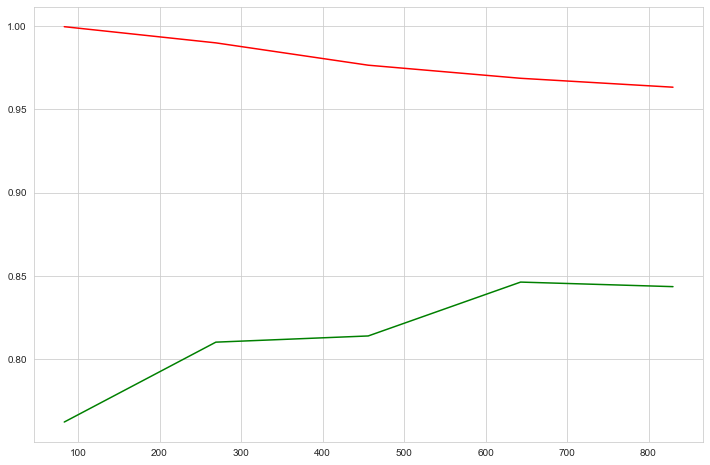

In [173]:
lnc(grd,86)

In [174]:
k(grd,df_x,y)

mean accuracy score for  GradientBoostingRegressor() 0.8328050407229762
Standard deviation  in accuracy score for  GradientBoostingRegressor() 0.03278156519443649

******************************************************
After seen the cross validation score of GradientBoostingRegressor() the accuracy score mean is 0.8328050407229762


In [146]:
from sklearn.ensemble import BaggingRegressor
bg=BaggingRegressor()
parameters={"n_estimators":range(1,1000,100)}
grid(bg,parameters)

{'n_estimators': 701}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [175]:
bg=BaggingRegressor(n_estimators=701)
max_r2score(bg,df_x,y)

max ccuracy score coresponding to  68 ♫is♫ 90.93471787520309
Mean_Squared_Error is:  1655427188.8497531
Mean_Absolute_Error is:  21522.483730724816
Root Mean_Squared_Error is:  40686.94125698998


68

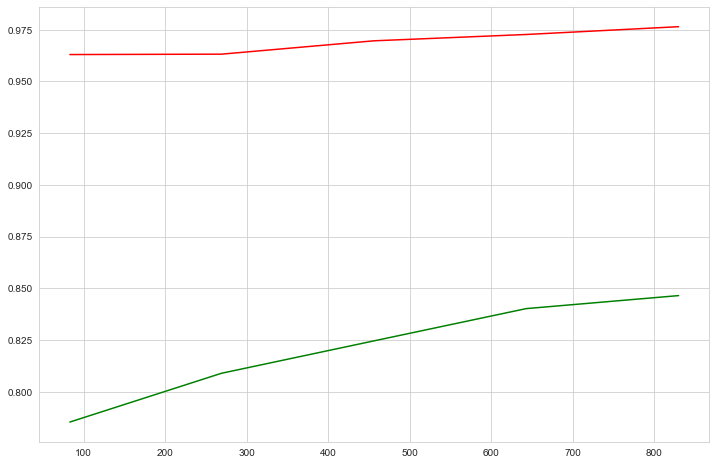

In [176]:
lnc(bg,86)

In [177]:
k(bg,df_x,y)

mean accuracy score for  BaggingRegressor(n_estimators=701) 0.8407596194841848
Standard deviation  in accuracy score for  BaggingRegressor(n_estimators=701) 0.02897580083521004

******************************************************
After seen the cross validation score of BaggingRegressor(n_estimators=701) the accuracy score mean is 0.8407596194841848


In [147]:
from xgboost import XGBRegressor
    xg=XGBRegressor()

In [148]:
max_r2score(xg,df_x,y)

max ccuracy score coresponding to  68 ♫is♫ 91.0642679717361
Mean_Squared_Error is:  2131154976.5336204
Mean_Absolute_Error is:  22677.04719629329
Root Mean_Squared_Error is:  46164.43410823553


68

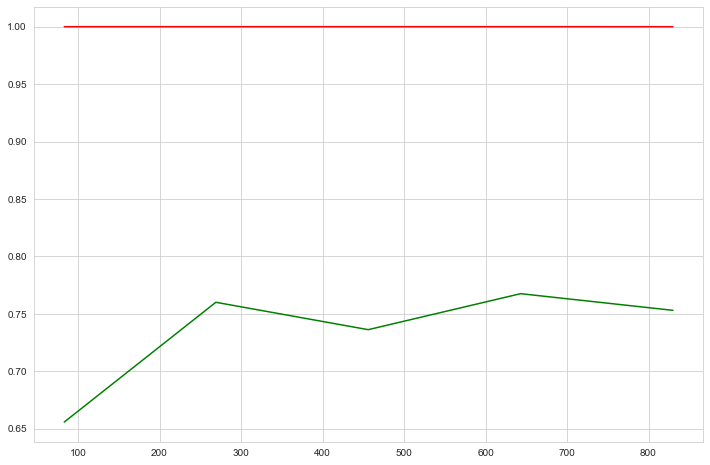

In [178]:
lnc(xg,68)

In [179]:
k(xg,df_x,y)

mean accuracy score for  XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None) 0.8058883113798772
Standard deviation  in accuracy score for  XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constra

In [149]:
from sklearn.ensemble import ExtraTreesRegressor
ext=ExtraTreesRegressor()
params={"n_estimators":range(1,1000,200)}
grid(ext,params)

{'n_estimators': 601}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [23]:
from sklearn.ensemble import ExtraTreesRegressor

In [180]:
ext=ExtraTreesRegressor(n_estimators=601)
max_r2score(ext,df_x,y)

max ccuracy score coresponding to  68 ♫is♫ 91.13391571565539
Mean_Squared_Error is:  1762357377.579699
Mean_Absolute_Error is:  20775.110868610034
Root Mean_Squared_Error is:  41980.44041669524


68

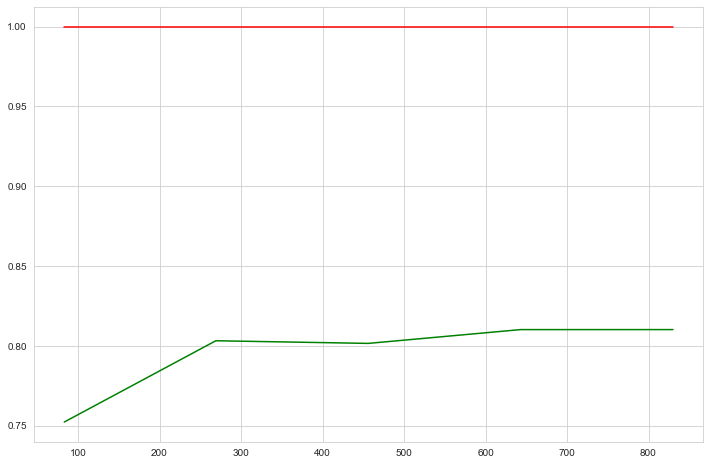

In [181]:
lnc(ext,68)

In [182]:
k(ext,df_x,y)

mean accuracy score for  ExtraTreesRegressor(n_estimators=601) 0.8376524978305253
Standard deviation  in accuracy score for  ExtraTreesRegressor(n_estimators=601) 0.04381993806760836

******************************************************
After seen the cross validation score of ExtraTreesRegressor(n_estimators=601) the accuracy score mean is 0.8376524978305253


In [150]:
from sklearn.ensemble import AdaBoostRegressor
adb=AdaBoostRegressor()
params={"n_estimators":range(1,1000,200),"learning_rate":[0.0001,0.001,0.01,0.1,1.0],
        "loss":["linear","square","exponential"]}
grid(adb,params)


{'learning_rate': 0.01, 'loss': 'exponential', 'n_estimators': 801}
►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►►


In [183]:
adb=AdaBoostRegressor(n_estimators=801,learning_rate=0.01,loss="exponential")
max_r2score(adb,df_x,y)

max ccuracy score coresponding to  53 ♫is♫ 85.22770140196447
Mean_Squared_Error is:  2424014534.722897
Mean_Absolute_Error is:  27270.11664741221
Root Mean_Squared_Error is:  49234.28210833278


53

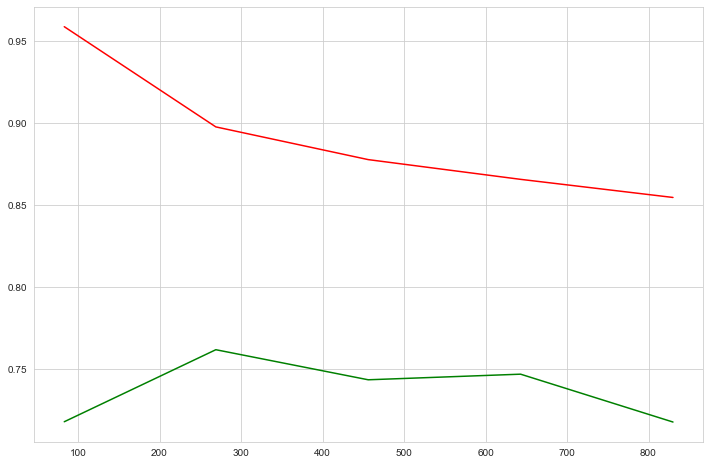

In [184]:
lnc(adb,53)

In [185]:
k(adb,df_x,y)

mean accuracy score for  AdaBoostRegressor(learning_rate=0.01, loss='exponential', n_estimators=801) 0.7929416097200012
Standard deviation  in accuracy score for  AdaBoostRegressor(learning_rate=0.01, loss='exponential', n_estimators=801) 0.02747088643178843

******************************************************
After seen the cross validation score of AdaBoostRegressor(learning_rate=0.01, loss='exponential', n_estimators=801) the accuracy score mean is 0.7929416097200012


In [186]:
Result=pd.DataFrame({"Algorithm Name":regressor,"Random sate":final_random_state,
                    "Accuracy":Highest_acc,"Cross_Val_score":cvs,"Mean_Squared_Error":MSE,
                    "Mean_Absolute_Error":MAE,"Root Mean_Squared_Error":RMSE})

In [187]:
Result

,Algorithm Name,Random sate,Accuracy,Cross_Val_score,Mean_Squared_Error,Mean_Absolute_Error,Root Mean_Squared_Error
0,LinearRegression(),66,86.252302,0.809883,1.356302e+09,23375.378104,36828.005225
1,"XGBRegressor(base_score=0.5, booster='gbtree',...",68,91.064268,0.783256,2.131155e+09,22677.047196,46164.434108
2,KNeighborsRegressor(),97,85.447243,0.103730,1.751756e+09,23525.982684,41853.982780
3,SVR(kernel='linear'),71,19.452249,0.809885,5.351609e+09,51270.685650,73154.692419
4,Lasso(),66,86.252311,0.809891,1.356282e+09,23375.458981,36827.737183
5,Lasso(),66,86.252311,0.810196,1.356282e+09,23375.458981,36827.737183
6,ElasticNet(alpha=0.1),66,86.179718,0.685772,1.348317e+09,23313.486521,36719.435715
7,DecisionTreeRegressor(criterion='friedman_mse'...,80,84.733635,0.841444,3.209590e+09,27510.378309,56653.244157
8,"(DecisionTreeRegressor(max_features='auto', ra...",68,90.909984,0.832805,1.693316e+09,21608.134084,41149.926163
9,([DecisionTreeRegressor(criterion='friedman_ms...,53,90.787240,0.840760,1.671731e+09,21044.795936,40886.809383


In [36]:
#after seen the above table i am going to finalise my model with ExtraTreeRegressor()
#with the random sate of 68
ext=ExtraTreesRegressor(n_estimators=601)
x_train,x_test,y_train,y_test=train_test_split(df_x,y,random_state=68,test_size=0.20)
ext.fit(x_train,y_train)
prd=ext.predict(x_test)
accuracy=r2_score(y_test,prd)
print(accuracy)
print("Mean_Squared_Error is: ",mean_squared_error(y_test,prd))
print("Mean_Absolute_Error is: ",mean_absolute_error(y_test,prd))
print("Root Mean_Squared_Error is: ",math.sqrt(mean_squared_error(y_test,prd)))

0.915338732231104
Mean_Squared_Error is:  522330484.1368371
Mean_Absolute_Error is:  16130.705426021568
Root Mean_Squared_Error is:  22854.55062207168


In [37]:
#lets Save The Model
import joblib #importing the joblib
joblib.dump(ext,'Housing_saleprice_.pkl')

['Housing_saleprice_.pkl']

In [38]:
#saving the predict value as csv
joblib.dump(ext,'Housing_saleprice_.csv')

['Housing_saleprice_.csv']

In [39]:
#lets call the model and test the Test data
model=joblib.load('Housing_saleprice_.csv')
model.predict(df_x_test2)

array([340234.281198  , 196766.72712146, 243268.22296173, 150926.89517471,
       239868.30116473, 100247.01830283, 184671.63893511, 311850.5906822 ,
       261110.50748752, 206988.14808652,  86269.13144759, 136662.2562396 ,
       121559.29284526, 263530.43261231, 315734.37104825,  97729.31780366,
       128841.43094842, 117755.36272879, 202069.36272879, 197094.50915141,
       123776.40765391, 163006.21131448, 159271.4093178 , 100528.59400998,
       140509.48419301, 184416.73544093, 147492.60066556, 170028.84026622,
        92523.94675541, 164336.41430948, 192940.02995008, 240461.29118136,
       159774.81863561,  90202.77371048, 191100.21797005, 197679.10981697,
       129053.75207987, 161730.14309484, 169099.78036606, 110959.7171381 ,
       282675.05324459, 204311.87687188, 188874.24792013, 159091.99168053,
       116211.65890183, 117429.65723794,  89369.12146423, 254391.9234609 ,
       349615.67387687, 135441.28452579, 202080.60066556, 106073.42762063,
        73470.72212978, 2